* [Section 0: Libraries to import](scrollTo=02amEA_KgZz8)
* [Section 1: Analysing basic metrics with feature engineering to extract new features](scrollTo=D6Er27ybgw7U)
  1. [Section 1.1: BiVariant Analysis](scrollTo=oze0BE5DB9XW)
* [Section 2: preprocessing of data](scrollTo=LQy2wAes7KA5)
  1. [Section 2.1: EDA on views vs language for given dataset](scrollTo=rq-mqZ_MB9XY)
* [Section 3: Checking stationarity](scrollTo=ZFv0H5R7EriS)
  1. [Section 3.1: data preparation and metrics functions](scrollTo=ecsliR3F5buZ)
* [Section 4: Creating model training and forecasting with ARIMA](scrollTo=HgGGOoi1w1q0)
* [Section 5: Creating model training and forecasting with SARIMA](scrollTo=WDLTzOCE4z-j)
* [Section 6: Creating model training and forecasting with SARIMAX](scrollTo=_o_2upiCSRsM)
* [Section 7: Creation of Custom Pipeline and Capturing results for all languages](scrollTo=ulT1wpHYBLqh)
* [Section 8: Forecast of views for all languages](scrollTo=-KXEPANMB9Xh)
* [Section 9: Prophet](scrollTo=tt0vvPkuB9Xl)
* [Section 10: Insights and Recommendations](scrollTo=qrddwuboB9Xm)




**Problem Statement:** 

1 Ad gency company trying to understand the per page view report for different wikipedia pages for 550 days, and forecasting the number of views so that you can predict and optimize the ad placement for your clients. You are provided with the data of 145k wikipedia pages and daily view count for each of them. Your clients belong to different regions and need data on how their ads will perform on pages in different languages.

overhaul solution: We need to design time series forecasting model to analyse which language pages will have more views

# Section 0: Libraries to import

In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from datetime import datetime
import math
from scipy.stats import skew
from scipy.stats import boxcox
from matplotlib import pylab, mlab, pyplot
from scipy import stats
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, RidgeCV, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
#import category_encoders as ce
from sklearn.impute import KNNImputer
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
import plotly.graph_objects as go
import requests
import time
from multiprocessing import cpu_count
from multiprocessing.pool import ThreadPool
from scipy import stats

In [ ]:
totaldf=pd.read_csv(r'Data/train_1.csv')

In [ ]:
totaldf.head(25)

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
0,2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,...,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1,2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,...,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
2,3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,...,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
3,4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,...,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,48.0,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0
5,5566_zh.wikipedia.org_all-access_spider,12.0,7.0,4.0,5.0,20.0,8.0,5.0,17.0,24.0,...,16.0,27.0,8.0,17.0,32.0,19.0,23.0,17.0,17.0,50.0
6,91Days_zh.wikipedia.org_all-access_spider,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.0,7.0,33.0,8.0,11.0,4.0,15.0,6.0,8.0,6.0
7,A'N'D_zh.wikipedia.org_all-access_spider,118.0,26.0,30.0,24.0,29.0,127.0,53.0,37.0,20.0,...,64.0,35.0,35.0,28.0,20.0,23.0,32.0,39.0,32.0,17.0
8,AKB48_zh.wikipedia.org_all-access_spider,5.0,23.0,14.0,12.0,9.0,9.0,35.0,15.0,14.0,...,34.0,105.0,72.0,36.0,33.0,30.0,36.0,38.0,31.0,97.0
9,ASCII_zh.wikipedia.org_all-access_spider,6.0,3.0,5.0,12.0,6.0,5.0,4.0,13.0,9.0,...,25.0,17.0,22.0,29.0,30.0,29.0,35.0,44.0,26.0,41.0


In [ ]:
exogdf=pd.read_csv(r'Data/Exog_Campaign_eng.csv')
exogdf.head(3)

,Exog
0,0
1,0
2,0


# Section 1: Analysing basic metrics with feature engineering to extract new features

In [ ]:
totaldf.shape

(145063, 551)

In [ ]:
totaldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145063 entries, 0 to 145062
Columns: 551 entries, Page to 2016-12-31
dtypes: float64(550), object(1)
memory usage: 609.8+ MB


In [ ]:
totaldf.isna().sum()/totaldf.shape[0]

Page          0.000000
2015-07-01    0.142972
2015-07-02    0.143496
2015-07-03    0.141621
2015-07-04    0.142380
                ...   
2016-12-27    0.025513
2016-12-28    0.026347
2016-12-29    0.026375
2016-12-30    0.025058
2016-12-31    0.023886
Length: 551, dtype: float64

In [ ]:
def extractLanguageFrompage(strval):
  arrvals=[]
  if strval =="":
    return strval
  if str.__contains__(strval, '.wikipedia.org'):
    arrvals=strval.lower().split('.wikipedia.org')
  elif str.__contains__(strval, '.wikimedia.org'):
    arrvals=strval.lower().split('.wikimedia.org')
  if len(arrvals)==0:
    return None
  return arrvals[0].split('_')[-1]

In [ ]:
def extractAccesstypeFrompage(strval):
  arrvals=[]
  if strval =="":
    return strval
  if str.__contains__(strval, '.wikipedia.org_'):
    arrvals=strval.lower().split('.wikipedia.org_')
  elif str.__contains__(strval, '.wikimedia.org_'):
    arrvals=strval.lower().split('.wikimedia.org_')
  if len(arrvals)<1:
    return None
  return arrvals[1].split('_')[0]

In [ ]:
def extractOriginFrompage(strval):
  arrvals=[]
  if strval =="":
    return strval
  if str.__contains__(strval, '.wikipedia.org_'):
    arrvals=strval.lower().split('.wikipedia.org_')
  elif str.__contains__(strval, '.wikimedia.org_'):
    arrvals=strval.lower().split('.wikimedia.org_')
  if len(arrvals)<1:
    return None
  return arrvals[1].split('_')[1]

In [ ]:
totaldf['language']=totaldf['Page'].apply(extractLanguageFrompage)


In [ ]:
totaldf['ACCESS_TYPE']=totaldf['Page'].apply(extractAccesstypeFrompage)

In [ ]:
totaldf['ACCESS_ORIGIN']=totaldf['Page'].apply(extractOriginFrompage)

In [ ]:
totaldf['language'].value_counts(normalize=True)

en         0.174996
ja         0.148305
de         0.134630
fr         0.129222
zh         0.125063
ru         0.109042
es         0.102125
commons    0.076617
Name: language, dtype: float64

In [ ]:
totaldf['ACCESS_ORIGIN'].value_counts(normalize=True)

all-agents    0.759268
spider        0.240732
Name: ACCESS_ORIGIN, dtype: float64

In [ ]:
totaldf['ACCESS_TYPE'].value_counts(normalize=True)

all-access    0.514028
mobile-web    0.245610
desktop       0.240362
Name: ACCESS_TYPE, dtype: float64

**Univariant Analysis**

<AxesSubplot: xlabel='ACCESS_TYPE', ylabel='count'>

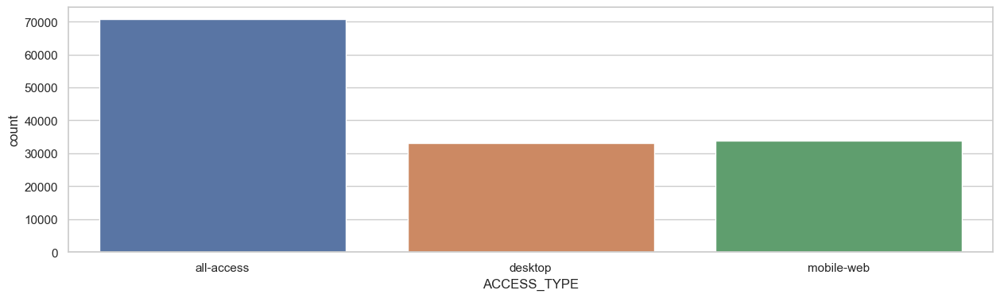

In [ ]:
import seaborn as sns
sns.set_theme(style="whitegrid")
sns.countplot(x=totaldf['ACCESS_TYPE'])

<AxesSubplot: xlabel='ACCESS_ORIGIN', ylabel='count'>

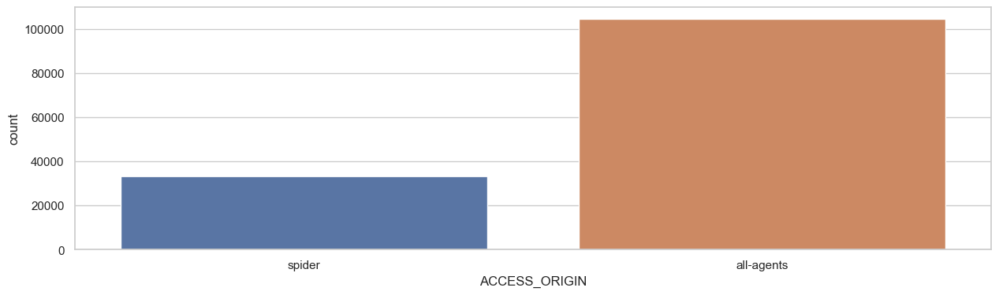

In [ ]:
sns.set_theme(style="whitegrid")
sns.countplot(x=totaldf['ACCESS_ORIGIN'])

<AxesSubplot: xlabel='language', ylabel='count'>

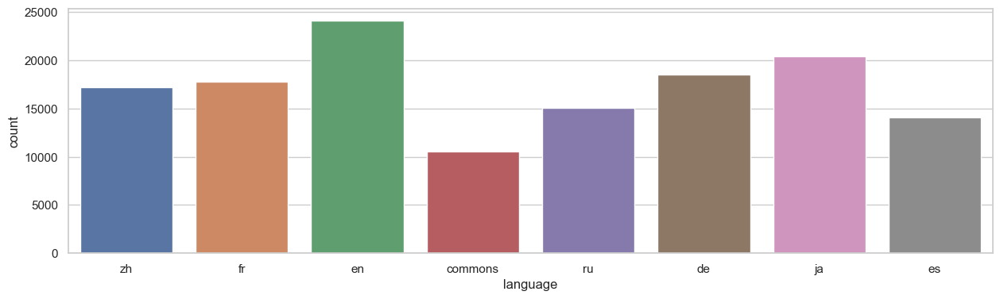

In [ ]:
sns.set_theme(style="whitegrid")
sns.countplot(x=totaldf['language'])

# BiVariant Analysis

<AxesSubplot: xlabel='language', ylabel='count'>

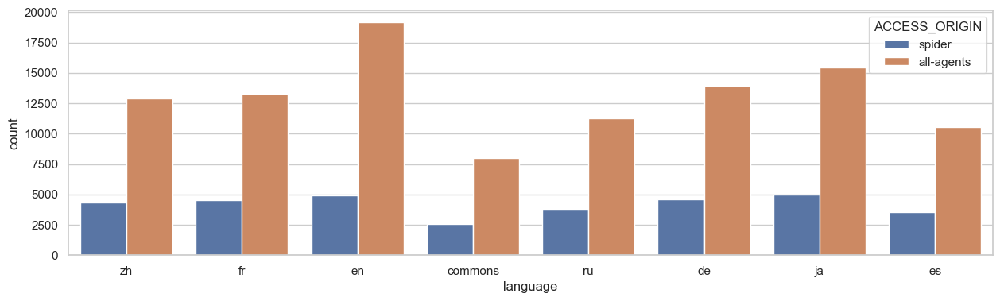

In [ ]:
sns.set_theme(style="whitegrid")
sns.countplot(data=totaldf,x='language',hue='ACCESS_ORIGIN')

Insight: ja,en,fr - having spider related access-origin type more.

<AxesSubplot: xlabel='language', ylabel='count'>

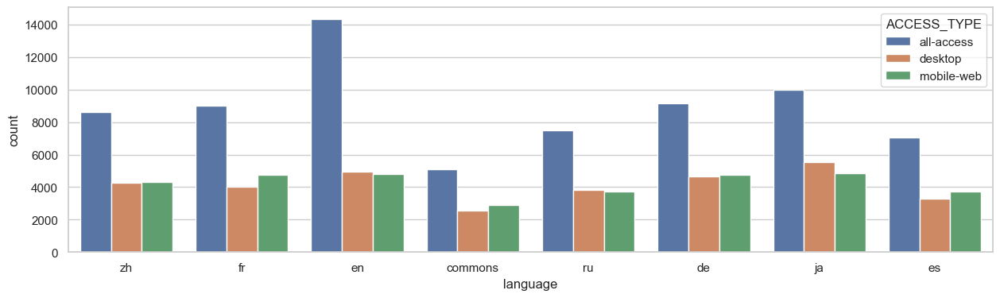

In [ ]:
sns.set_theme(style="whitegrid")
sns.countplot(data=totaldf,x='language',hue='ACCESS_TYPE')

Insight: all-access pages more on en-language,covering both desktop and mobile sites.
Insight: mobile web access related pages are more in fr,es,commons

# Section 2: preprocessing of data

In [ ]:
totaldf.loc[(totaldf['language'].isna())]

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31,language,ACCESS_TYPE,ACCESS_ORIGIN
19611,"""Keep_me_logged_in""_extended_to_one_year_www.m...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,15.0,11.0,15.0,10.0,14.0,7.0,12.0,None,None,None
19612,2017_wikitext_editor_www.mediawiki.org_all-acc...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,40.0,31.0,61.0,52.0,43.0,100.0,73.0,None,None,None
19613,2017_wikitext_editor/Feedback_www.mediawiki.or...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,17.0,21.0,52.0,48.0,32.0,41.0,19.0,None,None,None
19614,API_www.mediawiki.org_all-access_all-agents,528.0,587.0,634.0,483.0,510.0,559.0,625.0,594.0,565.0,...,598.0,283.0,399.0,334.0,351.0,358.0,275.0,None,None,None
19615,API:Account_creation_www.mediawiki.org_all-acc...,37.0,38.0,46.0,41.0,79.0,91.0,100.0,54.0,43.0,...,387.0,35.0,38.0,38.0,28.0,45.0,41.0,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84730,help:contents_www.mediawiki.org_all-access_spider,NaN,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0,...,15.0,7.0,18.0,17.0,15.0,3.0,11.0,None,None,None
84731,how_to_contribute_www.mediawiki.org_all-access...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,18.0,2.0,172.0,19.0,29.0,2.0,178.0,None,None,None
84732,mediawiki_www.mediawiki.org_all-access_spider,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,24.0,11.0,12.0,51.0,23.0,3.0,48.0,None,None,None
84733,special:book_www.mediawiki.org_all-access_spider,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,...,53.0,300.0,3.0,44.0,6.0,0.0,154.0,None,None,None


In [ ]:
totaldf.loc[totaldf['language'].isna()].shape[0]/totaldf.shape[0]

0.050322963126365784

In [ ]:
# these all dont have any language attached to them, we can discard these rows
totaldf=totaldf.loc[~(totaldf['language'].isna())]

In [ ]:
totaldf.fillna(0.0,inplace=True)

In [ ]:
totaldf.isna().sum()/totaldf.shape[0]

Page             0.0
2015-07-01       0.0
2015-07-02       0.0
2015-07-03       0.0
2015-07-04       0.0
                ... 
2016-12-30       0.0
2016-12-31       0.0
language         0.0
ACCESS_TYPE      0.0
ACCESS_ORIGIN    0.0
Length: 554, dtype: float64

In [ ]:
languageAndDateTimeSeries=pd.DataFrame(totaldf.groupby(by='language').agg('sum'))


In [ ]:
languageAndDateTimeSeries=languageAndDateTimeSeries.T.rename_axis('DateVal')
languageAndDateTimeSeries

language,commons,de,en,es,fr,ja,ru,zh
DateVal,,,,,,,,
2015-07-01,1140821.0,13260519.0,84712190.0,15278553.0,8458638.0,11863200.0,9463854.0,4144988.0
2015-07-02,1178130.0,13079896.0,84438545.0,14601013.0,8512952.0,13620792.0,9627643.0,4151189.0
2015-07-03,1150547.0,12554042.0,80167728.0,13427632.0,8186030.0,12305383.0,8923463.0,4123659.0
2015-07-04,951317.0,11520379.0,83463204.0,12606538.0,8749842.0,15456239.0,8393214.0,4163448.0
2015-07-05,1058036.0,13392347.0,86198637.0,13710356.0,8590493.0,14827204.0,8938528.0,4441286.0
...,...,...,...,...,...,...,...,...
2016-12-27,2305363.0,20125264.0,145628731.0,15945353.0,15281470.0,16123301.0,15040168.0,6478442.0
2016-12-28,2599015.0,19152389.0,141278366.0,16577375.0,13781521.0,16150715.0,14000319.0,6513400.0
2016-12-29,2309293.0,18447906.0,150557534.0,15647135.0,13399796.0,17682688.0,13478977.0,6042545.0


### EDA on views vs language for given dataset 

In [ ]:
languageAndDateTimeSeries_viewsdf=languageAndDateTimeSeries.aggregate(['sum','min','mean','std','max'])

In [ ]:
languageAndDateTimeSeries_viewsdf.T.sort_values(by='sum',ascending=False)

,sum,min,mean,std,max
language,,,,,
en,5.874876e+10,76561328.0,1.068159e+08,2.335470e+07,202062970.0
es,9.490200e+09,8960082.0,1.725491e+07,3.294102e+06,29871935.0
de,8.862014e+09,11445863.0,1.611275e+07,1.992877e+06,23760349.0
ja,8.571290e+09,8862033.0,1.558416e+07,2.475992e+06,29422004.0
ru,7.998366e+09,7427083.0,1.454248e+07,5.739684e+06,44537181.0
fr,6.377824e+09,6915625.0,1.159604e+07,1.857144e+06,19773082.0
zh,3.171985e+09,3071108.0,5.767246e+06,1.006086e+06,10922626.0
commons,1.049475e+09,910851.0,1.908136e+06,5.817366e+05,5993197.0


In [ ]:
languageAndDateTimeSeries_viewsdf.T.sort_values(by='mean',ascending=False)

,sum,min,mean,std,max
language,,,,,
en,5.874876e+10,76561328.0,1.068159e+08,2.335470e+07,202062970.0
es,9.490200e+09,8960082.0,1.725491e+07,3.294102e+06,29871935.0
de,8.862014e+09,11445863.0,1.611275e+07,1.992877e+06,23760349.0
ja,8.571290e+09,8862033.0,1.558416e+07,2.475992e+06,29422004.0
ru,7.998366e+09,7427083.0,1.454248e+07,5.739684e+06,44537181.0
fr,6.377824e+09,6915625.0,1.159604e+07,1.857144e+06,19773082.0
zh,3.171985e+09,3071108.0,5.767246e+06,1.006086e+06,10922626.0
commons,1.049475e+09,910851.0,1.908136e+06,5.817366e+05,5993197.0


In [ ]:
languageAndDateTimeSeries_viewsdf.T.sort_values(by='max',ascending=False)

,sum,min,mean,std,max
language,,,,,
en,5.874876e+10,76561328.0,1.068159e+08,2.335470e+07,202062970.0
ru,7.998366e+09,7427083.0,1.454248e+07,5.739684e+06,44537181.0
es,9.490200e+09,8960082.0,1.725491e+07,3.294102e+06,29871935.0
ja,8.571290e+09,8862033.0,1.558416e+07,2.475992e+06,29422004.0
de,8.862014e+09,11445863.0,1.611275e+07,1.992877e+06,23760349.0
fr,6.377824e+09,6915625.0,1.159604e+07,1.857144e+06,19773082.0
zh,3.171985e+09,3071108.0,5.767246e+06,1.006086e+06,10922626.0
commons,1.049475e+09,910851.0,1.908136e+06,5.817366e+05,5993197.0


Insights:
en,ru,es - top 3 languages in terms of maximum views on single day, as per given data
en,es,de - top 3 languages in terms of total no.of views, as per given data
en,es,de - top 3 languages in terms of average no.of views, as per given data
fr,zh,commons - least 3 languages in terms of average,max,total no.of views

# Section 3: Checking stationarity

In [ ]:
inputlanguage='en'

In [ ]:
def prepareLanguageData(inputlanguage,languageAndDateTimeSeries):
  print('-----------------Start: Filtering necessary language data-------------')
  datadf=languageAndDateTimeSeries[inputlanguage]
  datadf.drop(columns=['language'],inplace=True)
  datadf=pd.DataFrame(datadf.T)
  datadf.columns=['viewsperday']
  datadf=datadf.reset_index()
  datadf.columns=['DateVal','viewsperday']
  print('-----------------End: Filtering necessary language data-------------')
  return datadf

In [ ]:
def missingValueCheck(languageDataFrame):
  print('-----------------Start: Missing value check-------------')
  from datetime import datetime as dt
  print('------Date Description:')
  print(languageDataFrame['DateVal'].describe())
  print()
  print('------Missing value check in "Time Series":')
  if (dt.strptime('2016/12/31', "%Y/%m/%d")-dt.strptime('2015/07/01', "%Y/%m/%d")).days+1==languageDataFrame.shape[0]:
    print('No Missing Values-No need of imputation')
  else:
    print('Missing Values Exist-Need of imputation,please verify')
  
  # resetting index for further analysis
  languageDataFrame.set_index('DateVal',inplace=True)
  languageDataFrame.index = pd.to_datetime(datadf.index)

  print()
  print('------Missing value check In "Views per Day":')
  if languageDataFrame.loc[languageDataFrame['viewsperday'].isna()].shape[0]==0:
    print('No Missing Values in "Views column" as well-No need of imputation')
  else:
    print('Missing Values Exist-Need of imputation,please verify')
  print('-----------------End: Missing value check-------------')
  return languageDataFrame

In [ ]:
def oulierRemoval(languageDataFrame,upperquatileval=0.99,lowerquantileval=0.01):
  print('-----------------Start: clipping data-------------')
  plt.rcParams['figure.figsize'] = (15, 4)
  languageDataFrame.viewsperday.plot(label='Before clipping',color='orange')
  languageDataFrame.viewsperday = languageDataFrame.viewsperday.clip(upper=languageDataFrame.viewsperday.quantile(upperquatileval), lower=languageDataFrame.viewsperday.quantile(lowerquantileval))
  languageDataFrame.viewsperday.plot(label='After clipping')   #style='-o' - for dotted graph
  plt.legend()
  plt.show()
  print('-----------------End: clipping data-------------')
  return languageDataFrame

In [ ]:
def plotDatabasicVisuals(languageDataFrame):
  print('-----------------Start: Plotting values for basic view-------------')
  languageDataFrame.plot(figsize=(15,4), title='laguage data series-day to day wise')
  monthwisedata=languageDataFrame.resample('M').sum()
  monthwisedata.plot(figsize=(15,4), title='laguage data series-Month wise')
  plt.show()
  print('-----------------End: Plotting values for basic view-------------')

In [ ]:
datadf=prepareLanguageData(inputlanguage,languageAndDateTimeSeries)

-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------


In [ ]:
datadf=missingValueCheck(datadf)

-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------


**Missing value check - No missing values in dates**

-----------------Start: Plotting values for basic view-------------


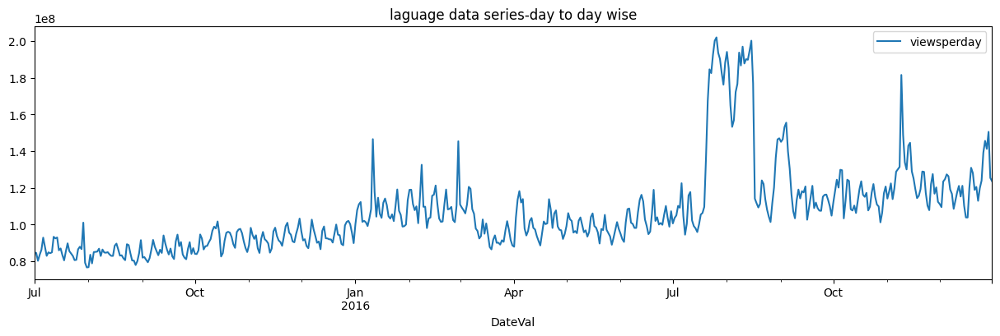

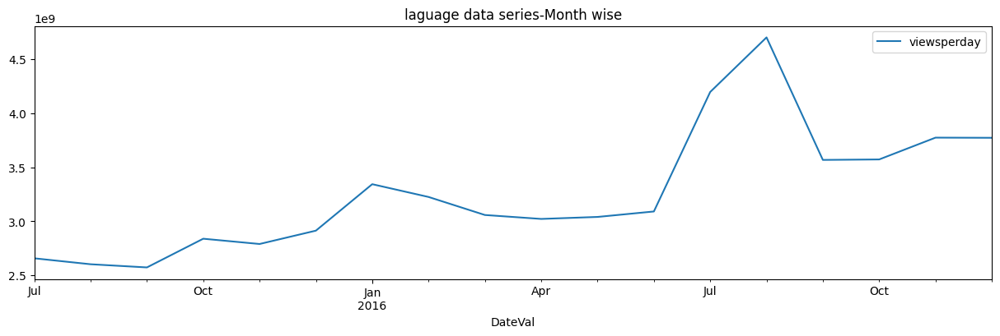

-----------------End: Plotting values for basic view-------------


In [ ]:
plotDatabasicVisuals(datadf)

-----------------Start: clipping data-------------


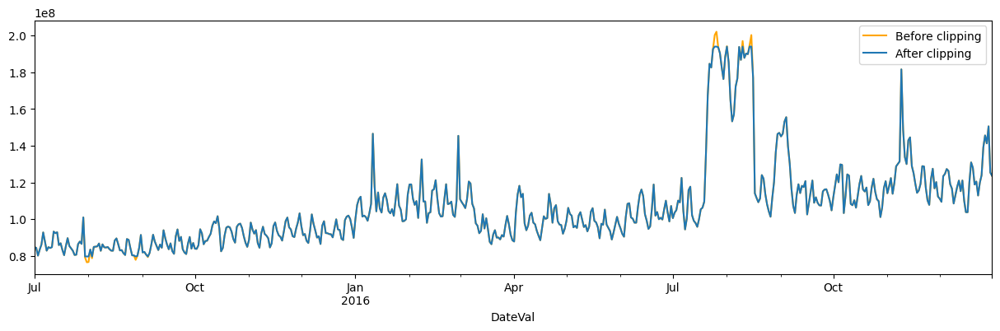

-----------------End: clipping data-------------


In [ ]:
datadf=oulierRemoval(datadf,0.99,0.01)

**ADF test for stationarity check**

In [ ]:
def ADFTestCheck(languageDataFrame):
  from statsmodels.tsa.stattools import adfuller
  series = datadf['viewsperday'].values
  # ADF Test
  result = adfuller(series, autolag='AIC')
  #Extracting the values from the results:
  print('-----------------ADF test results-------------')
  print ("Null hypothesis Ho - Time Series is Non-Stationary")
  print('ADF Statistic: %f' % result[0])
  print('p-value: %f' % result[1])
  print('Critical Values:')
  for key, value in result[4].items():
      print('\t%s: %.3f' % (key, value))
  if result[0] < result[4]["5%"]:
      print ("Rejected Ho; Outcome: Time Series is Stationary")
  else:
      print ("Failed to Reject Ho; Outcome: Time Series is Non-Stationary")
  print('-----------------End of ADF test results-------------')

In [ ]:
ADFTestCheck(datadf)

-----------------ADF test results-------------
Null hypothesis Ho - Time Series is Non-Stationary
ADF Statistic: -2.266942
p-value: 0.182852
Critical Values:
	1%: -3.443
	5%: -2.867
	10%: -2.570
Failed to Reject Ho; Outcome: Time Series is Non-Stationary
-----------------End of ADF test results-------------


Time series datasets may contain trends and seasonality, which may need to be removed prior to modeling.

Trends can result in a varying mean over time, whereas seasonality can result in a changing variance over time, both which define a time series as being non-stationary. Stationary datasets are those that have a stable mean and variance, and are in turn much easier to model.

Differencing is a popular and widely used data transform for making time series data stationary.

**Our data is stationary but we are applying techniques to make data more robust.**

**Decomposition technique**

In [ ]:
def createDecompositionDataAndReturnDeTrendedAndDeSeasonalityData(languageDataFrame,modeltype='multiplicative'):
  from statsmodels.tsa.seasonal import seasonal_decompose
  decompose_data = seasonal_decompose(languageDataFrame, model=modeltype)
  plt.rcParams['figure.figsize'] = (20, 10)
  decompose_data.plot()
  print('Residual variance:'+str(np.var(np.array(decompose_data.resid.fillna(0)))))
  print()
  print()
  plt.show()
  DeTrendedAndDeSeasonalityData= decompose_data.resid
  return decompose_data,DeTrendedAndDeSeasonalityData

Residual variance:28383603514583.637




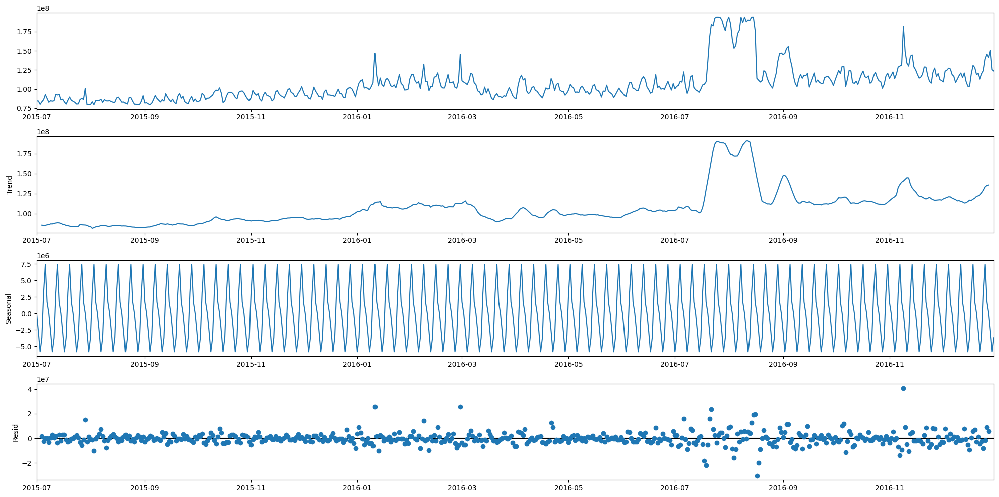

In [ ]:
decompose_data,DeTrendedAndDeSeasonalityData=createDecompositionDataAndReturnDeTrendedAndDeSeasonalityData(datadf,'additive')

Here we can clearly see by visualization that there is no trend and no seasonality - present in the time series also the residual is showing high variability.

We can check it more with additives.

**Insight:** by visualization that there is no trend and no seasonality- we can settle with additive model for decomposition

**Differencing**

In [ ]:
def difference(dataset, interval=1):
 # create a differenced series
 diff = list()
 for i in range(interval, len(dataset)):
   value = dataset[i] - dataset[i - interval]
   diff.append(value)
 return diff

In [ ]:
# invert differenced forecast
def inverse_difference(last_ob, value):
 return value + last_ob

In [ ]:
def createDeTrendedAndDeSeasonalityDataUsingDifferencingTechnique(languageDataFrame,modeltype='multiplicative'):
  datadfvals=languageDataFrame['viewsperday'].values
  plt.rcParams['figure.figsize'] = (15, 4)
  plt.plot(datadfvals)
  plt.show()
  # difference the dataset
  diff_DeTrendedData = difference(datadfvals)
  diff_DeTrendedAndDeSeasonalityData = difference(datadfvals,365)
  plt.plot(diff_DeTrendedAndDeSeasonalityData)
  plt.show()
  # invert the difference
  inverted = [inverse_difference(datadfvals[i], diff_DeTrendedAndDeSeasonalityData[i]) for i in range(len(diff_DeTrendedAndDeSeasonalityData))]
  plt.plot(inverted)
  plt.show()
  return diff_DeTrendedAndDeSeasonalityData

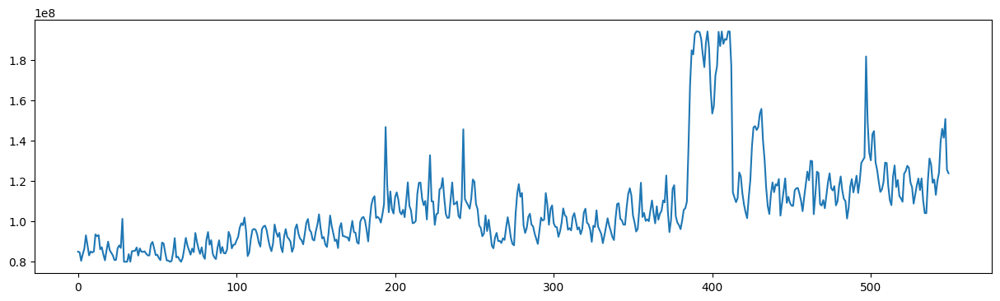

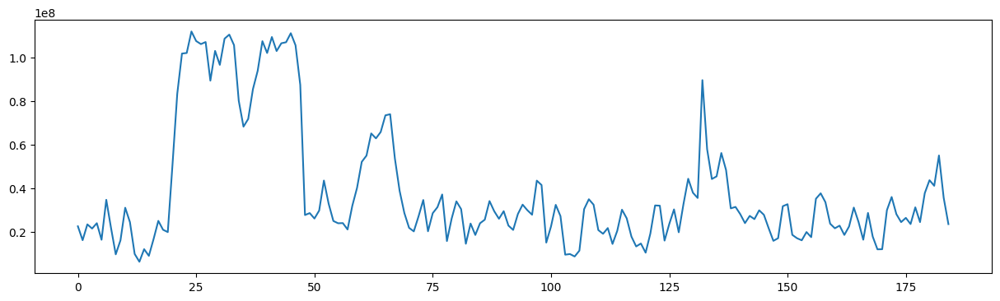

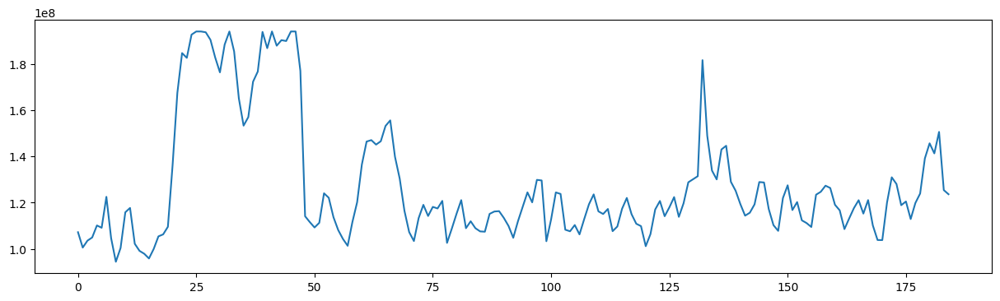

In [ ]:
DeTrendedAndDeSeasonalityData=createDeTrendedAndDeSeasonalityDataUsingDifferencingTechnique(datadf)

**ACF and PACF plot**

In [ ]:
def plotACFandPACFPlots(dataframe,columnname):
  from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
  print('-----------------Start: Plotting ACF and PACF-------------')
  plt.rcParams['figure.figsize'] = (15, 4)
  axis_acf=plot_acf(dataframe[columnname].values, lags=30)
  axis_pacf=plot_pacf(dataframe[columnname].values, lags=30)
  plt.show()
  print('-----------------End: Plotting ACF and PACF-------------')

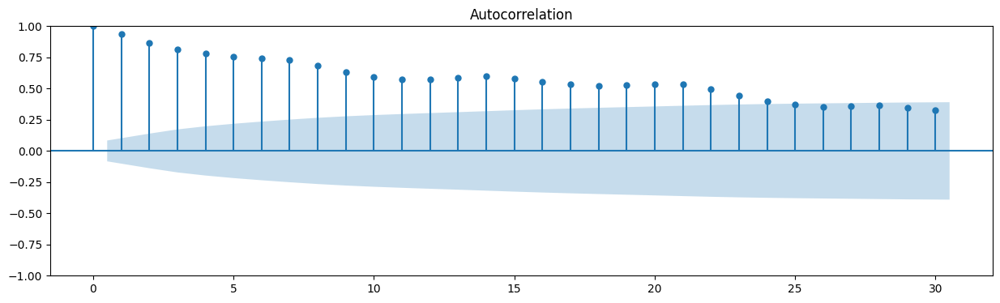

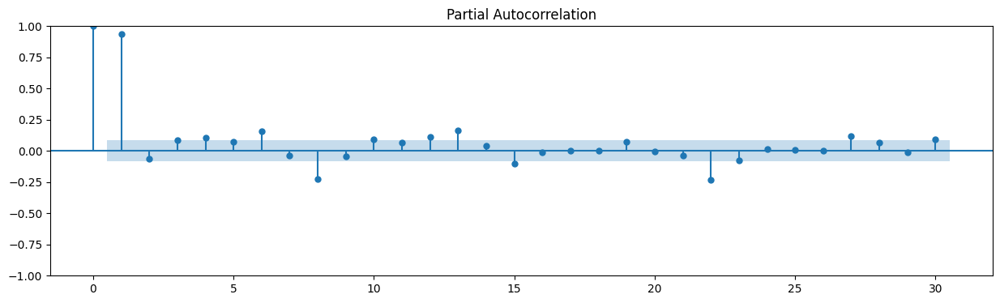

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.rcParams['figure.figsize'] = (15, 4)
axis_acf=plot_acf(datadf['viewsperday'].values, lags=30)
axis_pacf=plot_pacf(datadf['viewsperday'].values, lags=30)

**Insight:** ACF plot suggests 7 day cycle seasonality and trend existence

**Insight:** PACF plot suggests impact of 7 days lag, more than that we will have no impact.

# data preparation and metrics functions

In [ ]:
from sklearn.metrics import (
    mean_squared_error as mse,
    mean_absolute_error as mae, 
    mean_absolute_percentage_error as mape
)

# Creating a function to print values of all these metrics.
def performance(actual, predicted):
    print('MAE :', round(mae(actual, predicted), 3))
    print('RMSE :', round(mse(actual, predicted)**0.5, 3)) 
    print('MAPE:', round(mape(actual, predicted), 3))
    return (round(mae(actual, predicted), 3),round(mse(actual, predicted)**0.5, 3),round(mape(actual, predicted), 3))

In [ ]:
def train_test_split_TimeSeries(datadf):
  train_x = datadf.loc[datadf.index < datadf.index[-110]].copy()
  test_x = datadf.loc[datadf.index >= datadf.index[-110]].copy()
  return train_x,test_x

In [ ]:
# Splitting to 80:20 ratio - test set size 110
exogdf.index=datadf.index
train_x = datadf.loc[datadf.index < datadf.index[-110]].copy()
test_x = datadf.loc[datadf.index >= datadf.index[-110]].copy()

test_x[0:10]

,viewsperday
DateVal,
2016-09-13,118155875.0
2016-09-14,117479030.0
2016-09-15,120743383.0
2016-09-16,102590415.0
2016-09-17,108690477.0
2016-09-18,115101730.0
2016-09-19,121079307.0
2016-09-20,108945723.0
2016-09-21,111938004.0


# Section 4: Creating model training and forecasting with ARIMA

**ARIMA (p,d,q)**

In [ ]:
warnings.filterwarnings("ignore")

In [ ]:
def trainAndFitARIMAModel(train_x,test_x,columnToWork,ordervalue):
  from statsmodels.tsa.statespace.sarimax import SARIMAX
  print('-------Start ARIMA training : ORDER-'+str(ordervalue)+'-------')
  model = SARIMAX(train_x[columnToWork], order=ordervalue) 
  model = model.fit(disp=False)

  test_x['pred'] = model.forecast(steps=test_x.shape[0])

  test_x[columnToWork].plot(style='-o',label='Actual')
  test_x['pred'].plot(style='-o',label='Predicted')
  plt.legend()
  plt.show()
  allmetrics=performance(test_x[columnToWork], test_x['pred'])
  print('-------END of run-------')
  return allmetrics

In [ ]:
def gridsearchARIMA(train_x,test_x):
  AR_Indices=[i*5 for i in range(3,6)]
  MA_Indices=[i*5 for i in range(3,6)]
  bestmape=1000
  allmtricvals=()
  bestOrderVal=()
  for AR_val in AR_Indices:
    for MA_val in MA_Indices:
      ordervalue=(AR_val,1,MA_val)
      allmetrics=trainAndFitARIMAModel(train_x,test_x,'viewsperday',ordervalue)
      if bestmape>allmetrics[2]:
        bestmape=allmetrics[2]
        allmtricvals=allmetrics
        bestOrderVal=ordervalue
  print('-------FINAL RESULTS:-------')
  print('-------BEST MAPE VALUE OBTAINED:-------'+str(bestmape))
  print('-------BEST ORDERVALUE SET:-------'+str(bestOrderVal))
  return (bestOrderVal,bestmape)

-------Start ARIMA training : ORDER-(15, 1, 15)-------


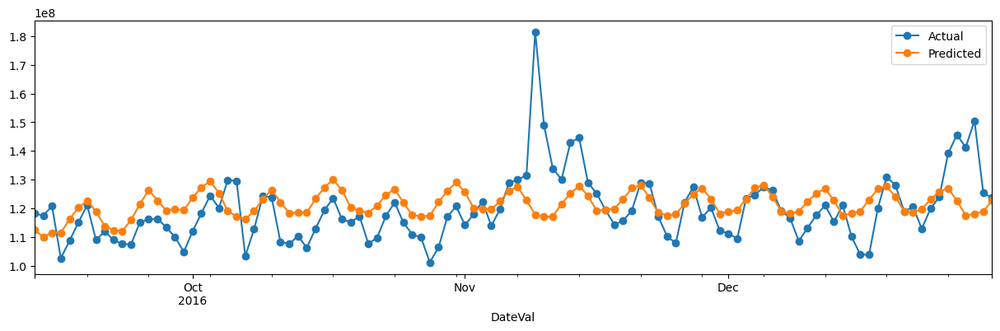

MAE : 8231477.131
RMSE : 11415831.071
MAPE: 0.067
-------END of run-------
-------Start ARIMA training : ORDER-(15, 1, 20)-------


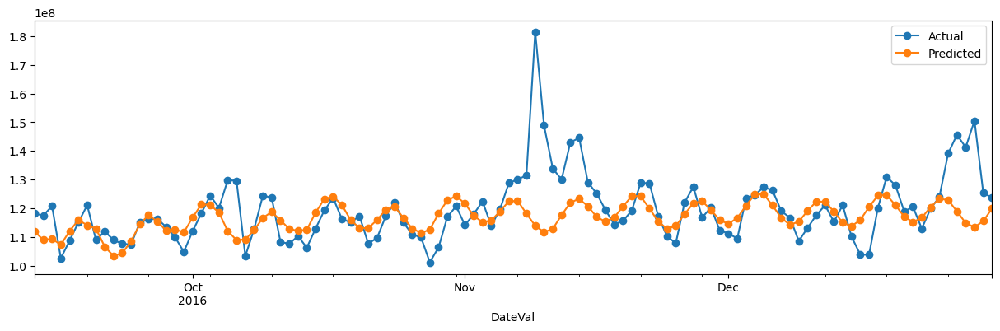

MAE : 7071400.528
RMSE : 11405819.342
MAPE: 0.056
-------END of run-------
-------Start ARIMA training : ORDER-(15, 1, 25)-------


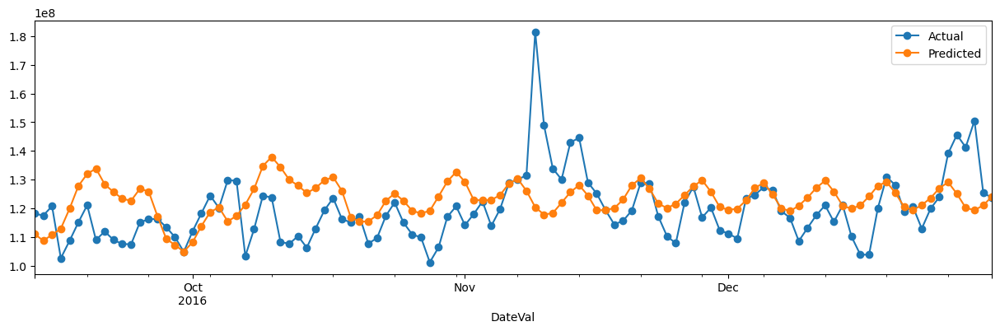

MAE : 9574692.021
RMSE : 12775567.71
MAPE: 0.08
-------END of run-------
-------Start ARIMA training : ORDER-(20, 1, 15)-------


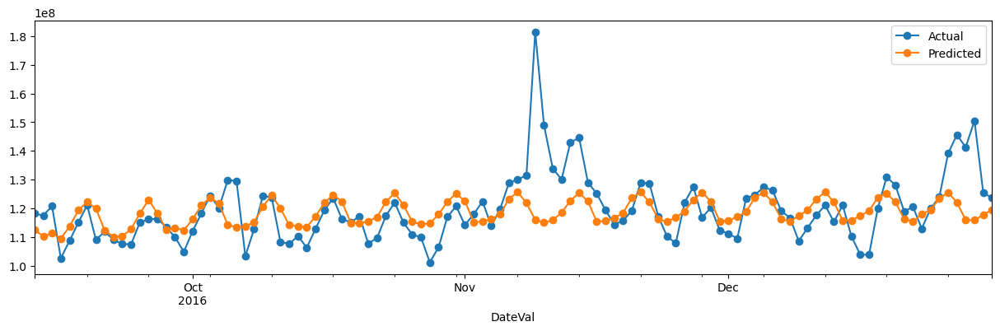

MAE : 7131397.249
RMSE : 10946368.421
MAPE: 0.057
-------END of run-------
-------Start ARIMA training : ORDER-(20, 1, 20)-------


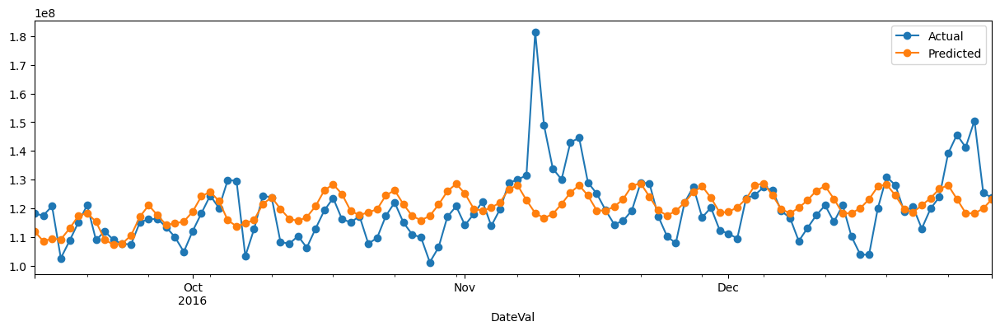

MAE : 7537255.401
RMSE : 11025311.058
MAPE: 0.061
-------END of run-------
-------Start ARIMA training : ORDER-(20, 1, 25)-------


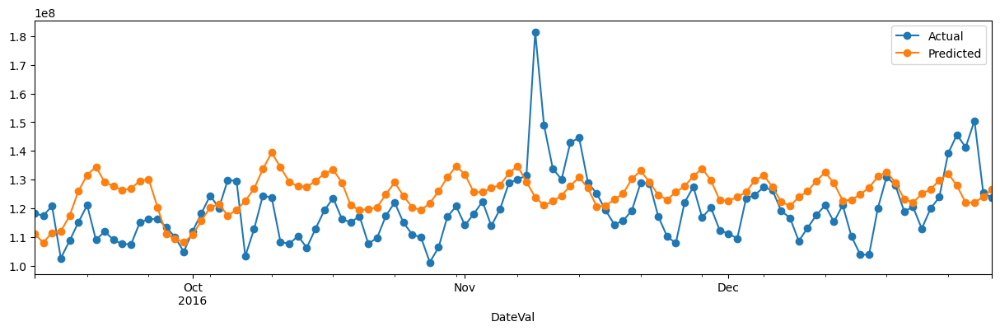

MAE : 10747614.36
RMSE : 13432102.862
MAPE: 0.091
-------END of run-------
-------Start ARIMA training : ORDER-(25, 1, 15)-------


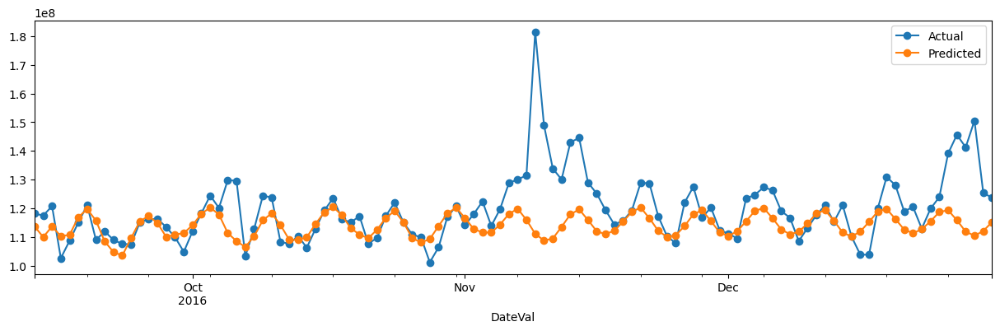

MAE : 7460447.751
RMSE : 12367003.317
MAPE: 0.057
-------END of run-------
-------Start ARIMA training : ORDER-(25, 1, 20)-------


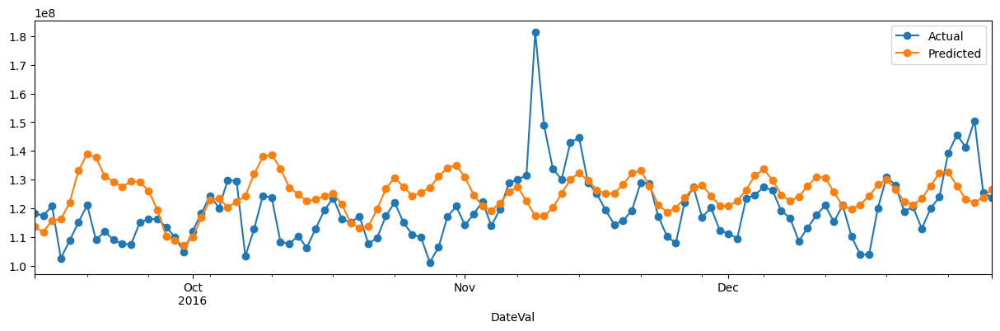

MAE : 10401936.763
RMSE : 13692661.893
MAPE: 0.088
-------END of run-------
-------Start ARIMA training : ORDER-(25, 1, 25)-------


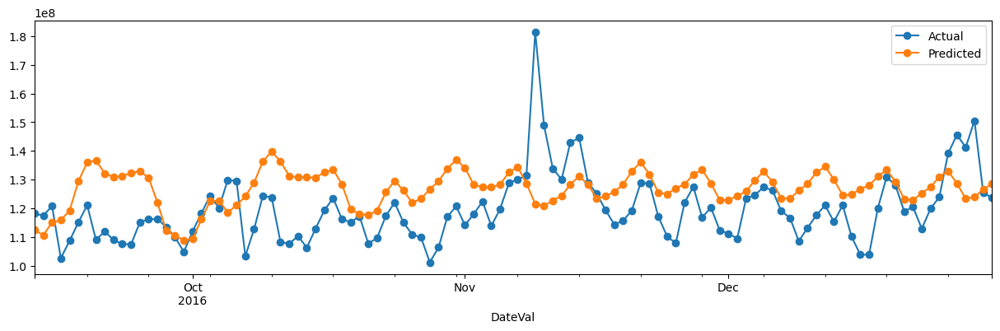

MAE : 11796226.221
RMSE : 14606650.188
MAPE: 0.1
-------END of run-------
-------FINAL RESULTS:-------
-------BEST MAPE VALUE OBTAINED:-------0.056
-------BEST ORDERVALUE SET:-------(15, 1, 20)


In [ ]:
bestResultsOfArima=gridsearchARIMA(train_x,test_x)

**Insight:** 5.5% is best MAPE achieved for this data through ARIMA with grid search

# Section 5: Creating model training and forecasting with SARIMA

**SARIMA (p,q,d,P,Q,D,s)**

In [ ]:
def trainAndFitSARIMAModel(train_x,test_x,columnToWork,ordervalue,seasonal_ordervalue):
  from statsmodels.tsa.statespace.sarimax import SARIMAX
  print('-------Start SARIMA training : ORDER-'+str(ordervalue)+'-SEASONAL ORDER-'+str(seasonal_ordervalue)+'------')
  model = SARIMAX(train_x[columnToWork], order=ordervalue,seasonal_order=seasonal_ordervalue) 
  model = model.fit(disp=False)

  test_x['pred'] = model.forecast(steps=test_x.shape[0])

  test_x[columnToWork].plot(style='-o',label='Actual')
  test_x['pred'].plot(style='-o',label='Predicted')
  plt.legend()
  plt.show()
  allmetrics=performance(test_x[columnToWork], test_x['pred'])
  print('-------END of run-------')
  return allmetrics

In [ ]:
def gridsearchSARIMA(train_x,test_x,seasonal_interval=1):
  AR_Indices_Seasonal=[i for i in range(1,4)]
  MA_Indices_Seasonal=[i for i in range(1,4)]
  bestmape=1000
  allmtricvals=()
  bestOrderVal=()
  for AR_val in AR_Indices_Seasonal:
    for MA_val in MA_Indices_Seasonal:
      seasonal_ordervalue=(AR_val,1,MA_val,seasonal_interval)
      Order_Value=(AR_val,1,MA_val)
      allmetrics=trainAndFitSARIMAModel(train_x,test_x,'viewsperday',Order_Value,seasonal_ordervalue)
      if bestmape>allmetrics[2]:
        bestmape=allmetrics[2]
        allmtricvals=allmetrics
        bestOrderVal=seasonal_ordervalue
  print('-------FINAL RESULTS:-------')
  print('-------BEST MAPE VALUE OBTAINED:-------'+str(bestmape))
  print('-------BEST ORDERVALUE SET:-------'+str(bestOrderVal))
  return (bestOrderVal,bestmape)

-------Start SARIMA training : ORDER-(1, 1, 1)-SEASONAL ORDER-(1, 1, 1, 15)------


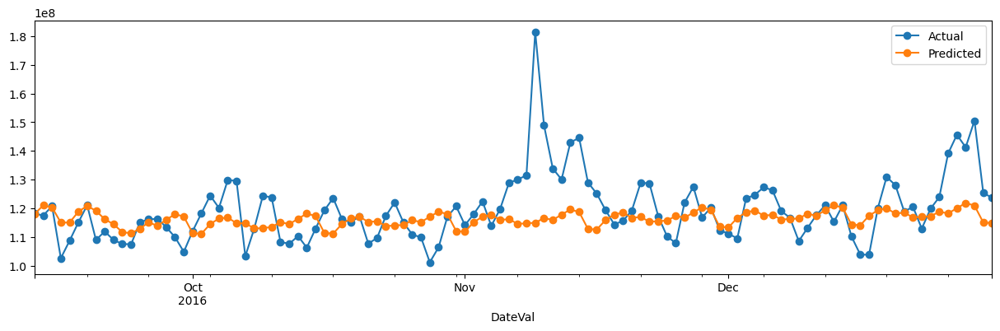

MAE : 8063533.34
RMSE : 11777124.139
MAPE: 0.064
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 2)-SEASONAL ORDER-(1, 1, 2, 15)------


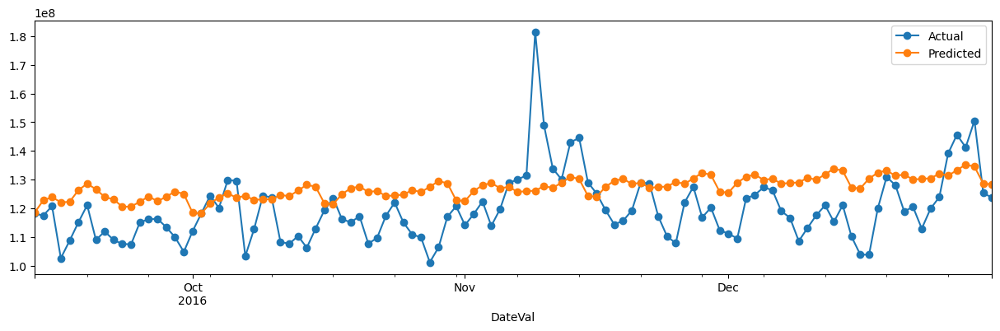

MAE : 10953720.154
RMSE : 13385431.561
MAPE: 0.094
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 3)-SEASONAL ORDER-(1, 1, 3, 15)------


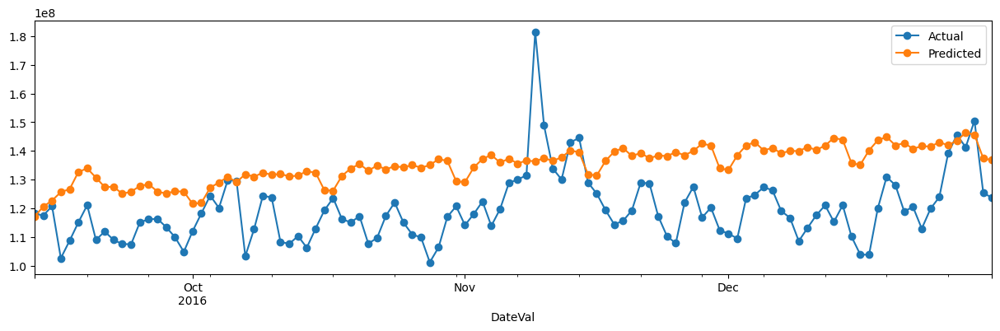

MAE : 16782756.632
RMSE : 19067859.603
MAPE: 0.145
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 1)-SEASONAL ORDER-(2, 1, 1, 15)------


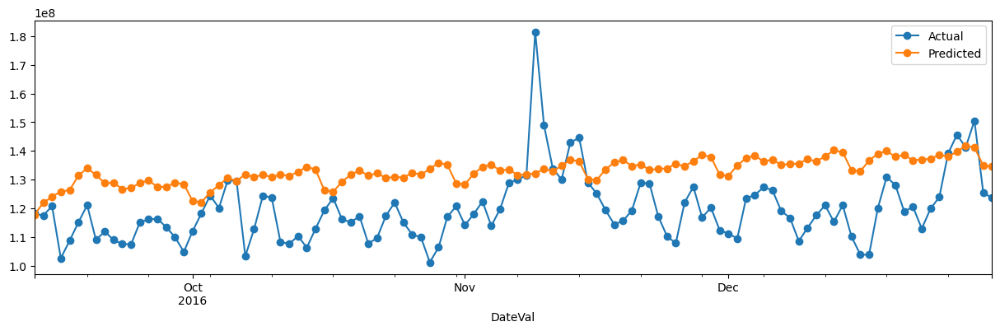

MAE : 15096984.453
RMSE : 17435835.992
MAPE: 0.131
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 2)-SEASONAL ORDER-(2, 1, 2, 15)------


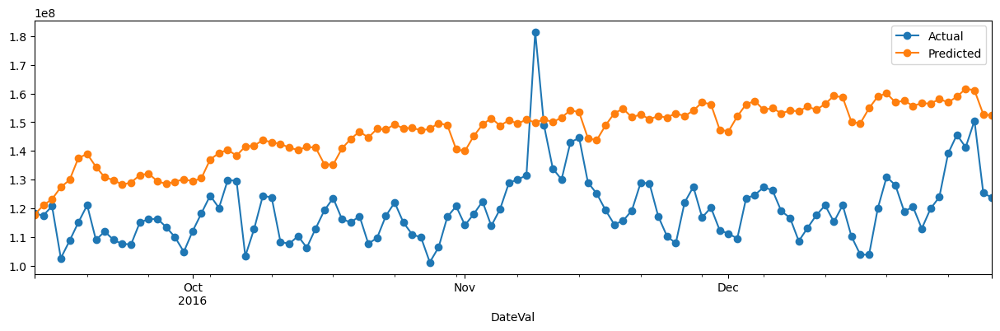

MAE : 27336195.433
RMSE : 29454614.765
MAPE: 0.235
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 3)-SEASONAL ORDER-(2, 1, 3, 15)------


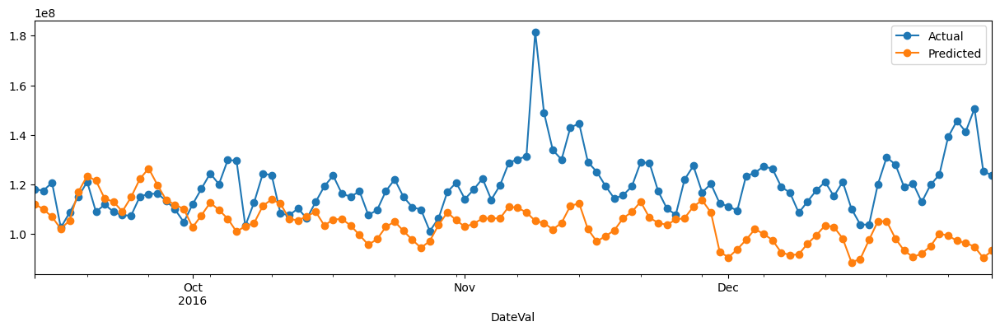

MAE : 16518066.31
RMSE : 20663090.638
MAPE: 0.132
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 1)-SEASONAL ORDER-(3, 1, 1, 15)------


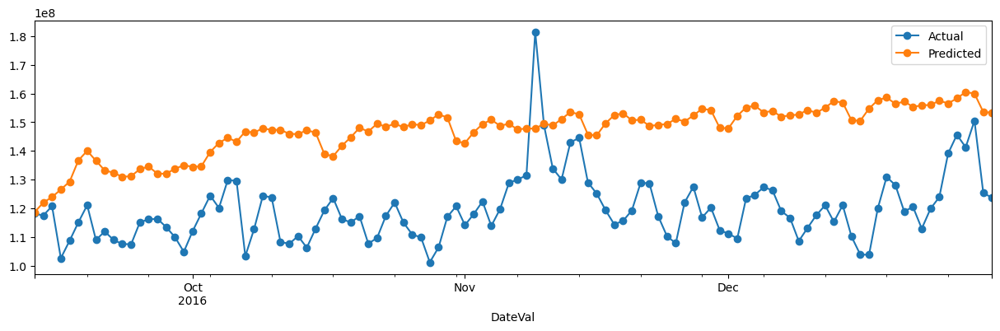

MAE : 28130556.687
RMSE : 30098129.583
MAPE: 0.242
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 2)-SEASONAL ORDER-(3, 1, 2, 15)------


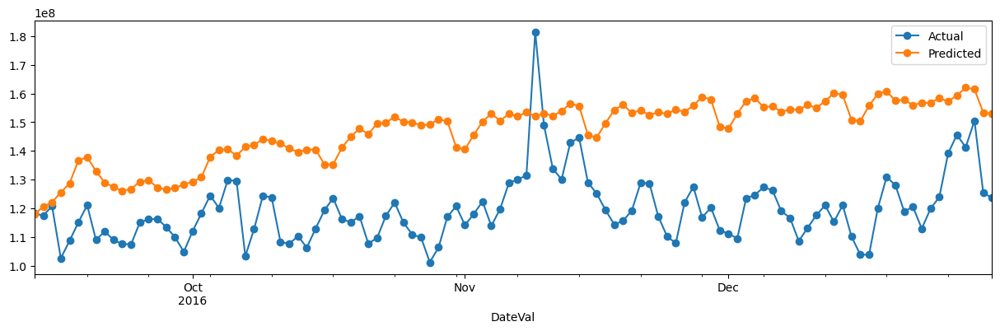

MAE : 27836288.455
RMSE : 30066490.335
MAPE: 0.239
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 3)-SEASONAL ORDER-(3, 1, 3, 15)------


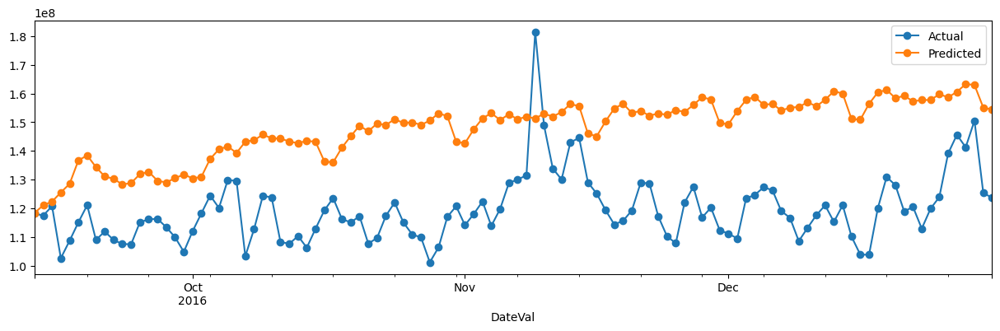

MAE : 28686628.964
RMSE : 30837535.441
MAPE: 0.246
-------END of run-------
-------FINAL RESULTS:-------
-------BEST MAPE VALUE OBTAINED:-------0.064
-------BEST ORDERVALUE SET:-------(1, 1, 1, 15)


In [ ]:
bestResultsOfSarima=gridsearchSARIMA(train_x,test_x,bestResultsOfArima[0][0])

# Section 6: Creating model training and forecasting with SARIMAX

**SARIMAX (p,q,d,P,Q,D,s,exog)**

In [ ]:
def trainAndFitSARIMAXModel(train_x,test_x,columnToWork,ordervalue,seasonal_ordervalue,exogdf):
  from statsmodels.tsa.statespace.sarimax import SARIMAX
  exogdf_test_x = exogdf.loc[exogdf.index >= exogdf.index[-110]].copy()
  exogdf_train_x = exogdf.loc[exogdf.index < exogdf.index[-110]].copy()
  print('-------Start SARIMAX training : ORDER-'+str(ordervalue)+'-SEASONAL ORDER-'+str(seasonal_ordervalue)+'------')
  model = SARIMAX(train_x[columnToWork], exog=exogdf_train_x['Exog'], order=ordervalue,seasonal_order=seasonal_ordervalue)
  results = model.fit(disp=False)
  start=train_x.shape[0]
  end=train_x.shape[0]+test_x.shape[0]-1
  test_x['pred'] = results.predict(start=start,end=end, exog=exogdf_test_x['Exog']).rename('Predictions')
  test_x[columnToWork].plot(style='-o',label='Actual')
  test_x['pred'].plot(style='-o',label='Predicted')
  plt.legend()
  plt.show()
  allmetrics=performance(test_x[columnToWork], test_x['pred'])
  print('-------END of run-------')
  return allmetrics

In [ ]:
def gridsearchSARIMAX(train_x,test_x,seasonal_interval=1):
  AR_Indices_Seasonal=[i for i in range(1,4)]
  MA_Indices_Seasonal=[i for i in range(1,4)]
  bestmape=1000
  allmtricvals=()
  bestOrderVal=()
  print(AR_Indices_Seasonal)
  for AR_val in AR_Indices_Seasonal:
    for MA_val in MA_Indices_Seasonal:
      seasonal_ordervalue=(AR_val,1,MA_val,seasonal_interval)
      Order_Value=(AR_val,1,MA_val)
      allmetrics=trainAndFitSARIMAXModel(train_x,test_x,'viewsperday',Order_Value,seasonal_ordervalue,exogdf)
      if bestmape>allmetrics[2]:
        bestmape=allmetrics[2]
        allmtricvals=allmetrics
        bestOrderVal=seasonal_ordervalue
  print('-------FINAL RESULTS:-------')
  print('-------BEST MAPE VALUE OBTAINED:-------'+str(bestmape))
  print('-------BEST ORDERVALUE SET:-------'+str(bestOrderVal))
  return (bestOrderVal,bestmape)

[1, 2, 3]
-------Start SARIMAX training : ORDER-(1, 1, 1)-SEASONAL ORDER-(1, 1, 1, 15)------


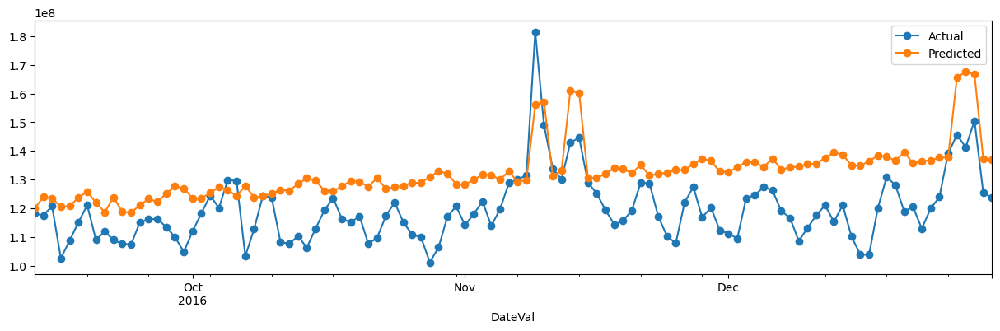

MAE : 13533495.331
RMSE : 15541517.89
MAPE: 0.117
-------END of run-------
-------Start SARIMAX training : ORDER-(1, 1, 2)-SEASONAL ORDER-(1, 1, 2, 15)------


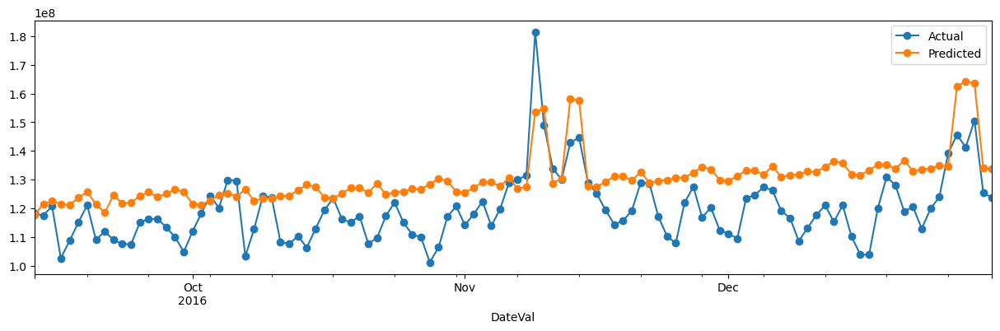

MAE : 11804874.023
RMSE : 13763512.936
MAPE: 0.102
-------END of run-------
-------Start SARIMAX training : ORDER-(1, 1, 3)-SEASONAL ORDER-(1, 1, 3, 15)------


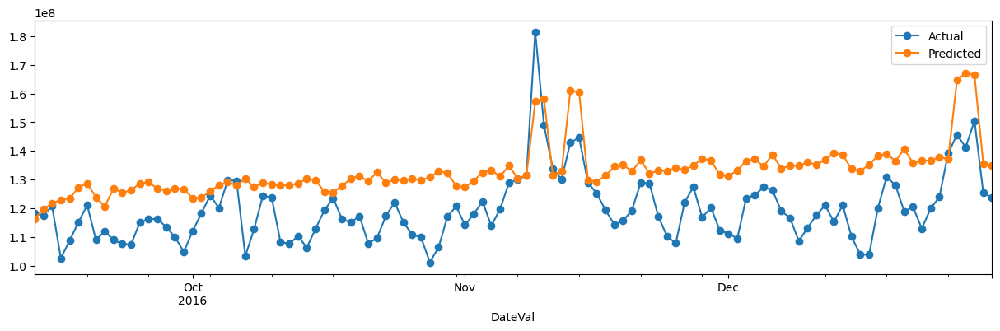

MAE : 14169354.7
RMSE : 16066420.262
MAPE: 0.122
-------END of run-------
-------Start SARIMAX training : ORDER-(2, 1, 1)-SEASONAL ORDER-(2, 1, 1, 15)------


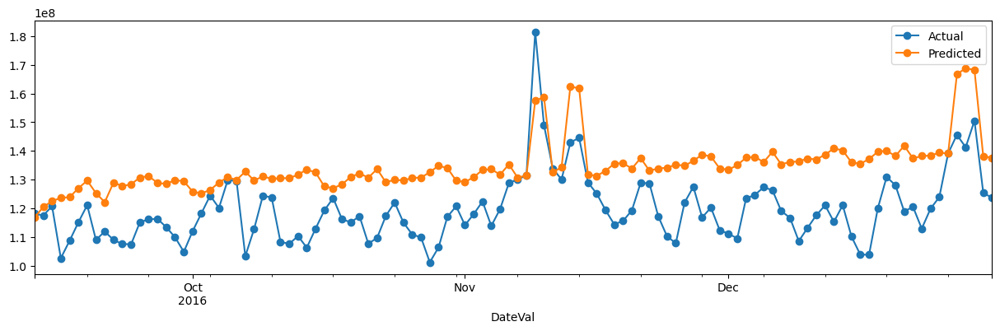

MAE : 15522828.883
RMSE : 17449283.616
MAPE: 0.134
-------END of run-------
-------Start SARIMAX training : ORDER-(2, 1, 2)-SEASONAL ORDER-(2, 1, 2, 15)------


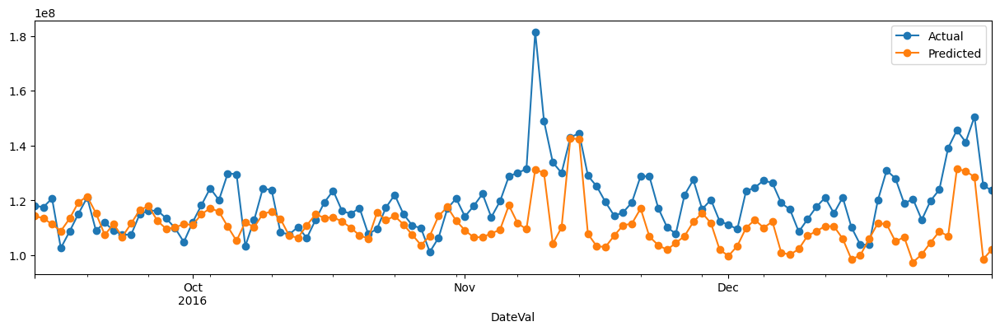

MAE : 10060128.481
RMSE : 12928575.517
MAPE: 0.081
-------END of run-------
-------Start SARIMAX training : ORDER-(2, 1, 3)-SEASONAL ORDER-(2, 1, 3, 15)------


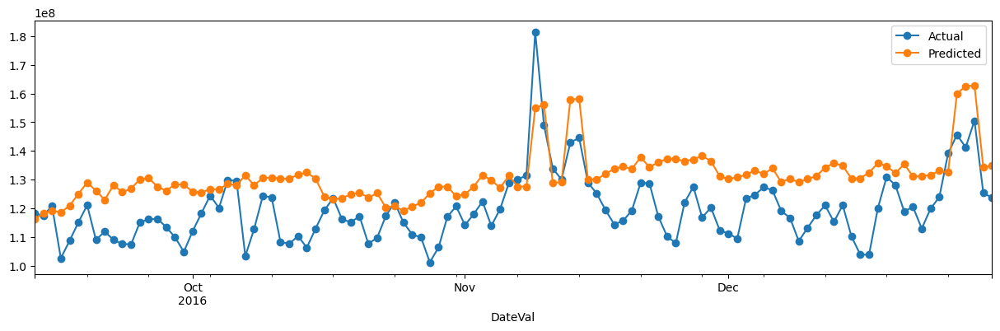

MAE : 12583149.214
RMSE : 14551442.996
MAPE: 0.109
-------END of run-------
-------Start SARIMAX training : ORDER-(3, 1, 1)-SEASONAL ORDER-(3, 1, 1, 15)------


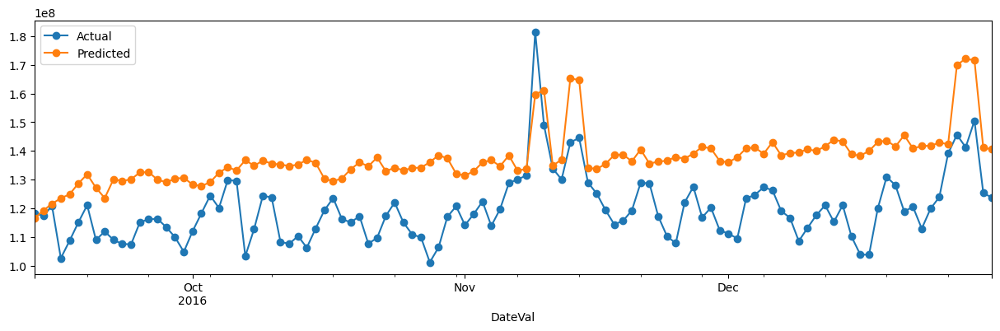

MAE : 18221158.337
RMSE : 20010568.287
MAPE: 0.157
-------END of run-------
-------Start SARIMAX training : ORDER-(3, 1, 2)-SEASONAL ORDER-(3, 1, 2, 15)------


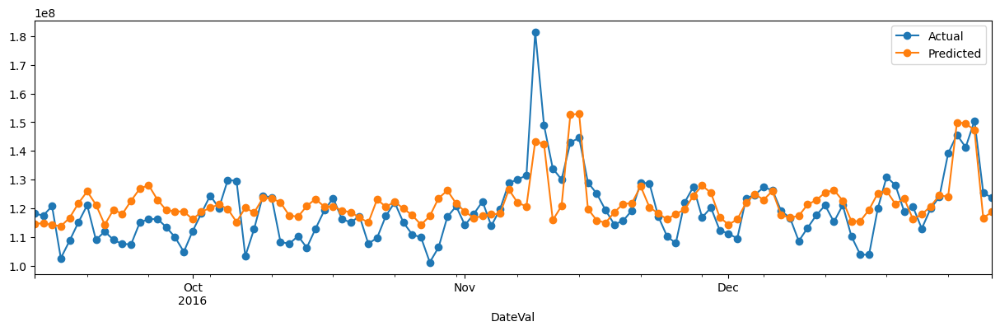

MAE : 6770649.748
RMSE : 8663929.328
MAPE: 0.057
-------END of run-------
-------Start SARIMAX training : ORDER-(3, 1, 3)-SEASONAL ORDER-(3, 1, 3, 15)------


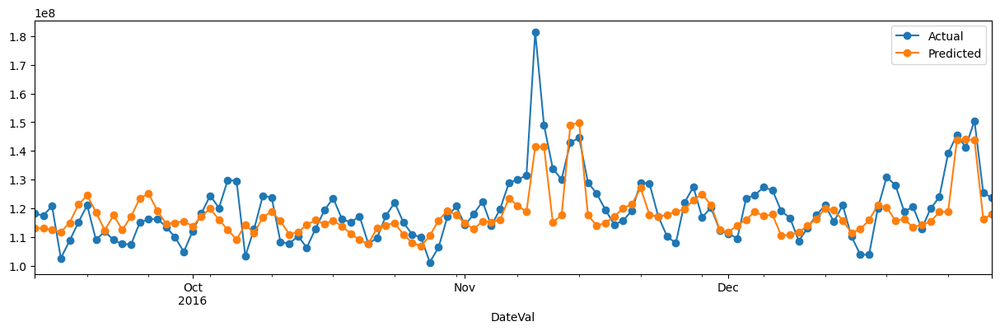

MAE : 6232699.783
RMSE : 8196411.443
MAPE: 0.051
-------END of run-------
-------FINAL RESULTS:-------
-------BEST MAPE VALUE OBTAINED:-------0.051
-------BEST ORDERVALUE SET:-------(3, 1, 3, 15)


In [ ]:
bestResultsOfSarimax=gridsearchSARIMAX(train_x,test_x,15)

# Section 7: Creation of Custom Pipeline and Capturing results for all languages

In [ ]:
warnings.filterwarnings("ignore")
#we have covered 'en' before as part of individual section
languagesList=['zh', 'fr', 'commons', 'ru', 'de', 'ja', 'es']
strcolumnToAnalyze='viewsperday'
outlierLowerLimit=0.01
outlierUpperLimit=0.99

In [ ]:
def pipeline(inputlanguage,languageAndDateTimeSeries):
  for i in range(5):
    print()
  print('-------------------------------------------------------START OF LANGUAGE-'+inputlanguage+'-ANALYSIS------')
  warnings.filterwarnings("ignore")
  datadf=prepareLanguageData(inputlanguage,languageAndDateTimeSeries)
  datadf=missingValueCheck(datadf)
  datadf=oulierRemoval(datadf,outlierUpperLimit,outlierLowerLimit)
  plotDatabasicVisuals(datadf)
  ADFTestCheck(datadf)
  plotACFandPACFPlots(datadf,strcolumnToAnalyze)
  train_x,test_x=train_test_split_TimeSeries(datadf)
  gridsearchSARIMA(train_x,test_x,15)
  print('-------------------------------------------------------END OF LANGUAGE-'+inputlanguage+'-ANALYSIS------')






-------------------------------------------------------START OF LANGUAGE-zh-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


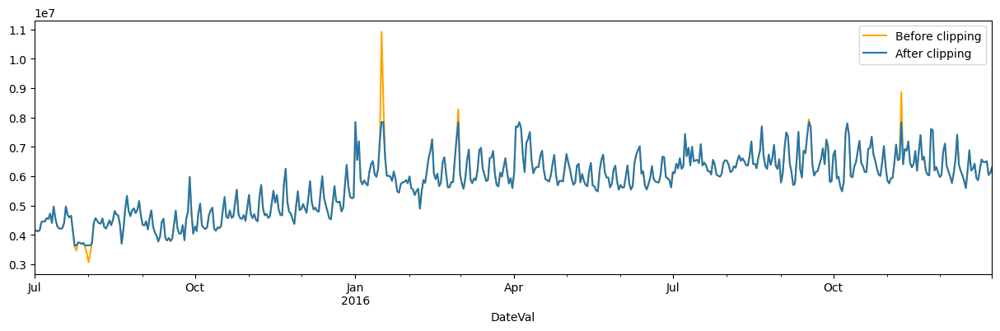

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


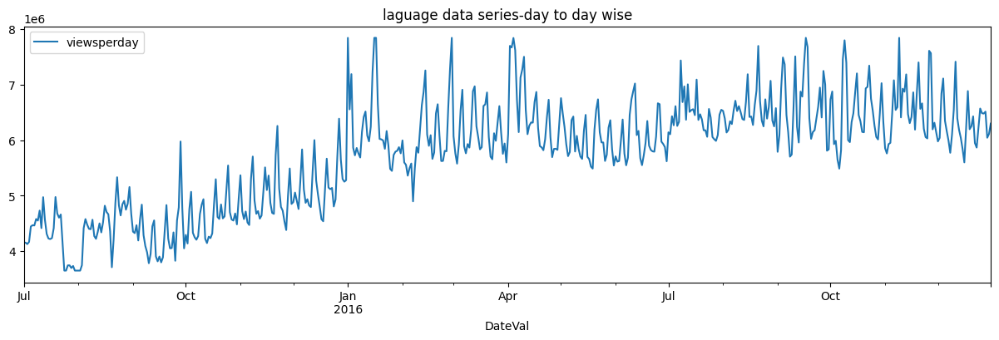

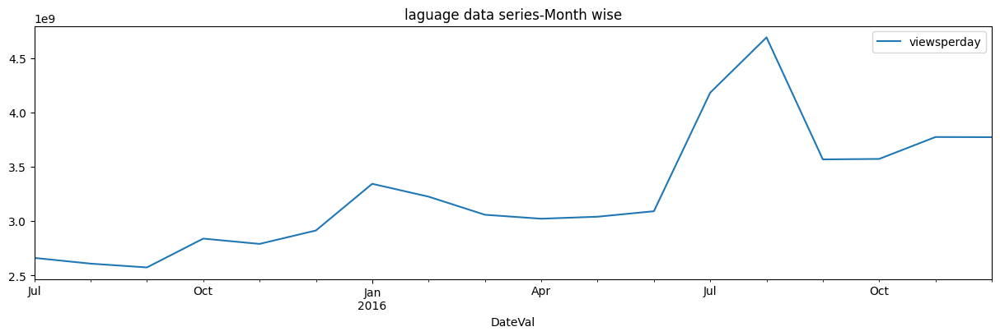

-----------------End: Plotting values for basic view-------------
-----------------ADF test results-------------
Null hypothesis Ho - Time Series is Non-Stationary
ADF Statistic: -2.266942
p-value: 0.182852
Critical Values:
	1%: -3.443
	5%: -2.867
	10%: -2.570
Failed to Reject Ho; Outcome: Time Series is Non-Stationary
-----------------End of ADF test results-------------
-----------------Start: Plotting ACF and PACF-------------


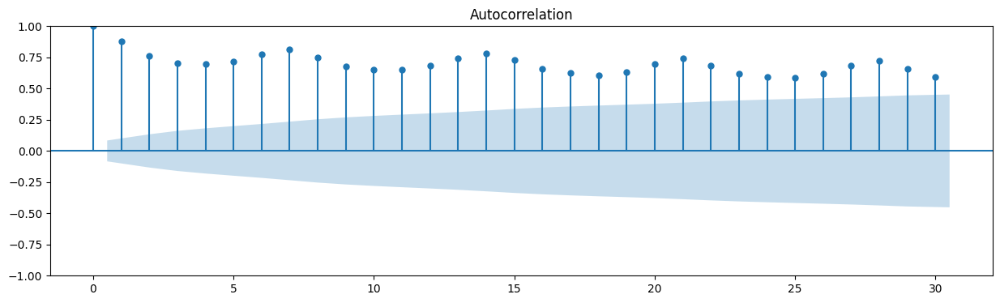

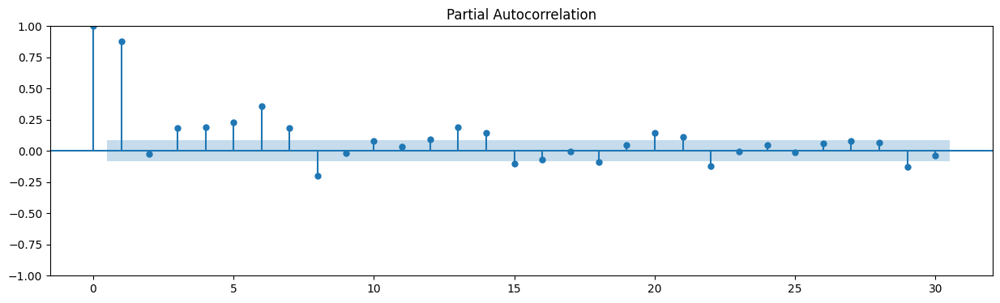

-----------------End: Plotting ACF and PACF-------------
-------Start SARIMA training : ORDER-(1, 1, 1)-SEASONAL ORDER-(1, 1, 1, 15)------


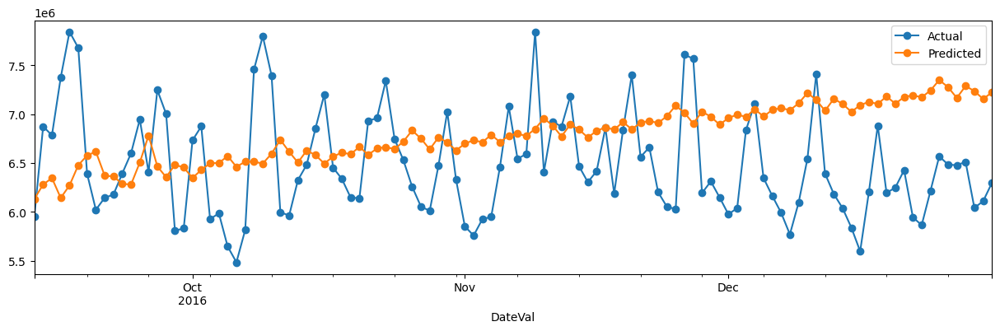

MAE : 627424.355
RMSE : 722409.415
MAPE: 0.098
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 2)-SEASONAL ORDER-(1, 1, 2, 15)------


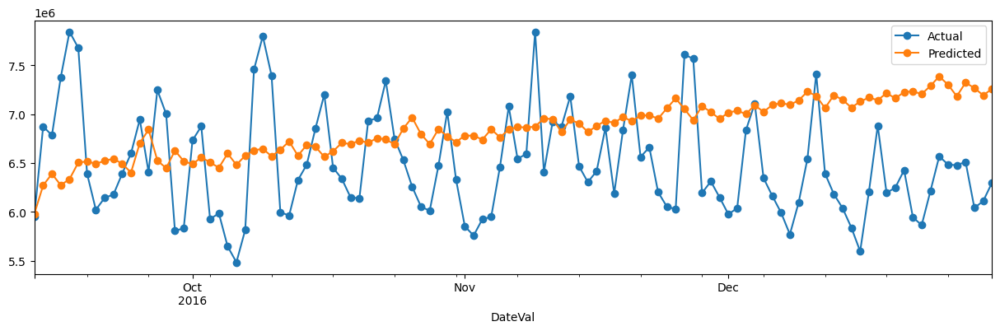

MAE : 640681.056
RMSE : 737912.071
MAPE: 0.101
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 3)-SEASONAL ORDER-(1, 1, 3, 15)------


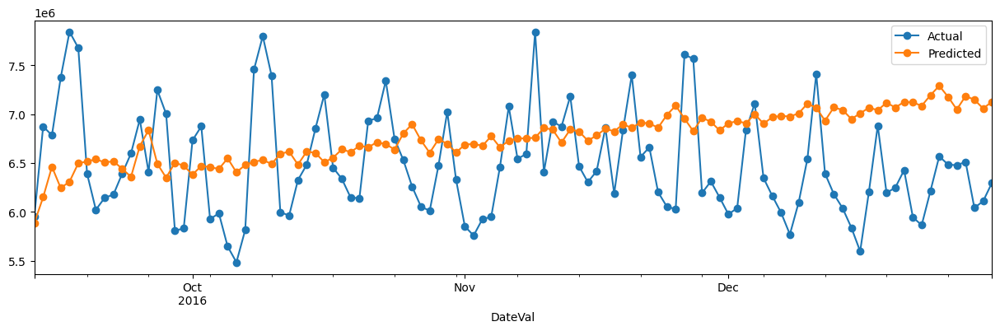

MAE : 598384.336
RMSE : 689562.667
MAPE: 0.094
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 1)-SEASONAL ORDER-(2, 1, 1, 15)------


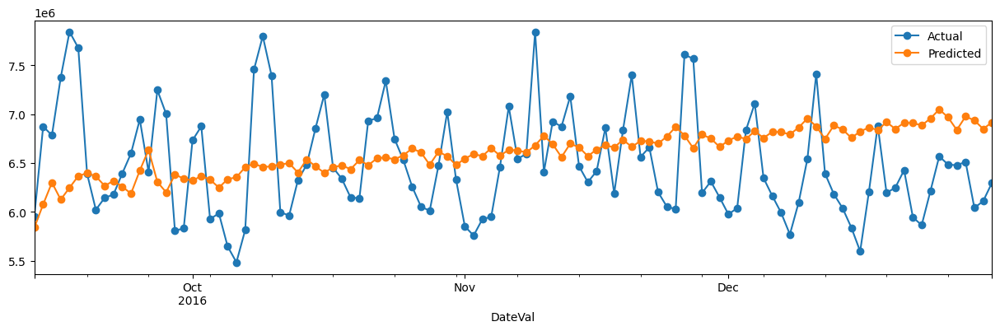

MAE : 528729.366
RMSE : 623124.111
MAPE: 0.082
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 2)-SEASONAL ORDER-(2, 1, 2, 15)------


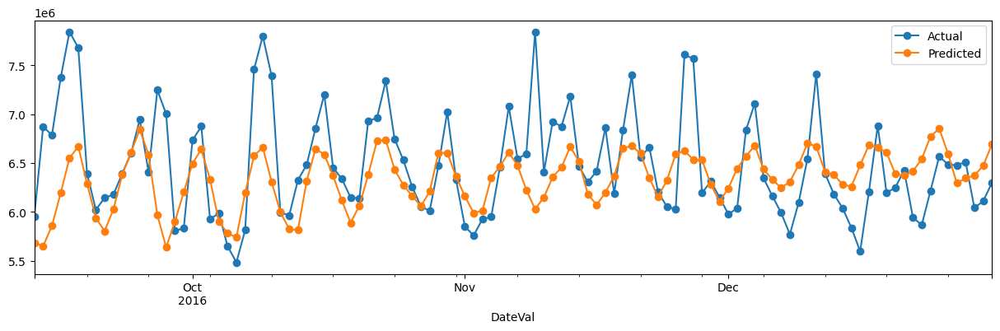

MAE : 379229.392
RMSE : 517000.3
MAPE: 0.056
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 3)-SEASONAL ORDER-(2, 1, 3, 15)------


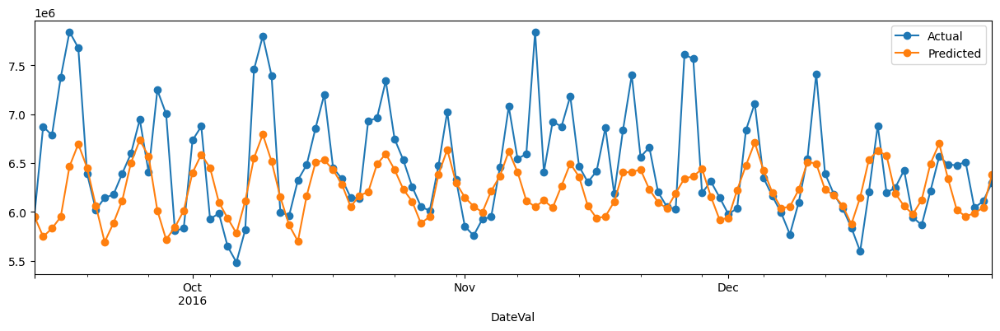

MAE : 375441.965
RMSE : 531371.707
MAPE: 0.055
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 1)-SEASONAL ORDER-(3, 1, 1, 15)------


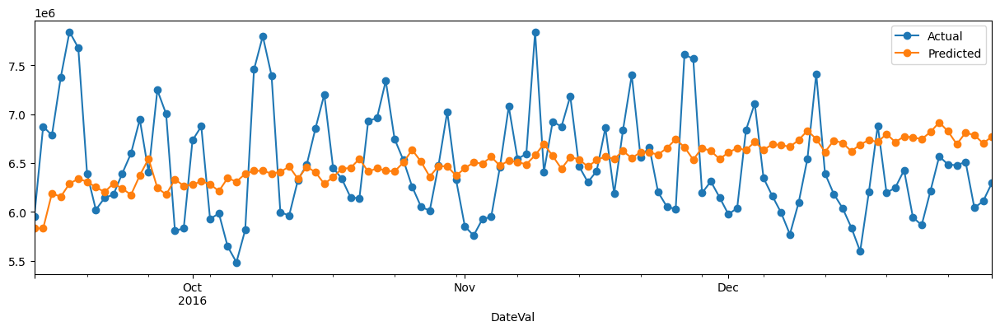

MAE : 496560.369
RMSE : 598244.451
MAPE: 0.076
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 2)-SEASONAL ORDER-(3, 1, 2, 15)------


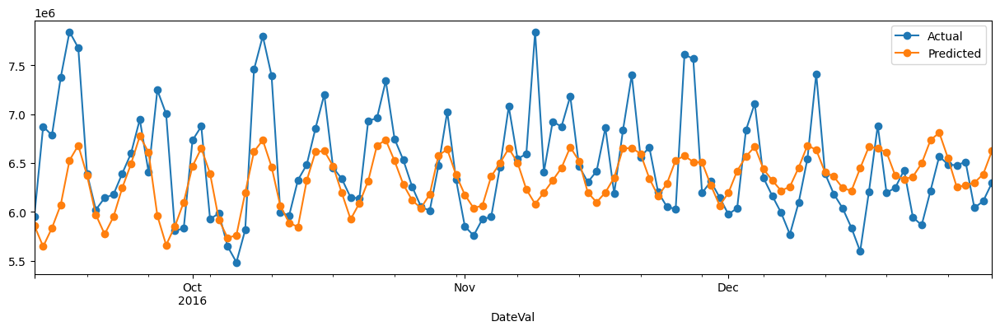

MAE : 370140.816
RMSE : 509414.478
MAPE: 0.055
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 3)-SEASONAL ORDER-(3, 1, 3, 15)------


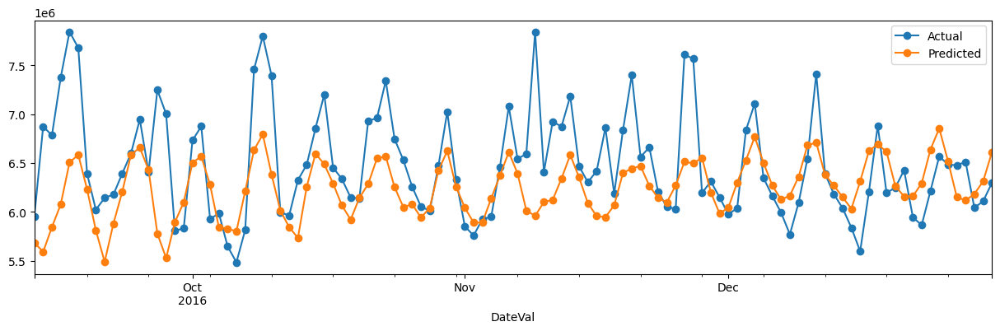

MAE : 393128.024
RMSE : 541851.015
MAPE: 0.058
-------END of run-------
-------FINAL RESULTS:-------
-------BEST MAPE VALUE OBTAINED:-------0.055
-------BEST ORDERVALUE SET:-------(2, 1, 3, 15)
-------------------------------------------------------END OF LANGUAGE-zh-ANALYSIS------


In [ ]:
pipeline('zh',languageAndDateTimeSeries)






-------------------------------------------------------START OF LANGUAGE-fr-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


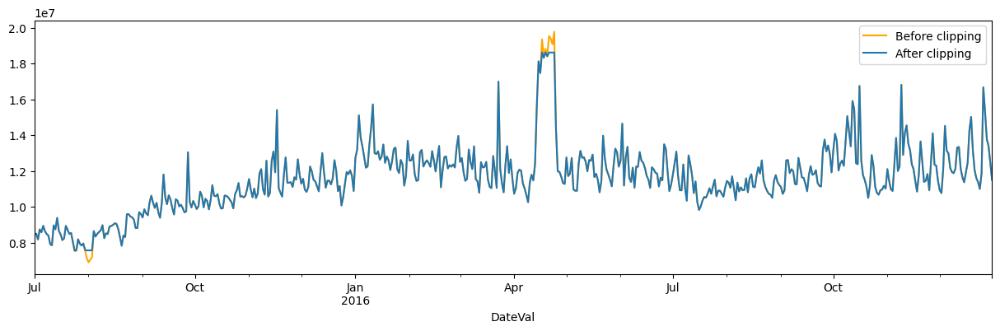

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


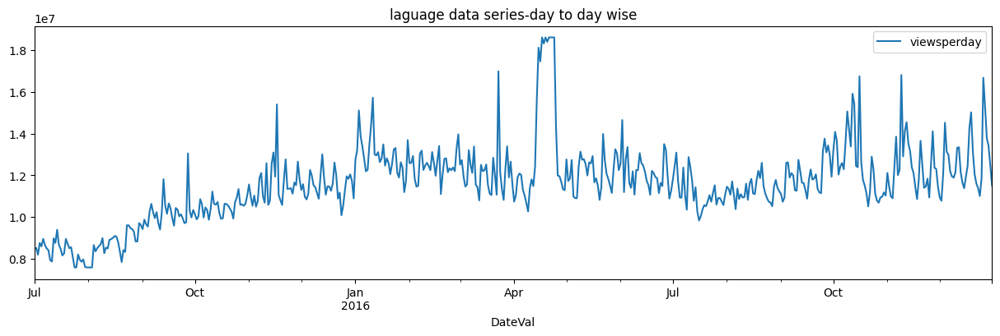

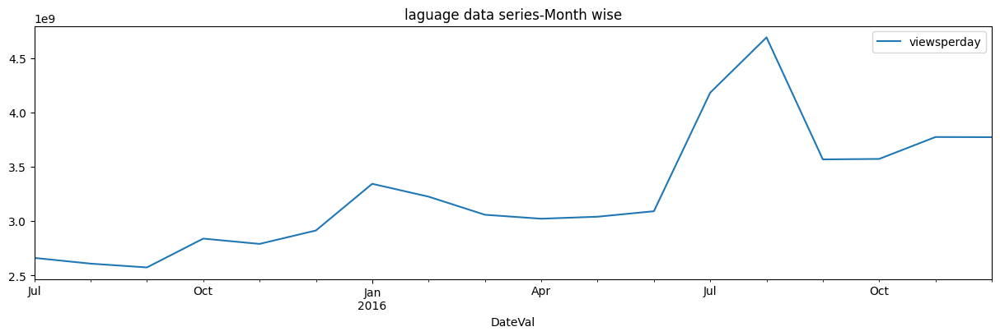

-----------------End: Plotting values for basic view-------------
-----------------ADF test results-------------
Null hypothesis Ho - Time Series is Non-Stationary
ADF Statistic: -2.266942
p-value: 0.182852
Critical Values:
	1%: -3.443
	5%: -2.867
	10%: -2.570
Failed to Reject Ho; Outcome: Time Series is Non-Stationary
-----------------End of ADF test results-------------
-----------------Start: Plotting ACF and PACF-------------


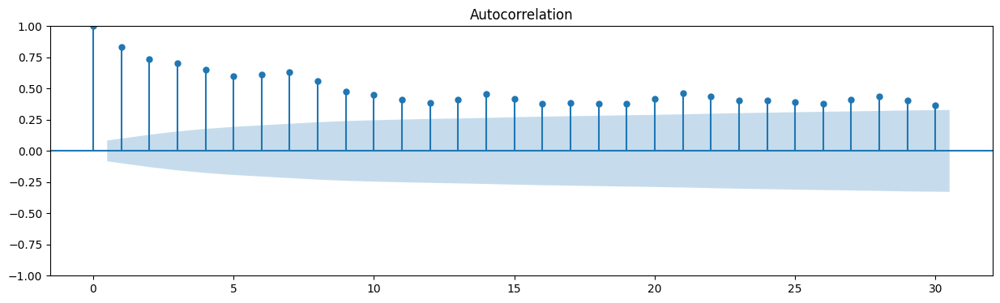

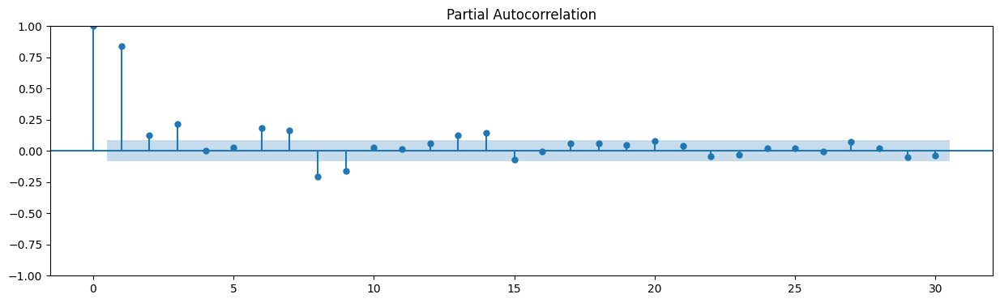

-----------------End: Plotting ACF and PACF-------------
-------Start SARIMA training : ORDER-(1, 1, 1)-SEASONAL ORDER-(1, 1, 1, 15)------


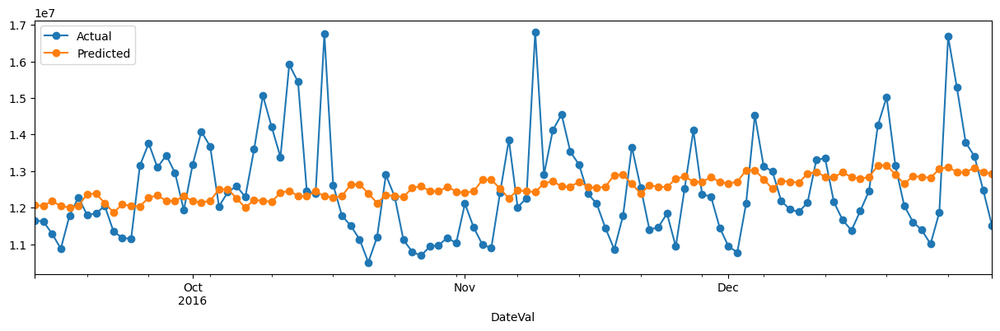

MAE : 1086694.42
RMSE : 1376724.5
MAPE: 0.086
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 2)-SEASONAL ORDER-(1, 1, 2, 15)------


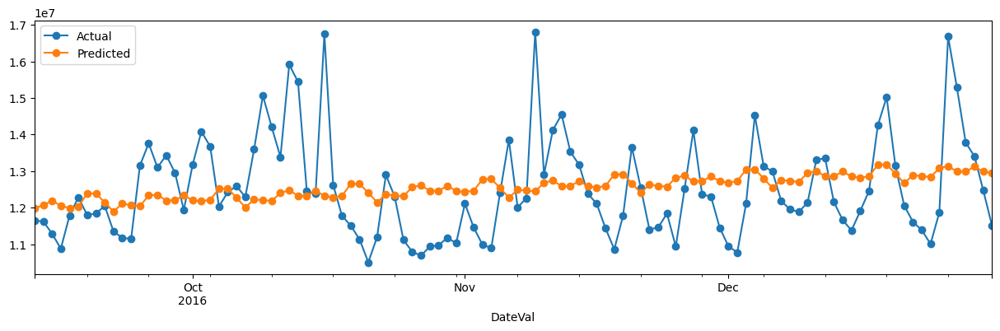

MAE : 1090001.036
RMSE : 1377768.61
MAPE: 0.086
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 3)-SEASONAL ORDER-(1, 1, 3, 15)------


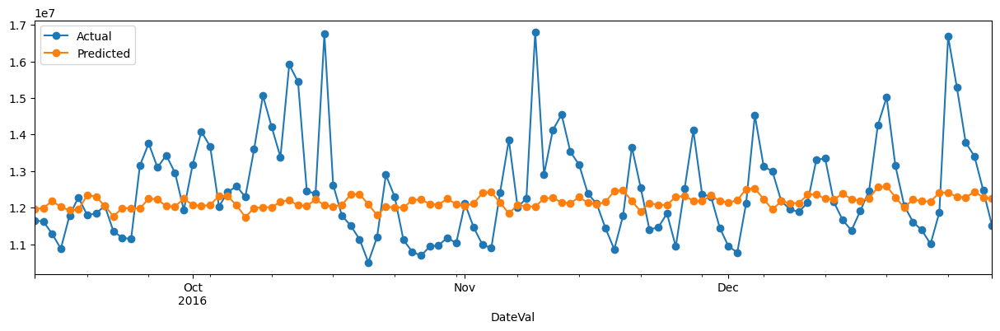

MAE : 1034764.243
RMSE : 1401480.4
MAPE: 0.079
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 1)-SEASONAL ORDER-(2, 1, 1, 15)------


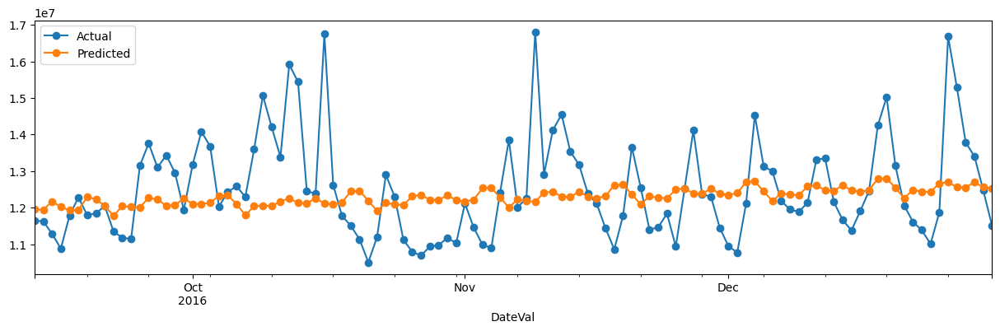

MAE : 1040664.399
RMSE : 1380010.195
MAPE: 0.08
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 2)-SEASONAL ORDER-(2, 1, 2, 15)------


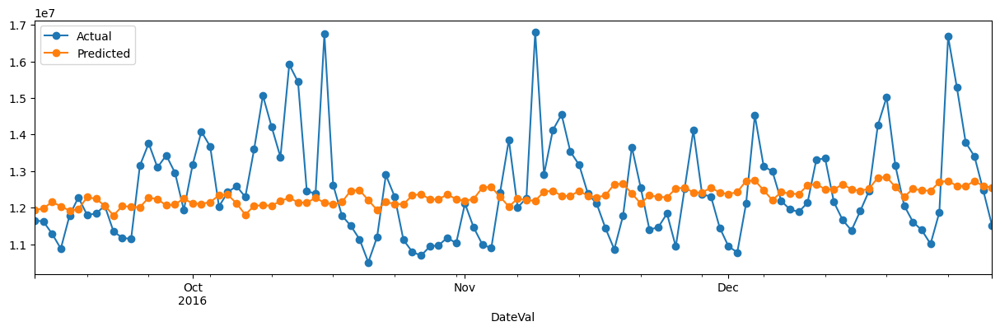

MAE : 1043520.35
RMSE : 1378162.201
MAPE: 0.081
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 3)-SEASONAL ORDER-(2, 1, 3, 15)------


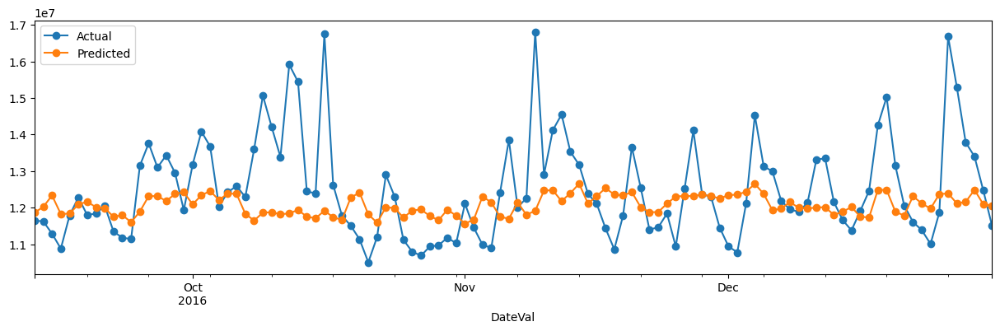

MAE : 1009163.895
RMSE : 1405263.447
MAPE: 0.076
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 1)-SEASONAL ORDER-(3, 1, 1, 15)------


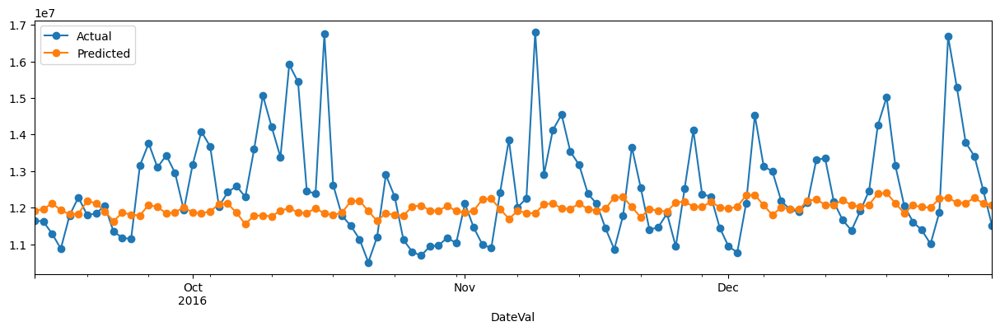

MAE : 1058062.37
RMSE : 1458499.792
MAPE: 0.08
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 2)-SEASONAL ORDER-(3, 1, 2, 15)------


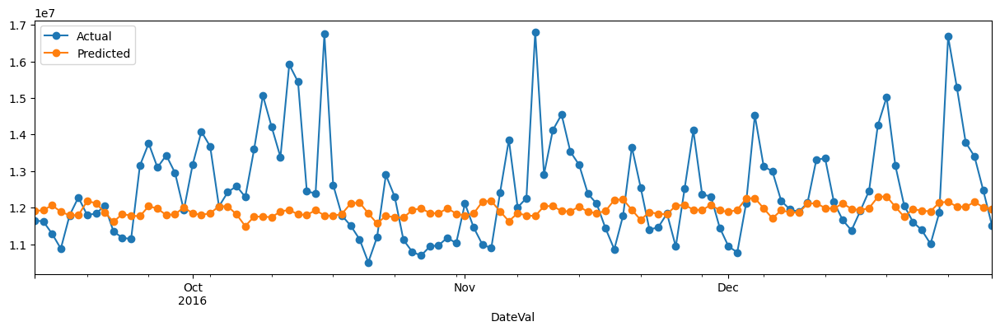

MAE : 1068917.924
RMSE : 1481798.567
MAPE: 0.08
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 3)-SEASONAL ORDER-(3, 1, 3, 15)------


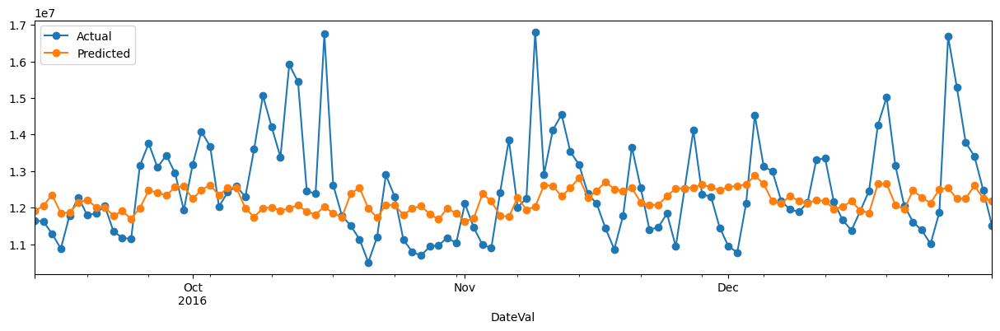

MAE : 993098.2
RMSE : 1368972.99
MAPE: 0.076
-------END of run-------
-------FINAL RESULTS:-------
-------BEST MAPE VALUE OBTAINED:-------0.076
-------BEST ORDERVALUE SET:-------(2, 1, 3, 15)
-------------------------------------------------------END OF LANGUAGE-fr-ANALYSIS------


In [ ]:
pipeline('fr',languageAndDateTimeSeries)






-------------------------------------------------------START OF LANGUAGE-de-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


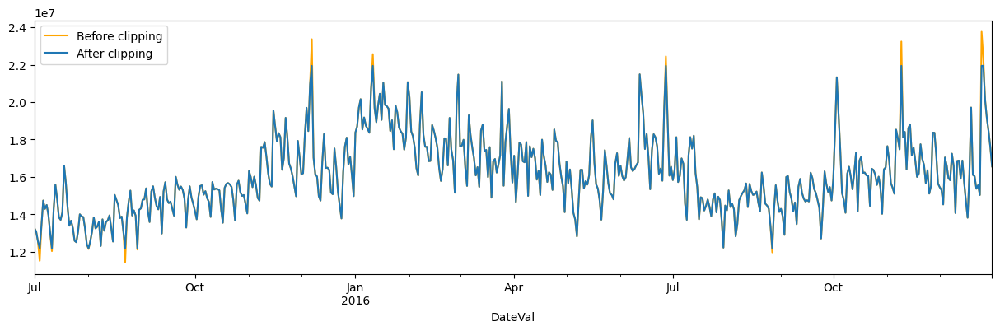

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


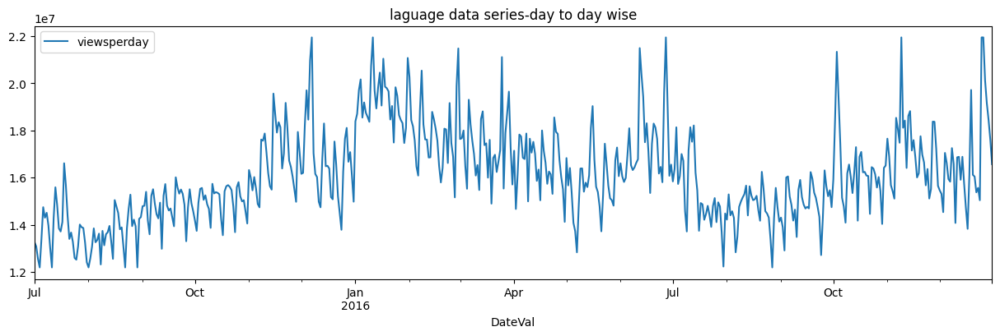

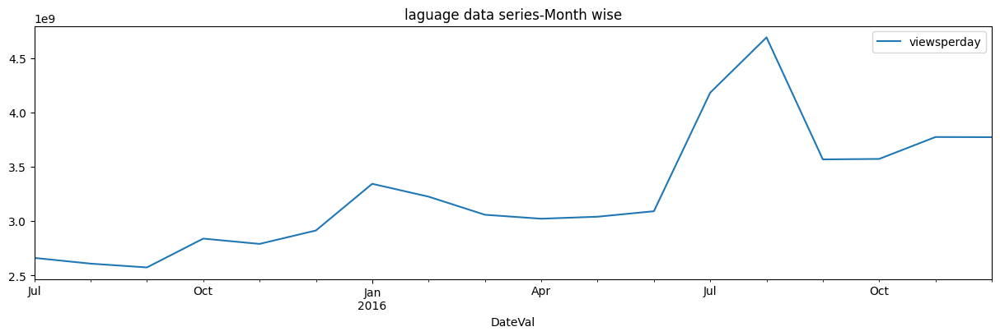

-----------------End: Plotting values for basic view-------------
-----------------ADF test results-------------
Null hypothesis Ho - Time Series is Non-Stationary
ADF Statistic: -2.266942
p-value: 0.182852
Critical Values:
	1%: -3.443
	5%: -2.867
	10%: -2.570
Failed to Reject Ho; Outcome: Time Series is Non-Stationary
-----------------End of ADF test results-------------
-----------------Start: Plotting ACF and PACF-------------


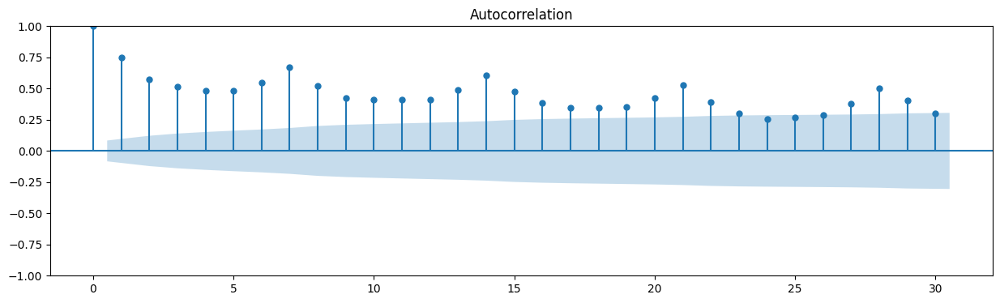

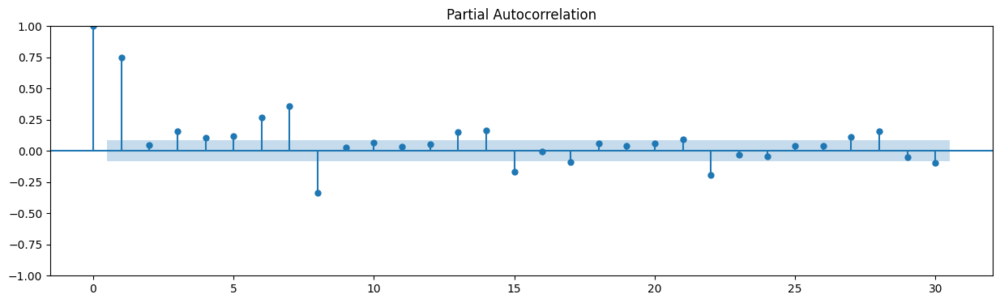

-----------------End: Plotting ACF and PACF-------------
-------Start SARIMA training : ORDER-(1, 1, 1)-SEASONAL ORDER-(1, 1, 1, 15)------


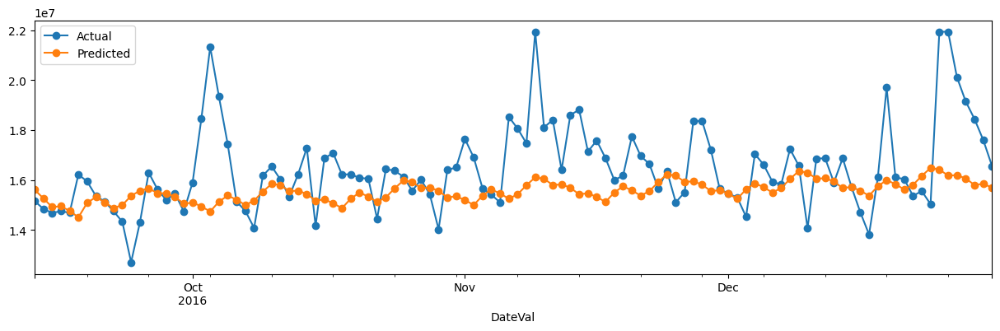

MAE : 1294314.752
RMSE : 1860749.421
MAPE: 0.074
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 2)-SEASONAL ORDER-(1, 1, 2, 15)------


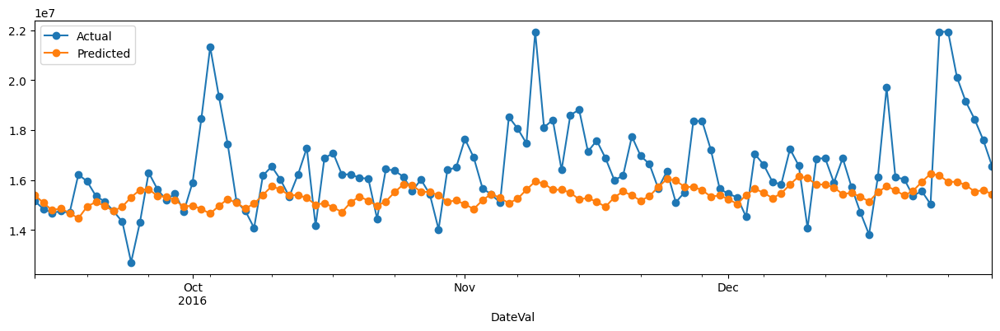

MAE : 1381272.392
RMSE : 1960103.481
MAPE: 0.078
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 3)-SEASONAL ORDER-(1, 1, 3, 15)------


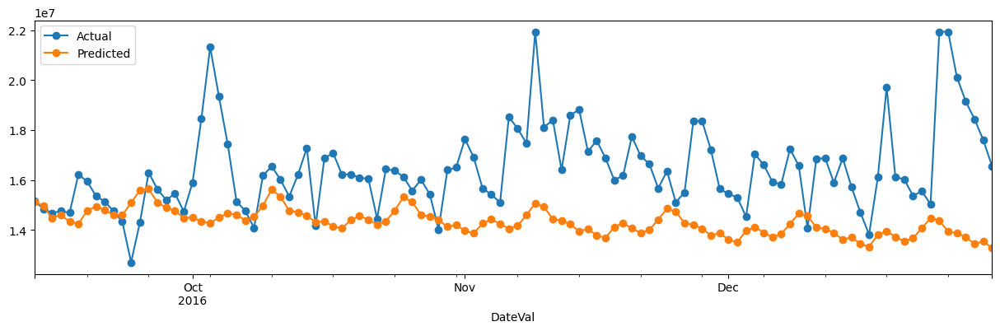

MAE : 2214759.037
RMSE : 2815864.126
MAPE: 0.127
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 1)-SEASONAL ORDER-(2, 1, 1, 15)------


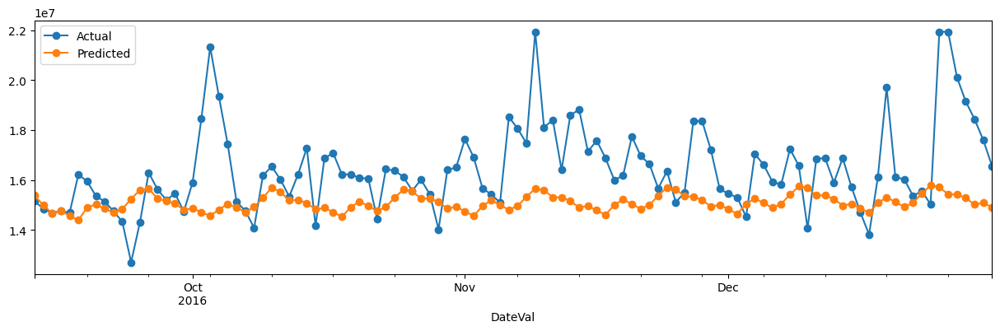

MAE : 1559926.825
RMSE : 2150243.611
MAPE: 0.088
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 2)-SEASONAL ORDER-(2, 1, 2, 15)------


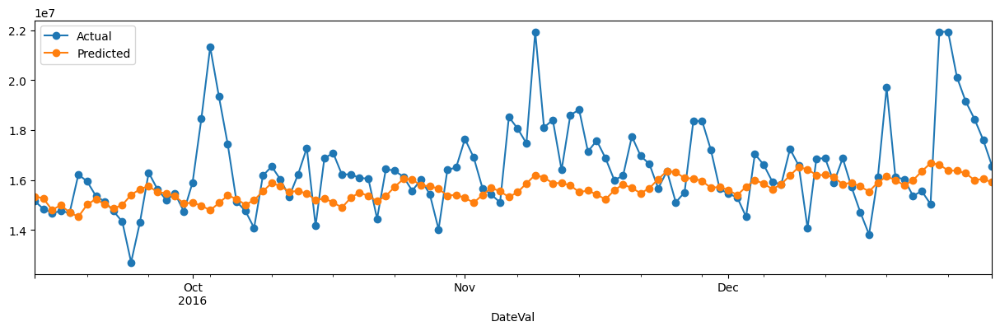

MAE : 1260318.312
RMSE : 1816101.363
MAPE: 0.072
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 3)-SEASONAL ORDER-(2, 1, 3, 15)------


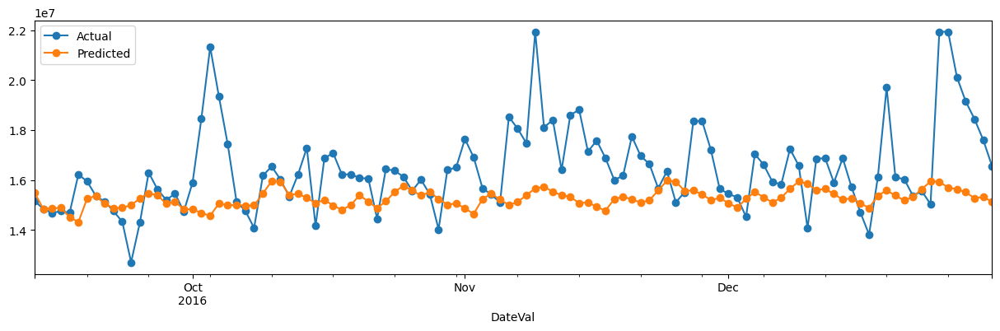

MAE : 1433794.122
RMSE : 2037663.643
MAPE: 0.081
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 1)-SEASONAL ORDER-(3, 1, 1, 15)------


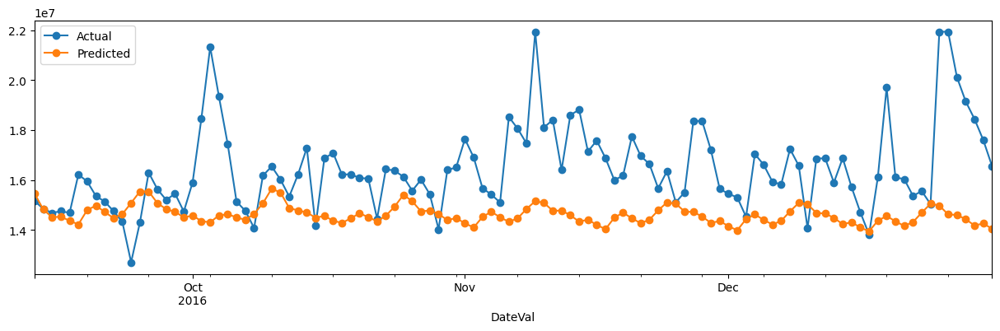

MAE : 1944617.253
RMSE : 2531643.472
MAPE: 0.111
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 2)-SEASONAL ORDER-(3, 1, 2, 15)------


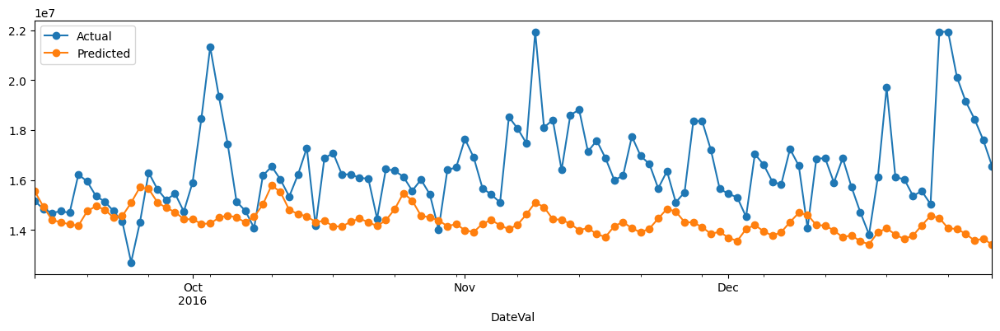

MAE : 2193240.504
RMSE : 2781087.785
MAPE: 0.126
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 3)-SEASONAL ORDER-(3, 1, 3, 15)------


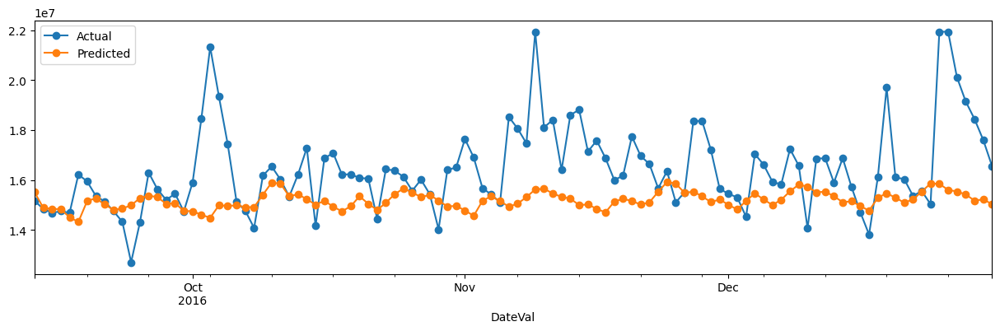

MAE : 1477489.963
RMSE : 2083158.207
MAPE: 0.084
-------END of run-------
-------FINAL RESULTS:-------
-------BEST MAPE VALUE OBTAINED:-------0.072
-------BEST ORDERVALUE SET:-------(2, 1, 2, 15)
-------------------------------------------------------END OF LANGUAGE-de-ANALYSIS------


In [ ]:
pipeline('de',languageAndDateTimeSeries)






-------------------------------------------------------START OF LANGUAGE-ja-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


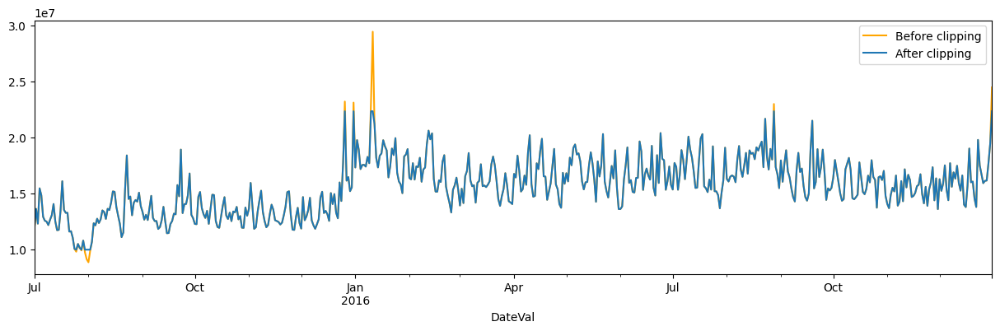

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


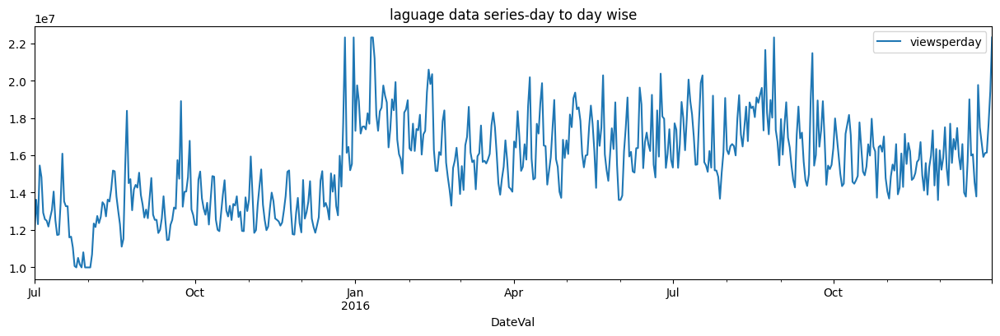

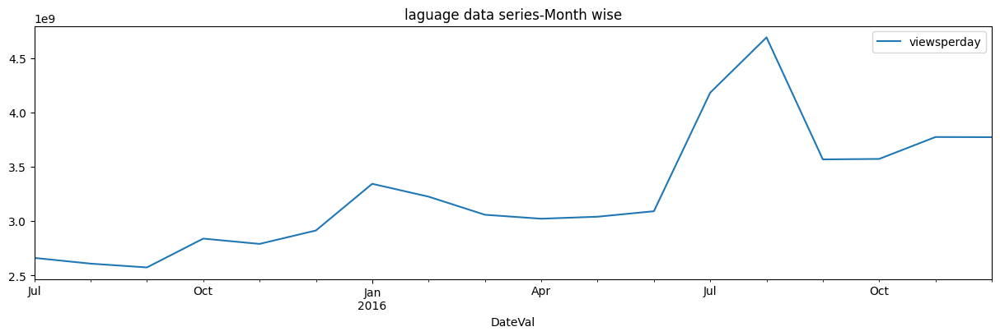

-----------------End: Plotting values for basic view-------------
-----------------ADF test results-------------
Null hypothesis Ho - Time Series is Non-Stationary
ADF Statistic: -2.266942
p-value: 0.182852
Critical Values:
	1%: -3.443
	5%: -2.867
	10%: -2.570
Failed to Reject Ho; Outcome: Time Series is Non-Stationary
-----------------End of ADF test results-------------
-----------------Start: Plotting ACF and PACF-------------


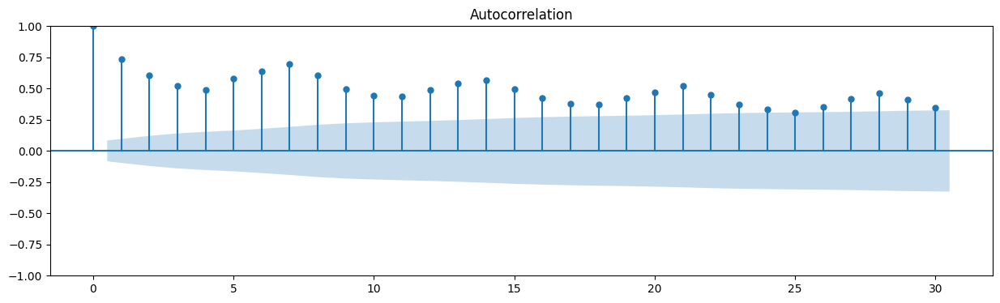

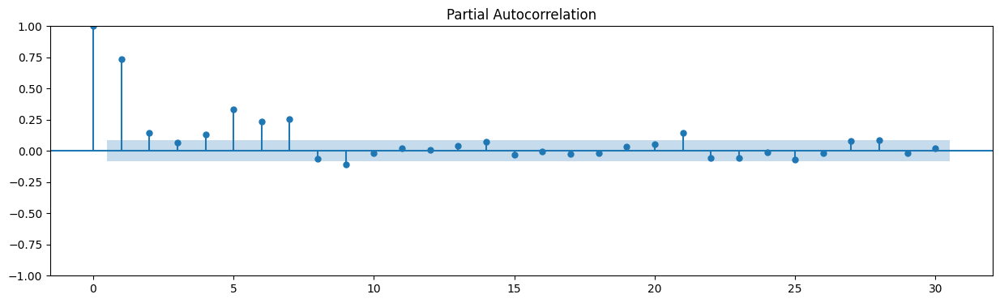

-----------------End: Plotting ACF and PACF-------------
-------Start SARIMA training : ORDER-(1, 1, 1)-SEASONAL ORDER-(1, 1, 1, 15)------


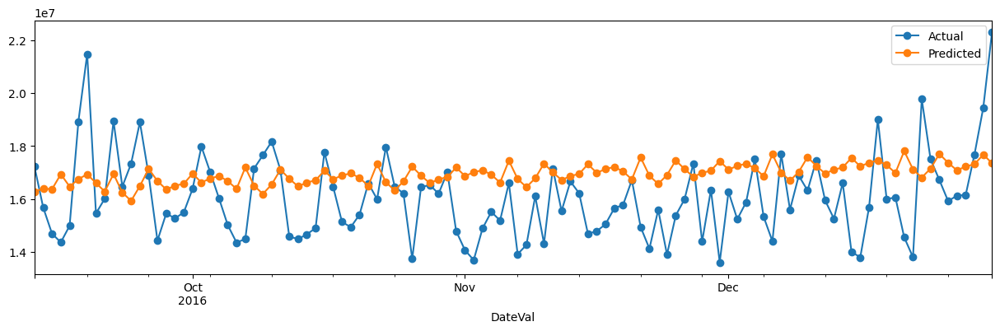

MAE : 1533067.11
RMSE : 1862135.963
MAPE: 0.099
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 2)-SEASONAL ORDER-(1, 1, 2, 15)------


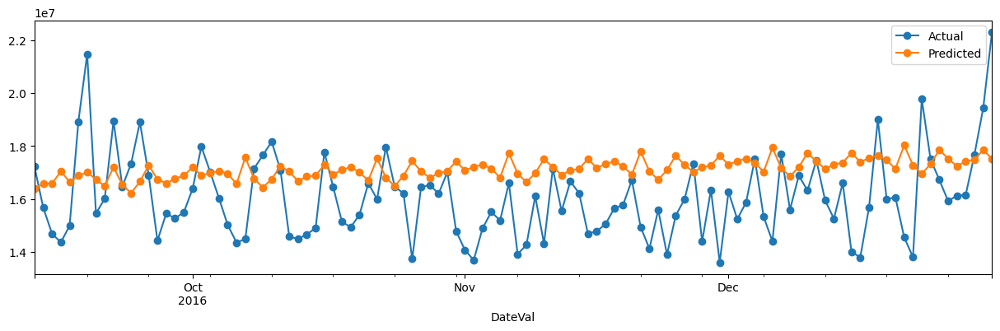

MAE : 1635186.758
RMSE : 1968983.111
MAPE: 0.106
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 3)-SEASONAL ORDER-(1, 1, 3, 15)------


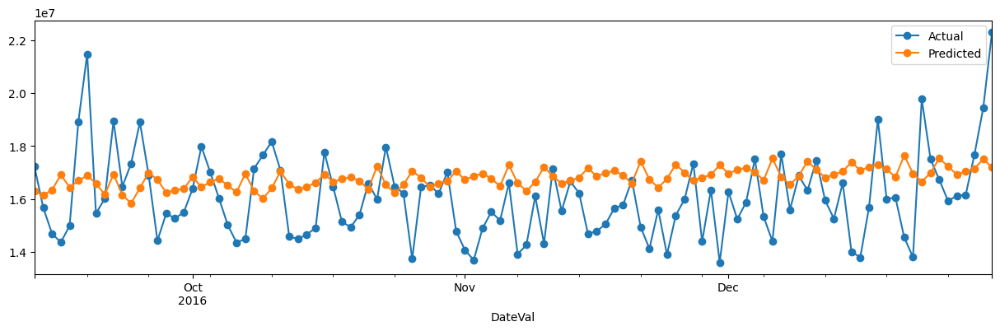

MAE : 1465846.954
RMSE : 1794992.499
MAPE: 0.094
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 1)-SEASONAL ORDER-(2, 1, 1, 15)------


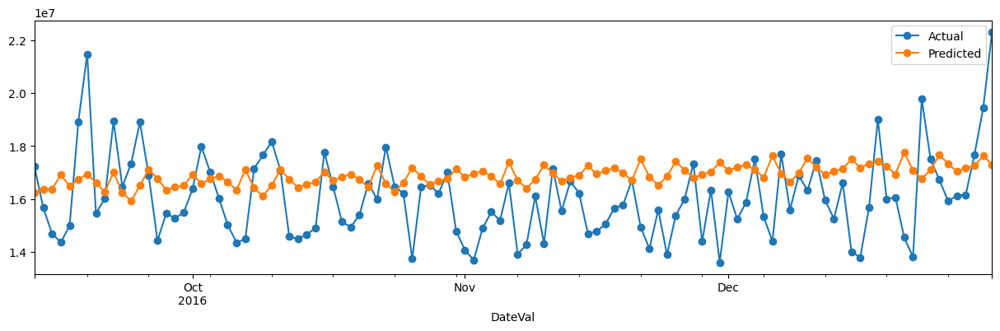

MAE : 1511015.031
RMSE : 1838723.214
MAPE: 0.097
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 2)-SEASONAL ORDER-(2, 1, 2, 15)------


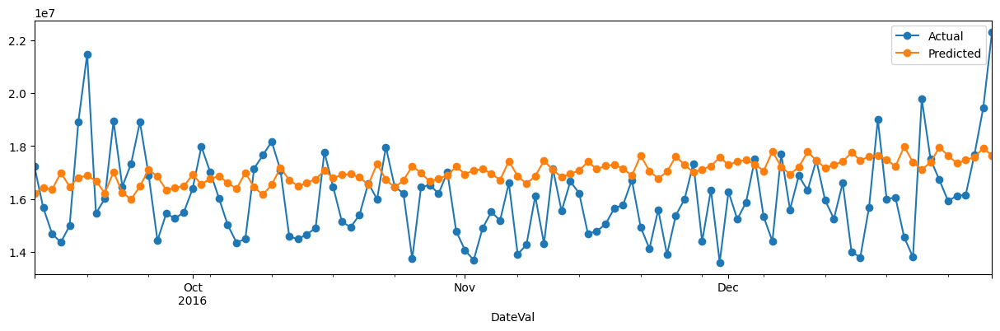

MAE : 1581747.224
RMSE : 1914770.671
MAPE: 0.102
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 3)-SEASONAL ORDER-(2, 1, 3, 15)------


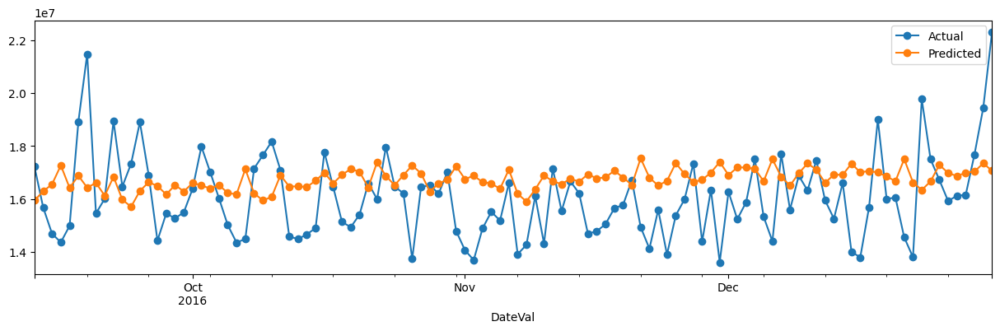

MAE : 1467214.105
RMSE : 1807571.24
MAPE: 0.094
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 1)-SEASONAL ORDER-(3, 1, 1, 15)------


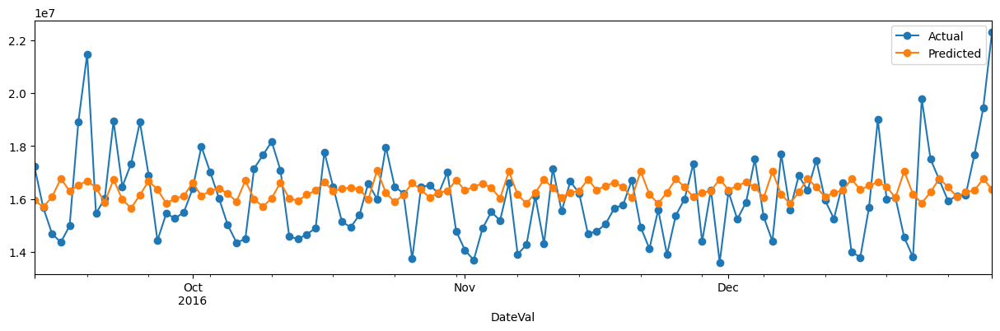

MAE : 1288148.219
RMSE : 1654477.46
MAPE: 0.081
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 2)-SEASONAL ORDER-(3, 1, 2, 15)------


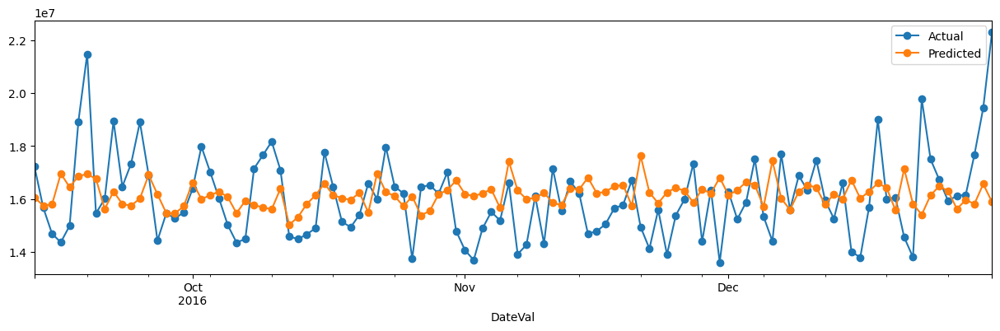

MAE : 1275994.935
RMSE : 1660151.567
MAPE: 0.079
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 3)-SEASONAL ORDER-(3, 1, 3, 15)------


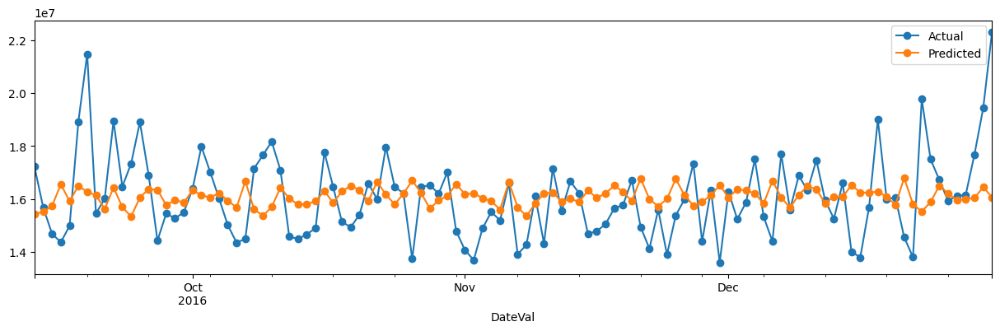

MAE : 1257098.102
RMSE : 1642471.564
MAPE: 0.078
-------END of run-------
-------FINAL RESULTS:-------
-------BEST MAPE VALUE OBTAINED:-------0.078
-------BEST ORDERVALUE SET:-------(3, 1, 3, 15)
-------------------------------------------------------END OF LANGUAGE-ja-ANALYSIS------


In [ ]:
pipeline('ja',languageAndDateTimeSeries)






-------------------------------------------------------START OF LANGUAGE-commons-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


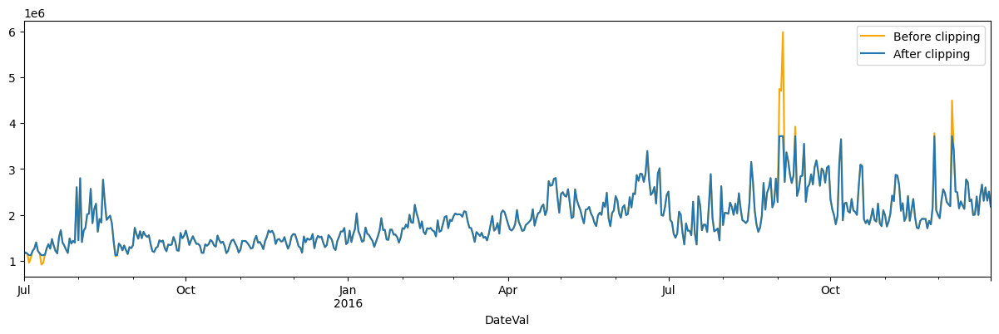

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


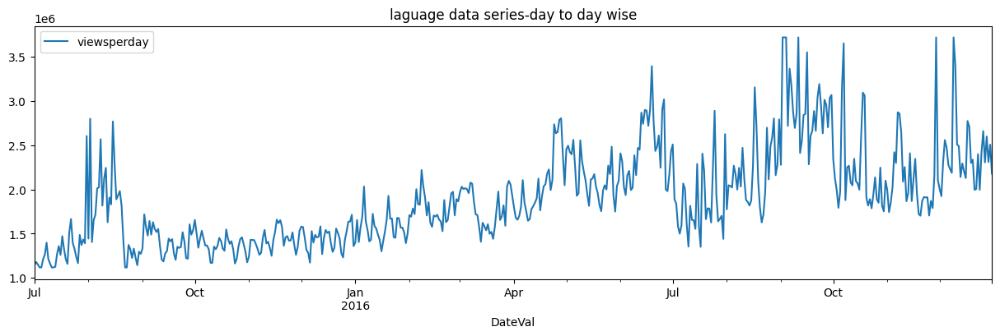

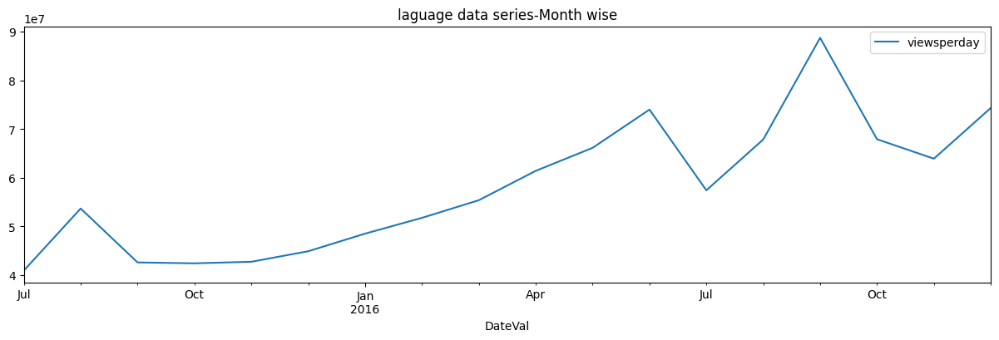

-----------------End: Plotting values for basic view-------------
-----------------ADF test results-------------
Null hypothesis Ho - Time Series is Non-Stationary
ADF Statistic: -2.587319
p-value: 0.095647
Critical Values:
	1%: -3.442
	5%: -2.867
	10%: -2.570
Failed to Reject Ho; Outcome: Time Series is Non-Stationary
-----------------End of ADF test results-------------
-----------------Start: Plotting ACF and PACF-------------


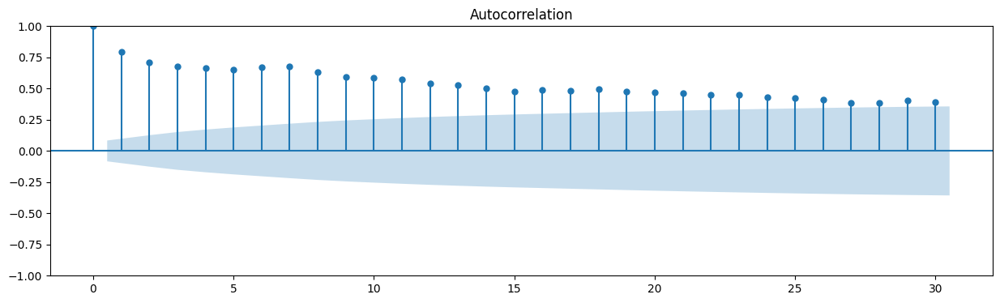

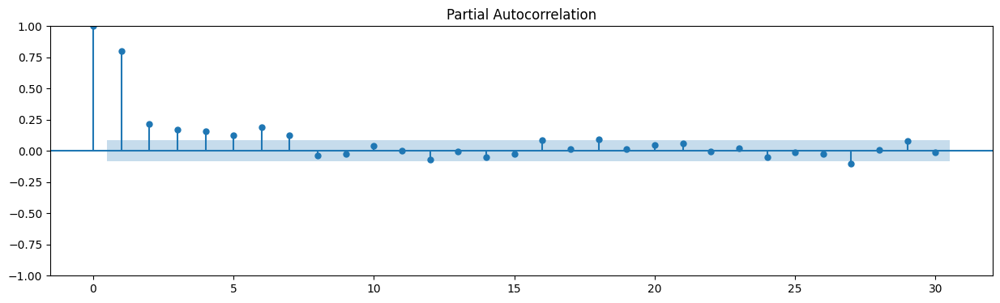

-----------------End: Plotting ACF and PACF-------------
-------Start SARIMA training : ORDER-(1, 1, 1)-SEASONAL ORDER-(1, 1, 1, 15)------


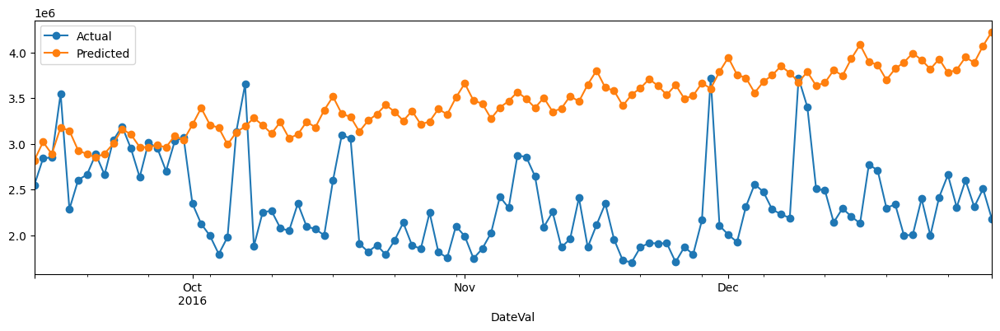

MAE : 1134575.237
RMSE : 1278694.835
MAPE: 0.541
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 2)-SEASONAL ORDER-(1, 1, 2, 15)------


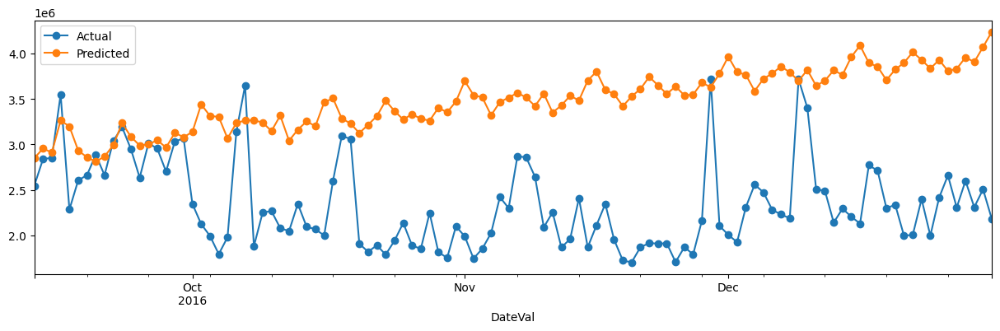

MAE : 1151370.692
RMSE : 1297769.74
MAPE: 0.55
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 3)-SEASONAL ORDER-(1, 1, 3, 15)------


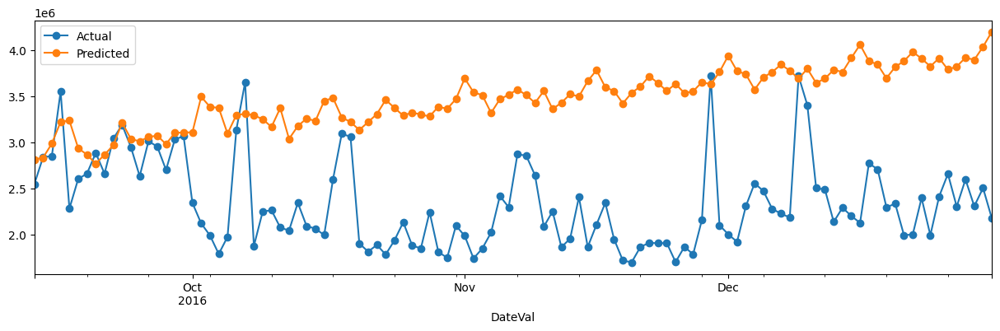

MAE : 1147957.628
RMSE : 1291764.036
MAPE: 0.548
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 1)-SEASONAL ORDER-(2, 1, 1, 15)------


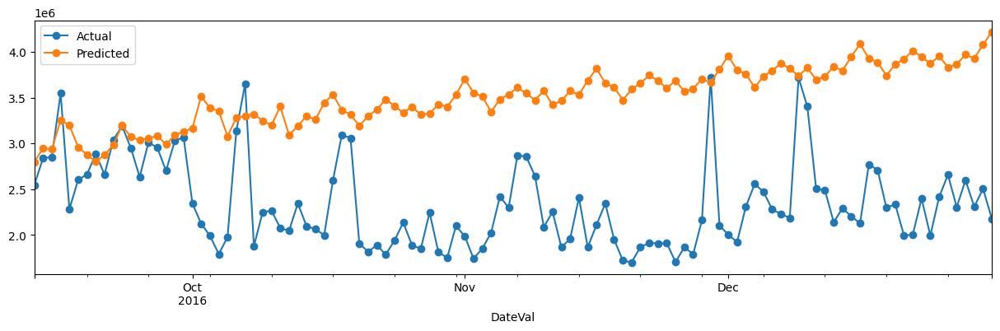

MAE : 1178623.225
RMSE : 1323747.409
MAPE: 0.562
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 2)-SEASONAL ORDER-(2, 1, 2, 15)------


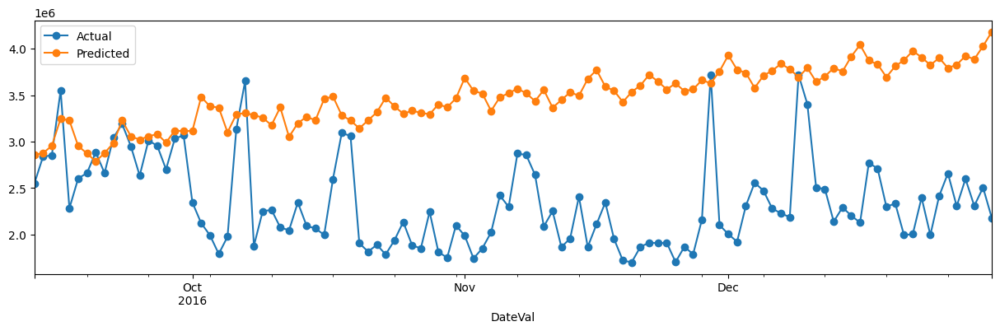

MAE : 1150396.998
RMSE : 1293037.615
MAPE: 0.549
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 3)-SEASONAL ORDER-(2, 1, 3, 15)------


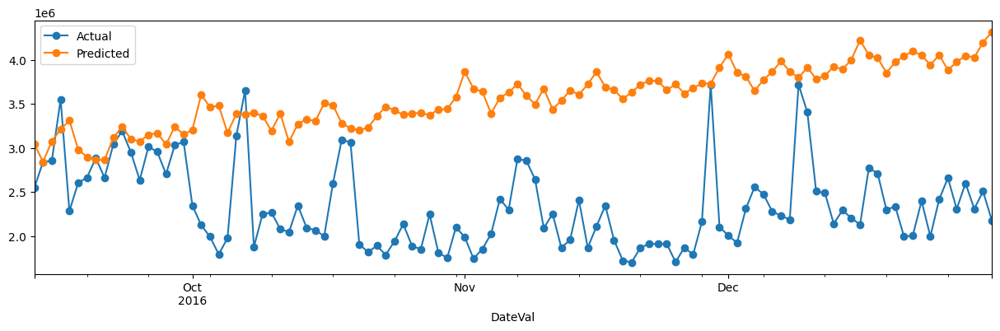

MAE : 1234367.039
RMSE : 1381074.765
MAPE: 0.587
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 1)-SEASONAL ORDER-(3, 1, 1, 15)------


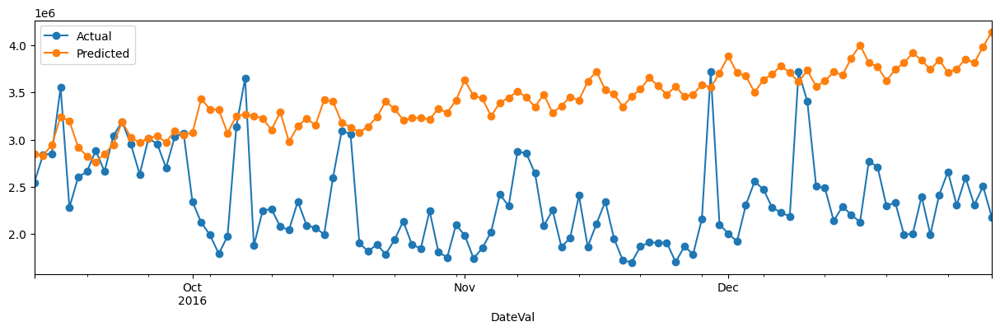

MAE : 1093078.259
RMSE : 1234471.394
MAPE: 0.522
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 2)-SEASONAL ORDER-(3, 1, 2, 15)------


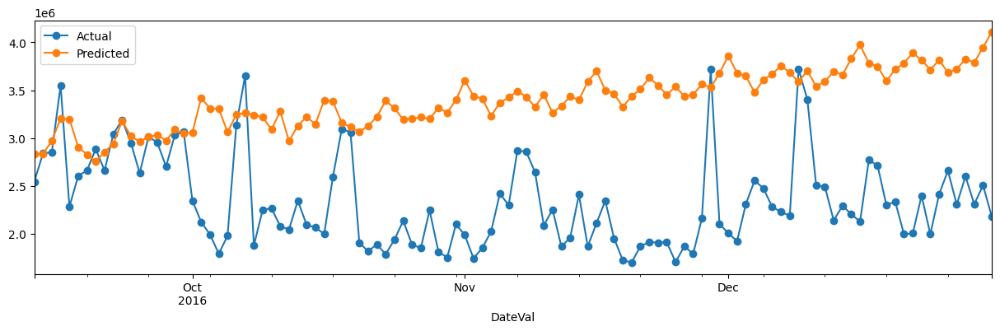

MAE : 1077027.784
RMSE : 1215901.539
MAPE: 0.515
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 3)-SEASONAL ORDER-(3, 1, 3, 15)------


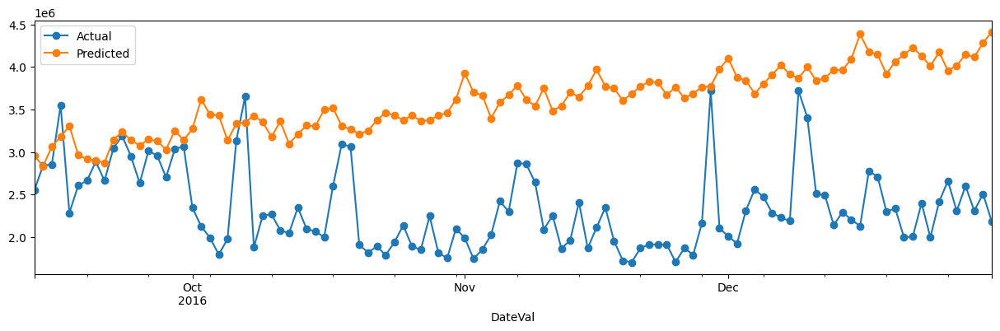

MAE : 1268268.823
RMSE : 1419851.23
MAPE: 0.602
-------END of run-------
-------FINAL RESULTS:-------
-------BEST MAPE VALUE OBTAINED:-------0.515
-------BEST ORDERVALUE SET:-------(3, 1, 2, 15)
-------------------------------------------------------END OF LANGUAGE-commons-ANALYSIS------


In [ ]:
pipeline('commons',languageAndDateTimeSeries)






-------------------------------------------------------START OF LANGUAGE-ru-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


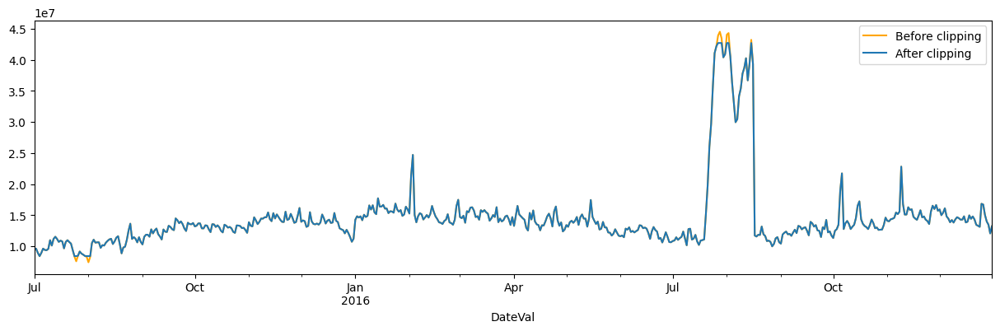

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


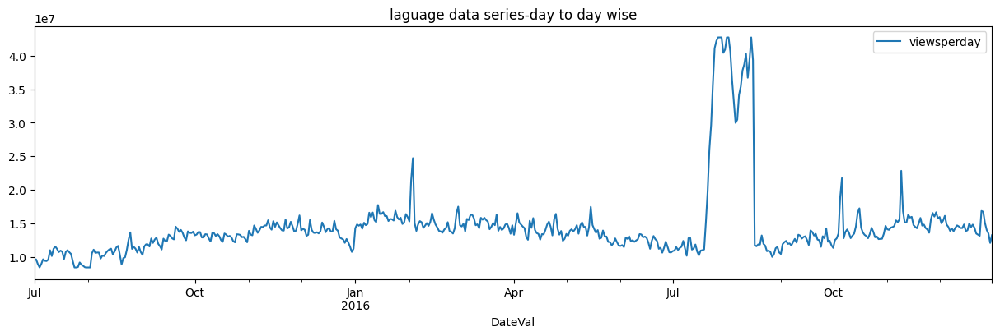

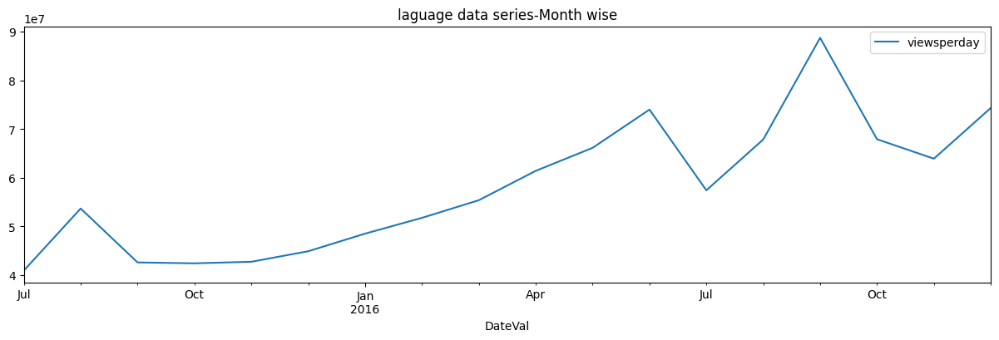

-----------------End: Plotting values for basic view-------------
-----------------ADF test results-------------
Null hypothesis Ho - Time Series is Non-Stationary
ADF Statistic: -2.587319
p-value: 0.095647
Critical Values:
	1%: -3.442
	5%: -2.867
	10%: -2.570
Failed to Reject Ho; Outcome: Time Series is Non-Stationary
-----------------End of ADF test results-------------
-----------------Start: Plotting ACF and PACF-------------


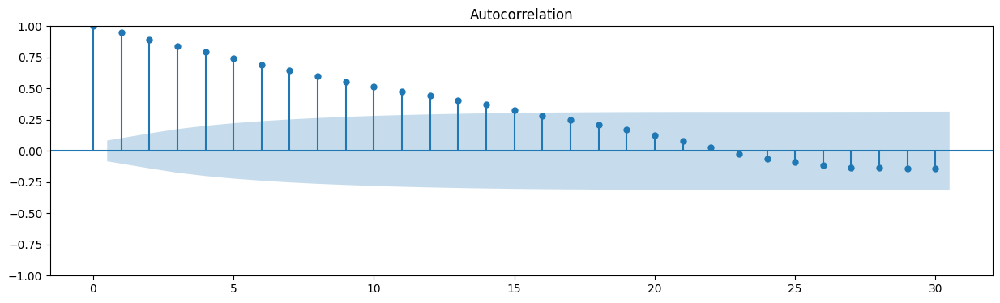

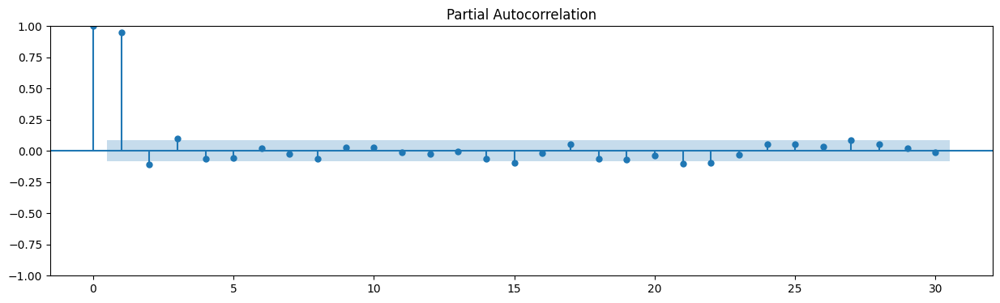

-----------------End: Plotting ACF and PACF-------------
-------Start SARIMA training : ORDER-(1, 1, 1)-SEASONAL ORDER-(1, 1, 1, 25)------


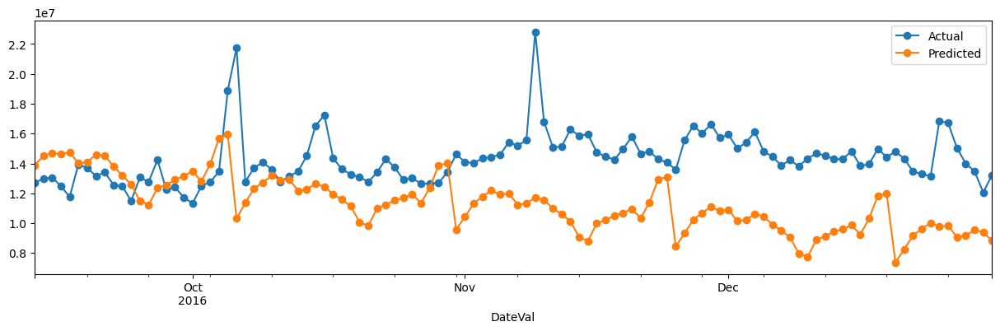

MAE : 3437205.7
RMSE : 4079449.036
MAPE: 0.231
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 2)-SEASONAL ORDER-(1, 1, 2, 25)------


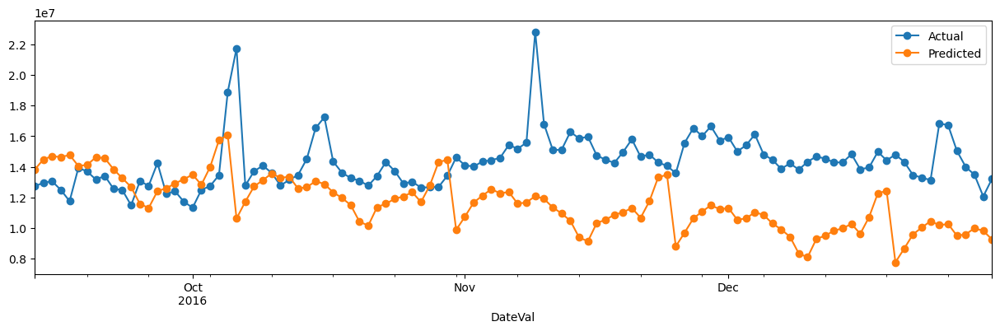

MAE : 3166092.965
RMSE : 3795944.43
MAPE: 0.212
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 3)-SEASONAL ORDER-(1, 1, 3, 25)------


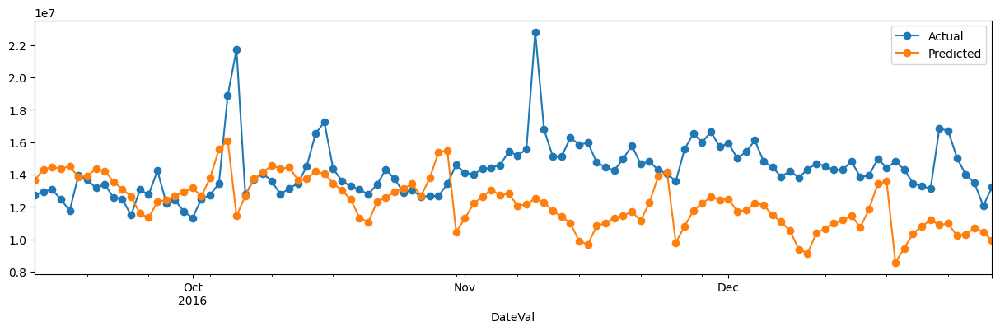

MAE : 2577561.427
RMSE : 3202540.324
MAPE: 0.172
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 1)-SEASONAL ORDER-(2, 1, 1, 25)------


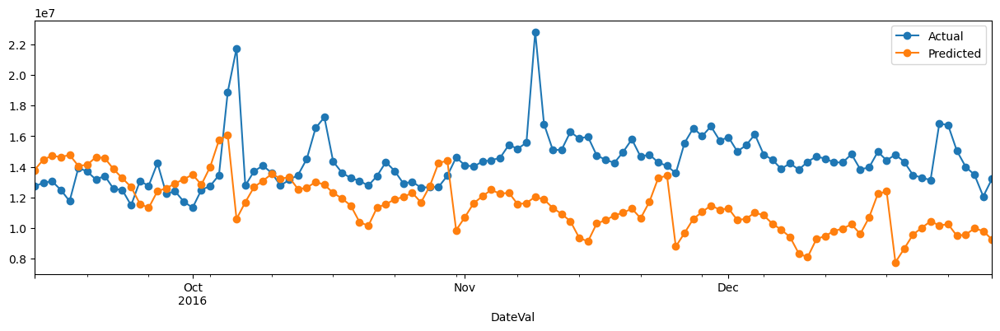

MAE : 3184071.606
RMSE : 3813423.212
MAPE: 0.214
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 2)-SEASONAL ORDER-(2, 1, 2, 25)------


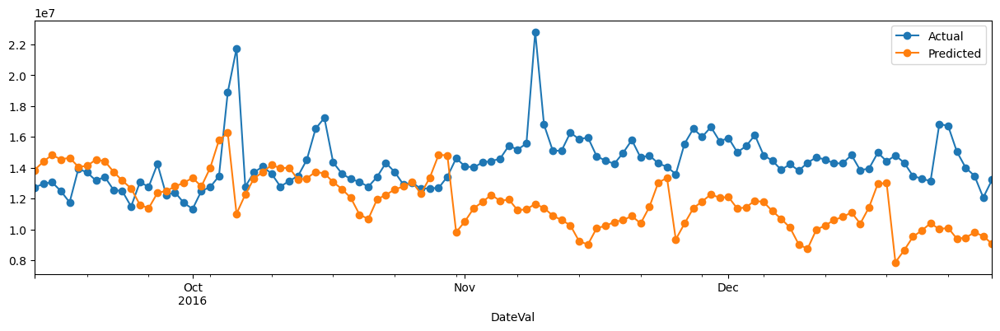

MAE : 2988831.156
RMSE : 3642697.913
MAPE: 0.2
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 3)-SEASONAL ORDER-(2, 1, 3, 25)------


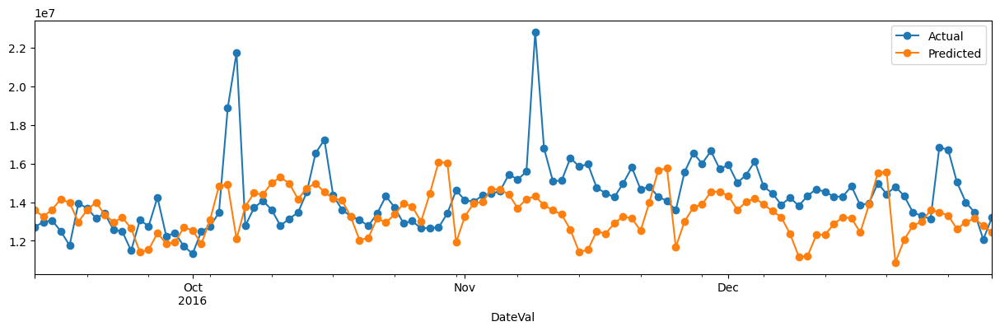

MAE : 1572502.076
RMSE : 2136488.845
MAPE: 0.104
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 1)-SEASONAL ORDER-(3, 1, 1, 25)------


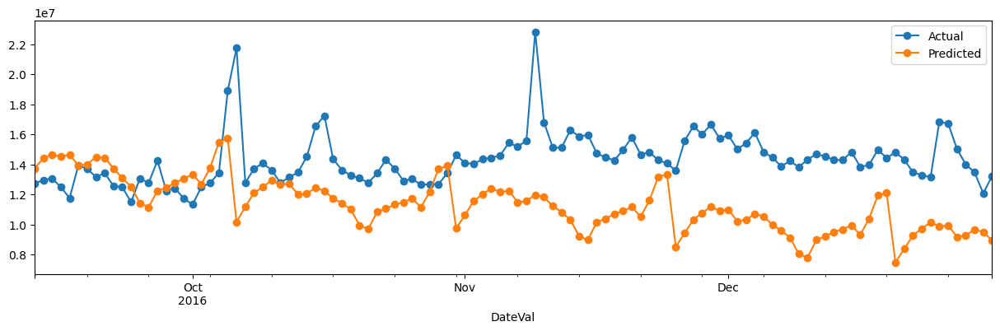

MAE : 3380811.437
RMSE : 4012893.32
MAPE: 0.227
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 2)-SEASONAL ORDER-(3, 1, 2, 25)------


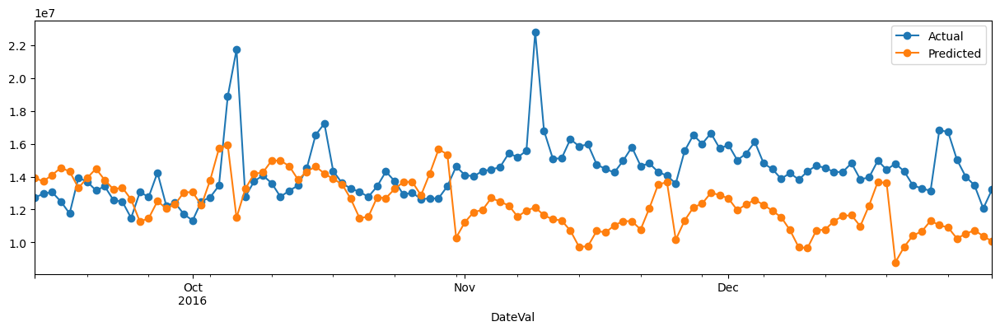

MAE : 2563720.904
RMSE : 3185467.566
MAPE: 0.171
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 3)-SEASONAL ORDER-(3, 1, 3, 25)------


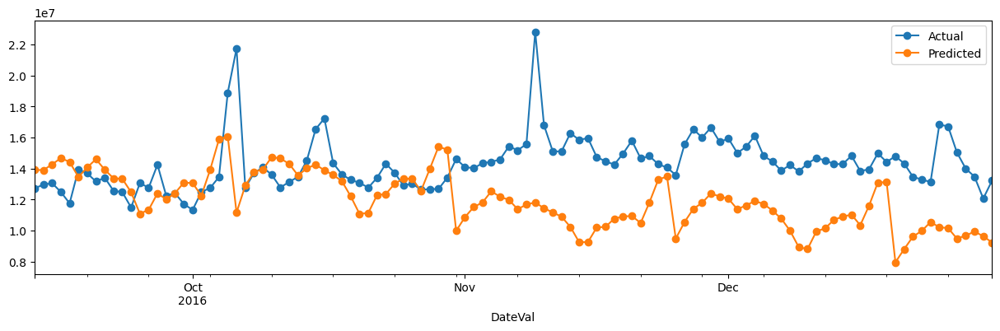

MAE : 2893635.02
RMSE : 3561285.991
MAPE: 0.194
-------END of run-------
-------FINAL RESULTS:-------
-------BEST MAPE VALUE OBTAINED:-------0.104
-------BEST ORDERVALUE SET:-------(2, 1, 3, 25)
-------------------------------------------------------END OF LANGUAGE-ru-ANALYSIS------


In [ ]:
pipeline('ru',languageAndDateTimeSeries)






-------------------------------------------------------START OF LANGUAGE-es-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


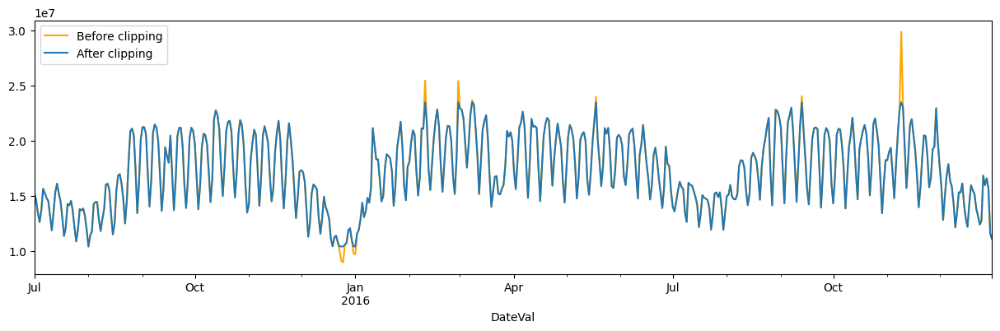

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


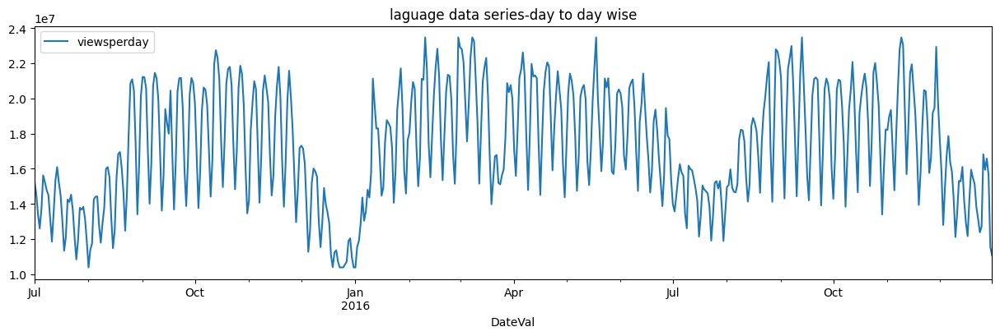

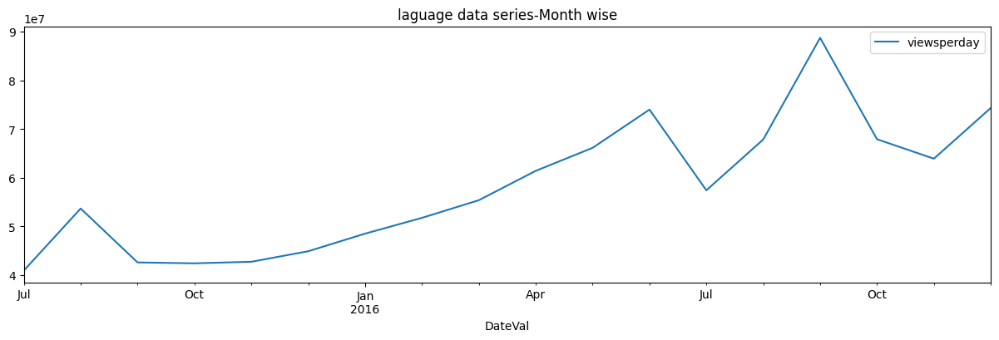

-----------------End: Plotting values for basic view-------------
-----------------ADF test results-------------
Null hypothesis Ho - Time Series is Non-Stationary
ADF Statistic: -2.587319
p-value: 0.095647
Critical Values:
	1%: -3.442
	5%: -2.867
	10%: -2.570
Failed to Reject Ho; Outcome: Time Series is Non-Stationary
-----------------End of ADF test results-------------
-----------------Start: Plotting ACF and PACF-------------


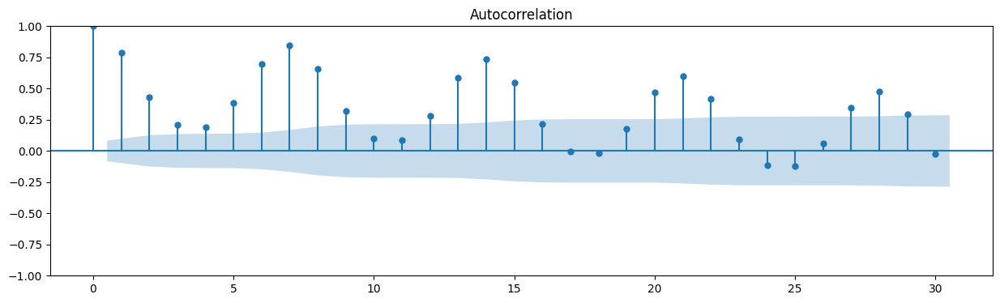

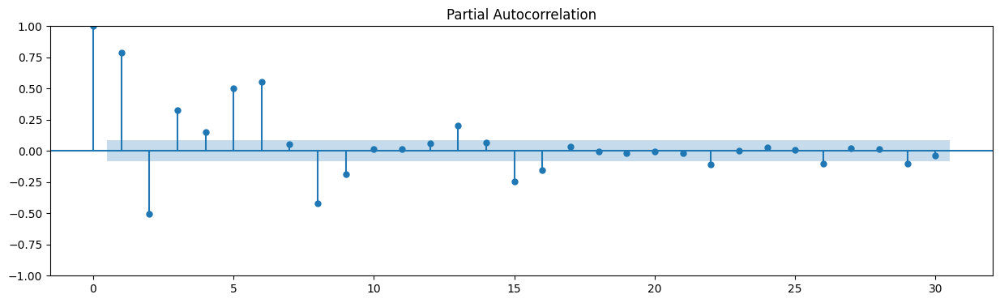

-----------------End: Plotting ACF and PACF-------------
-------Start SARIMA training : ORDER-(1, 1, 1)-SEASONAL ORDER-(1, 1, 1, 25)------


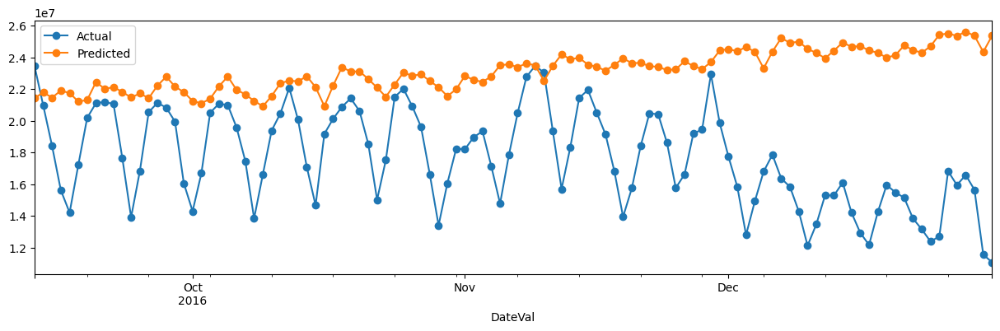

MAE : 5539650.66
RMSE : 6608763.235
MAPE: 0.36
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 2)-SEASONAL ORDER-(1, 1, 2, 25)------


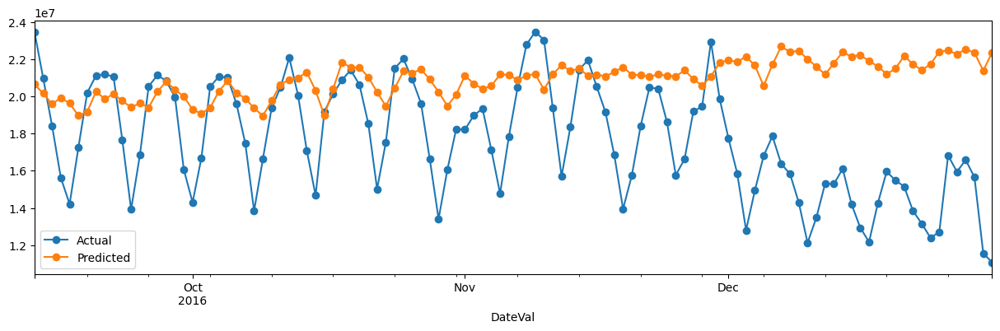

MAE : 3711862.445
RMSE : 4715926.089
MAPE: 0.246
-------END of run-------
-------Start SARIMA training : ORDER-(1, 1, 3)-SEASONAL ORDER-(1, 1, 3, 25)------


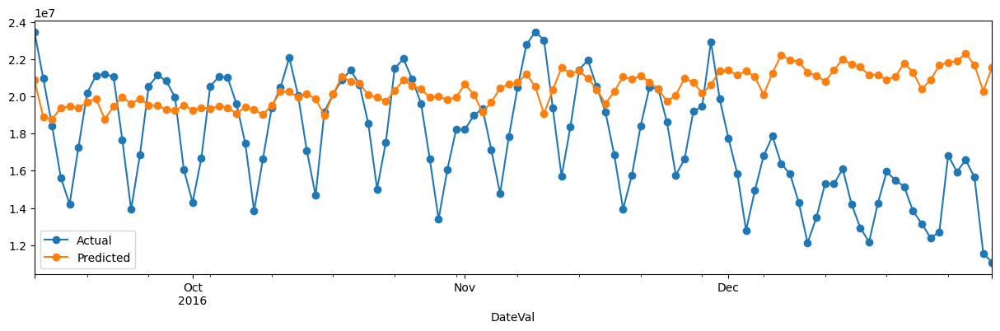

MAE : 3450998.24
RMSE : 4380145.859
MAPE: 0.228
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 1)-SEASONAL ORDER-(2, 1, 1, 25)------


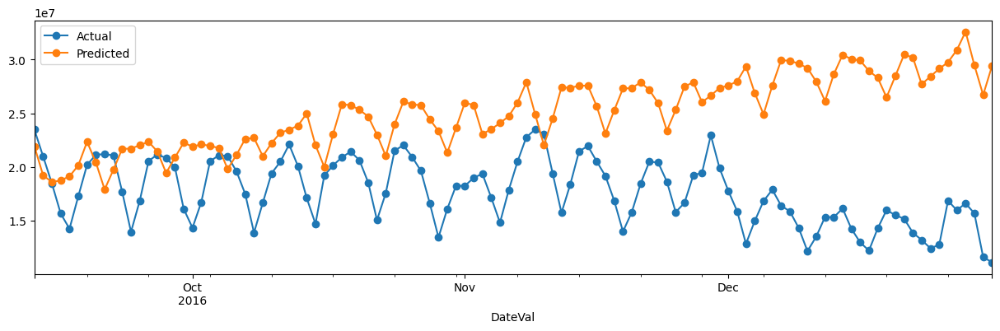

MAE : 7627270.076
RMSE : 9114812.154
MAPE: 0.489
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 2)-SEASONAL ORDER-(2, 1, 2, 25)------


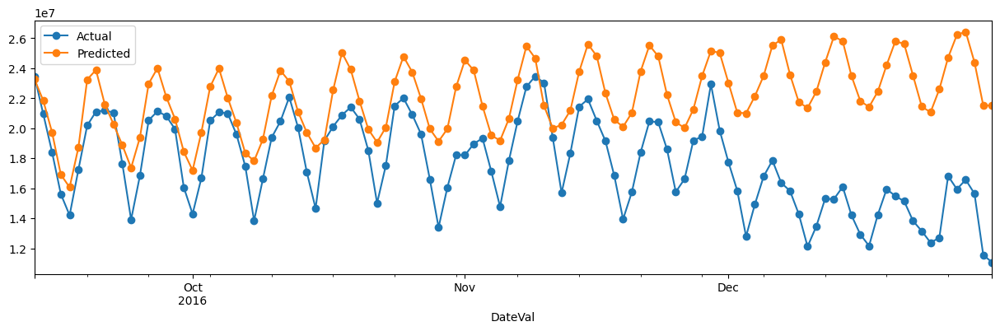

MAE : 4462215.722
RMSE : 5403430.243
MAPE: 0.284
-------END of run-------
-------Start SARIMA training : ORDER-(2, 1, 3)-SEASONAL ORDER-(2, 1, 3, 25)------


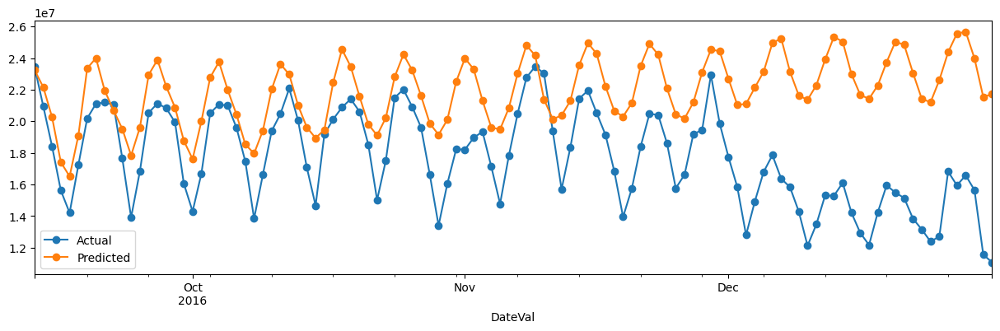

MAE : 4336327.532
RMSE : 5224306.885
MAPE: 0.277
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 1)-SEASONAL ORDER-(3, 1, 1, 25)------


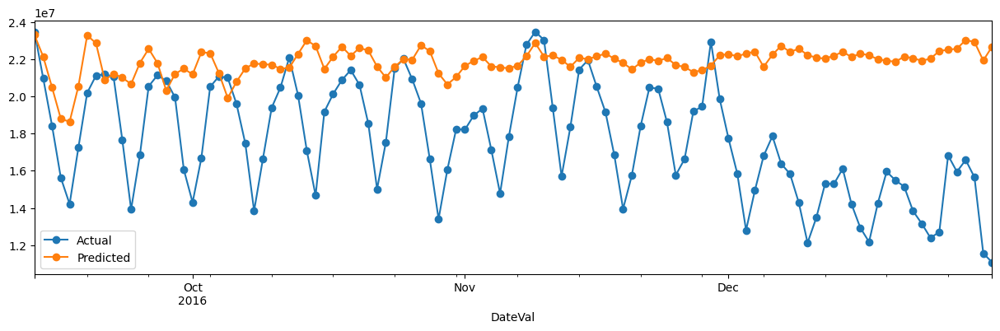

MAE : 4311969.086
RMSE : 5216374.83
MAPE: 0.282
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 2)-SEASONAL ORDER-(3, 1, 2, 25)------


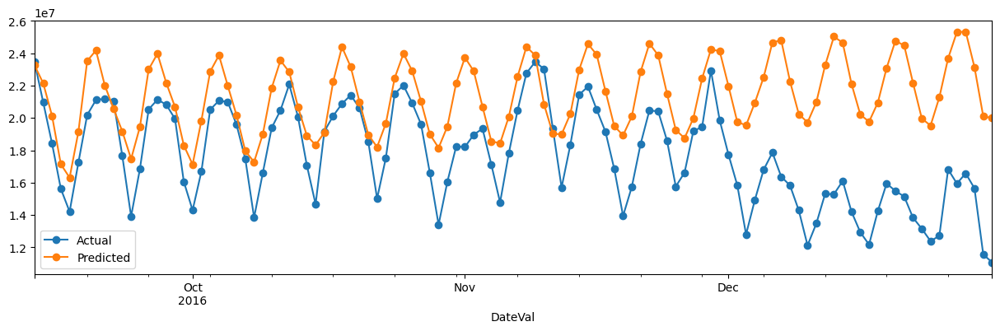

MAE : 3756241.529
RMSE : 4603542.501
MAPE: 0.239
-------END of run-------
-------Start SARIMA training : ORDER-(3, 1, 3)-SEASONAL ORDER-(3, 1, 3, 25)------


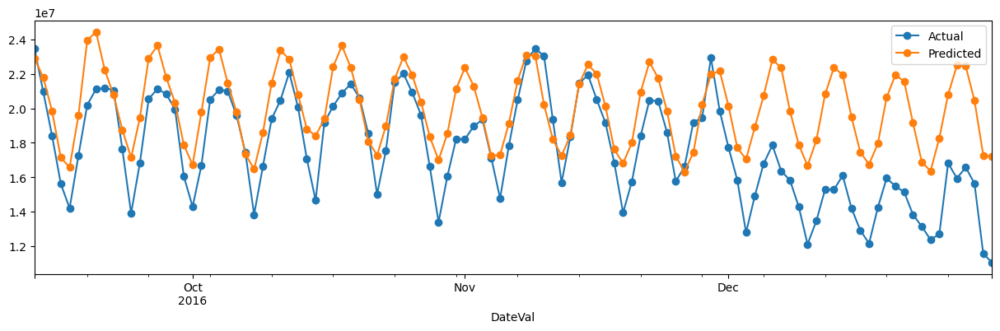

MAE : 2507351.935
RMSE : 3099186.119
MAPE: 0.159
-------END of run-------
-------FINAL RESULTS:-------
-------BEST MAPE VALUE OBTAINED:-------0.159
-------BEST ORDERVALUE SET:-------(3, 1, 3, 25)
-------------------------------------------------------END OF LANGUAGE-es-ANALYSIS------


In [ ]:
pipeline('es',languageAndDateTimeSeries)

## Section 8: Forecast of views for all languages

In [ ]:
warnings.filterwarnings("ignore")
#we have covered 'en' before as part of individual section
languagesList=['zh', 'fr', 'commons', 'ru', 'de', 'ja', 'es']
strcolumnToAnalyze='viewsperday'
outlierLowerLimit=0.01
outlierUpperLimit=0.99

In [ ]:
def pipeline_forecast(inputlanguage,languageAndDateTimeSeries,ordervalue,seasonal_ordervalue,noOfPredictions):
  print('-------------------------------------------------------START OF LANGUAGE-'+inputlanguage+'-ANALYSIS------')
  warnings.filterwarnings("ignore")
  datadf=prepareLanguageData(inputlanguage,languageAndDateTimeSeries)
  datadf=missingValueCheck(datadf)
  datadf=oulierRemoval(datadf,outlierUpperLimit,outlierLowerLimit)
  plotDatabasicVisuals(datadf)
  pred_df=trainAndForecastWithSARIMAModel(inputlanguage,datadf,strcolumnToAnalyze,ordervalue,seasonal_ordervalue,noOfPredictions)
  print('-------------------------------------------------------END OF LANGUAGE-'+inputlanguage+'-ANALYSIS------')
  return pred_df

In [ ]:
def trainAndForecastWithSARIMAModel(inputlanguage,totaldf,columnToWork,ordervalue,seasonal_ordervalue,noOfPredictions):
  from statsmodels.tsa.statespace.sarimax import SARIMAX
  print('-------Start SARIMA Forecasting : ORDER-'+str(ordervalue)+'-SEASONAL ORDER-'+str(seasonal_ordervalue)+'------')
  model = SARIMAX(totaldf[columnToWork], order=ordervalue,seasonal_order=seasonal_ordervalue) 
  model = model.fit(disp=False)
  pred_df=pd.DataFrame()
  pred_df['forecasted_Views_'+inputlanguage] = model.forecast(steps=noOfPredictions)
  pred_df['forecasted_Views_'+inputlanguage].plot(style='-o',label='Forecasted')
  plt.legend()
  plt.show()
  print(pred_df['forecasted_Views_'+inputlanguage].describe())  
  print('-------END of forecasting-------')
  return pred_df

-------------------------------------------------------START OF LANGUAGE-en-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


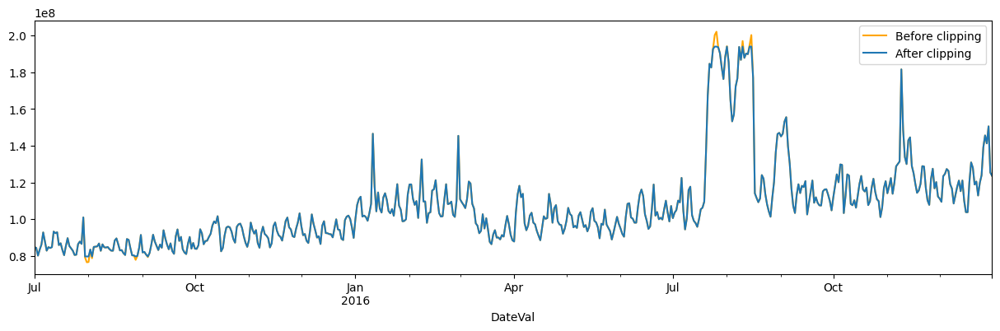

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


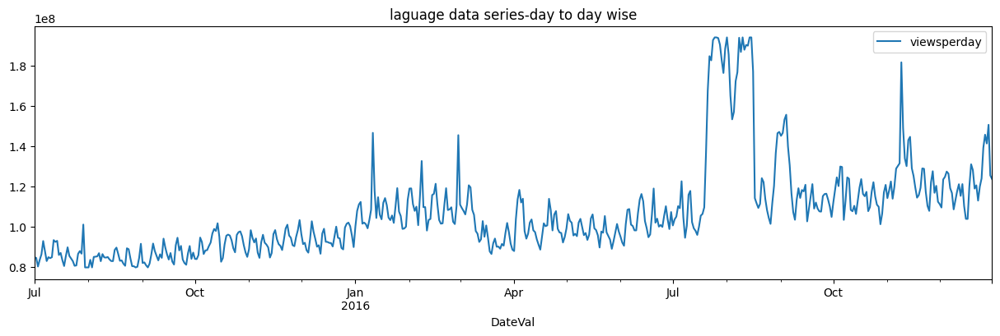

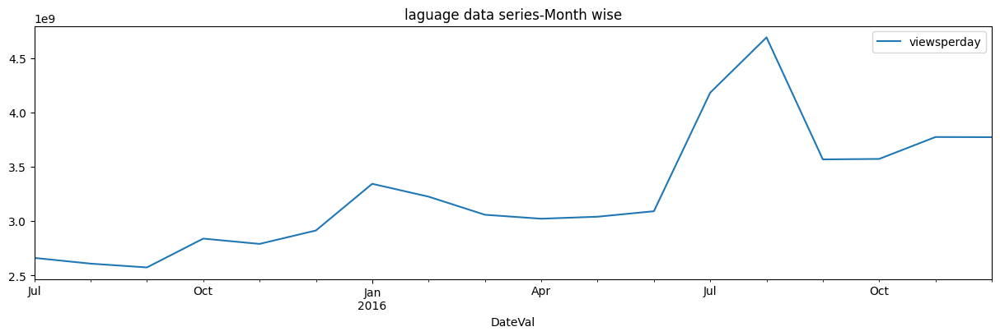

-----------------End: Plotting values for basic view-------------
-------Start SARIMA Forecasting : ORDER-(1, 1, 2)-SEASONAL ORDER-(1, 1, 2, 15)------


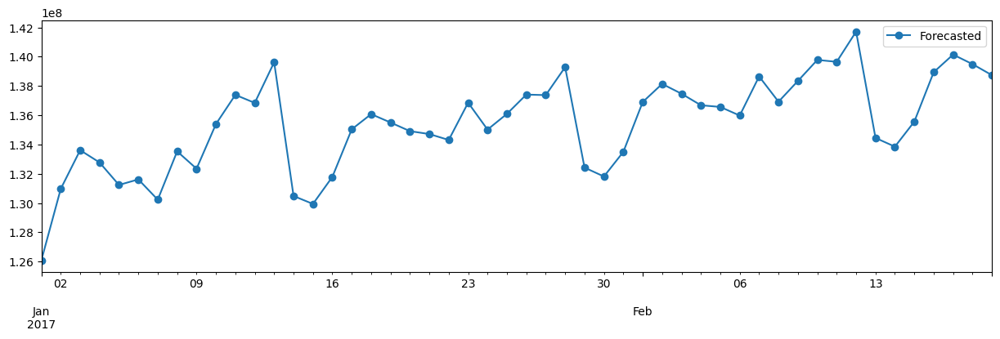

count    5.000000e+01
mean     1.354455e+08
std      3.238975e+06
min      1.260921e+08
25%      1.335073e+08
50%      1.357722e+08
75%      1.374566e+08
max      1.417142e+08
Name: forecasted_Views_en, dtype: float64
-------END of forecasting-------
-------------------------------------------------------END OF LANGUAGE-en-ANALYSIS------


In [ ]:
pred_df_en=pipeline_forecast('en',languageAndDateTimeSeries,(1, 1, 2),(1, 1, 2, 15),50)

-------------------------------------------------------START OF LANGUAGE-zh-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


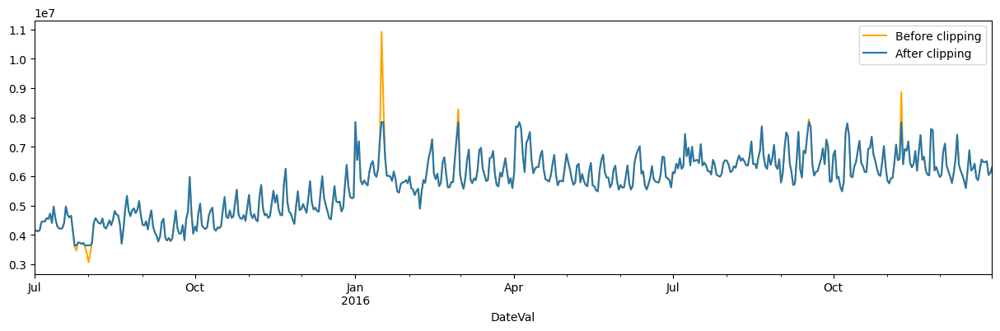

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


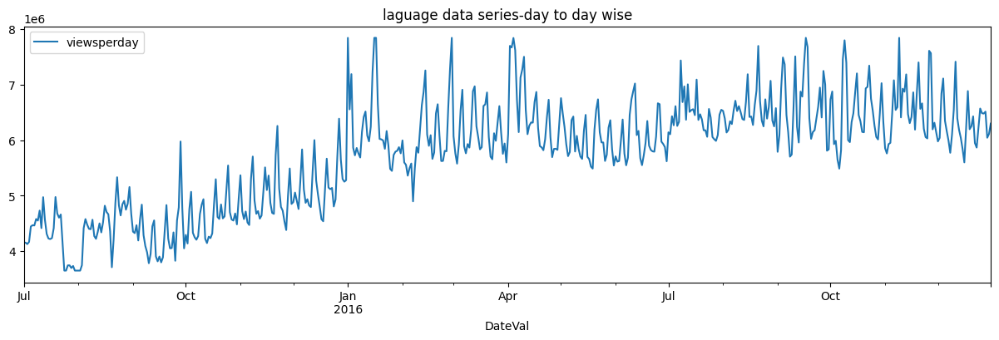

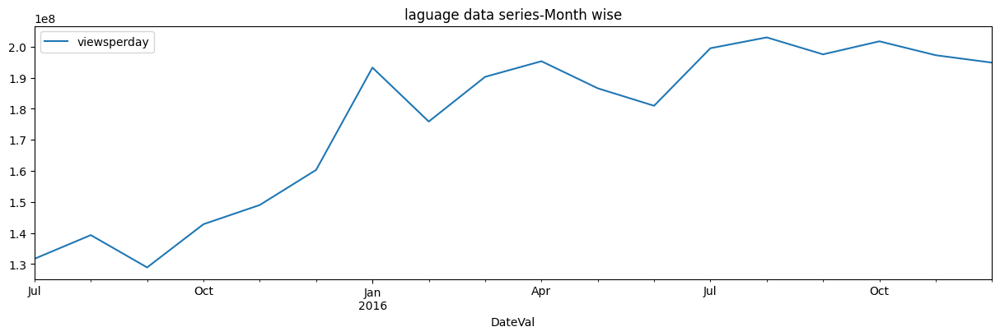

-----------------End: Plotting values for basic view-------------
-------Start SARIMA Forecasting : ORDER-(3, 1, 2)-SEASONAL ORDER-(3, 1, 2, 15)------


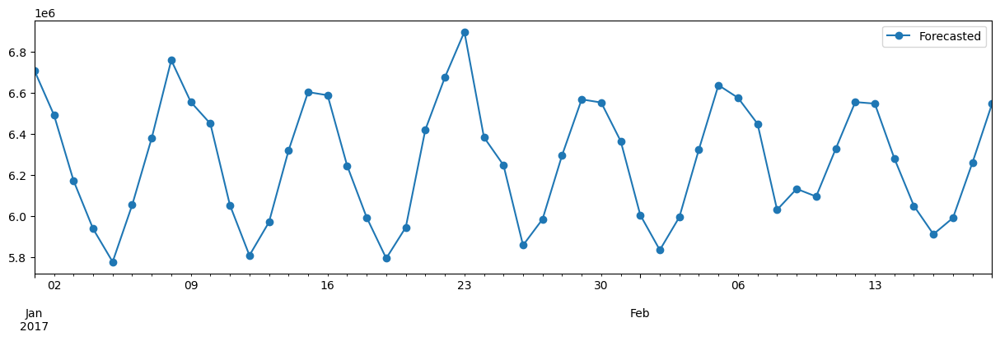

count    5.000000e+01
mean     6.268252e+06
std      2.923420e+05
min      5.778586e+06
25%      5.998492e+06
50%      6.288840e+06
75%      6.546654e+06
max      6.895621e+06
Name: forecasted_Views_zh, dtype: float64
-------END of forecasting-------
-------------------------------------------------------END OF LANGUAGE-zh-ANALYSIS------


In [ ]:
pred_df_zh=pipeline_forecast('zh',languageAndDateTimeSeries,(3, 1, 2),(3, 1, 2, 15),50)

-------------------------------------------------------START OF LANGUAGE-fr-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


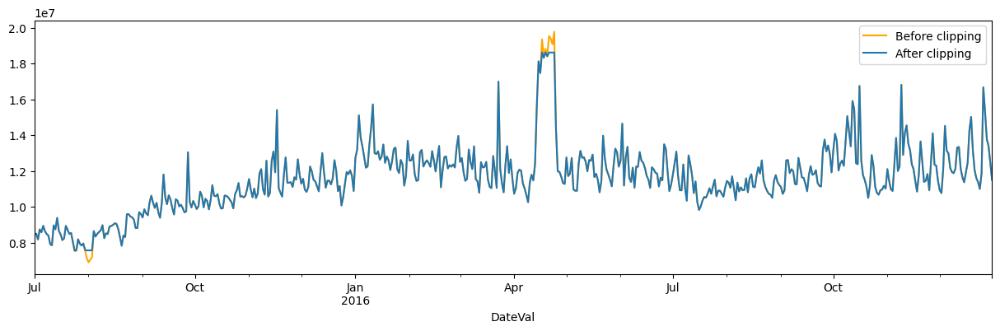

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


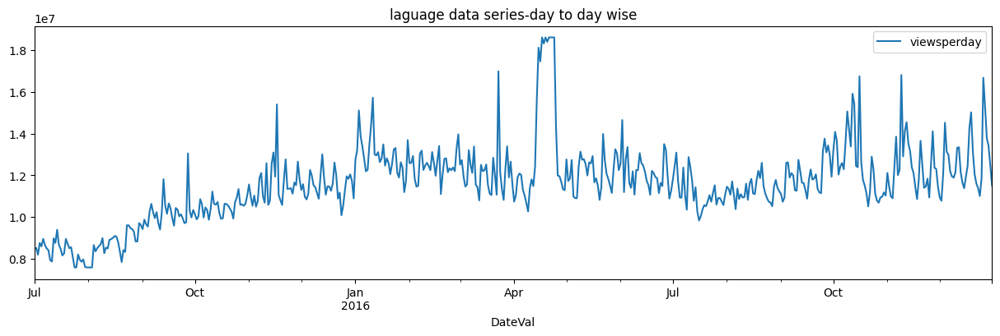

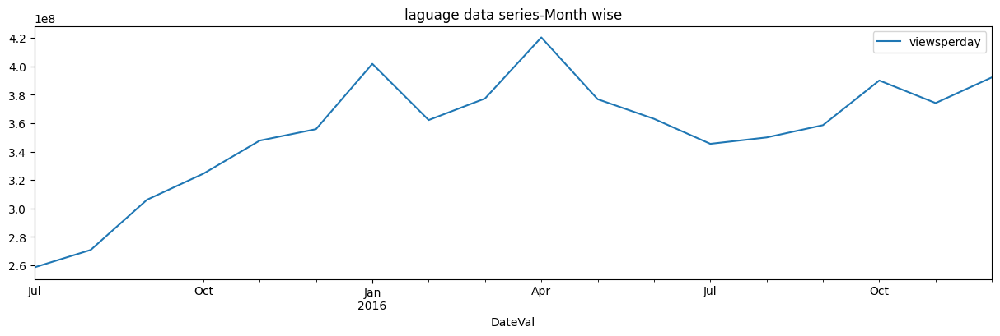

-----------------End: Plotting values for basic view-------------
-------Start SARIMA Forecasting : ORDER-(2, 1, 3)-SEASONAL ORDER-(2, 1, 3, 15)------


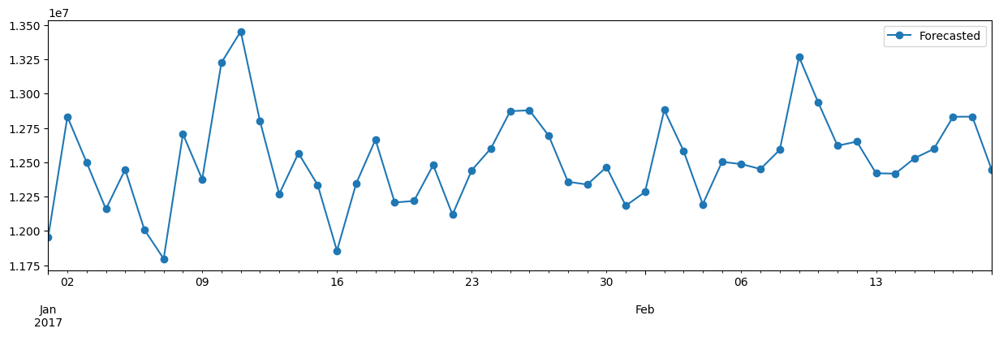

count    5.000000e+01
mean     1.251357e+07
std      3.366532e+05
min      1.179669e+07
25%      1.233524e+07
50%      1.248353e+07
75%      1.268617e+07
max      1.345391e+07
Name: forecasted_Views_fr, dtype: float64
-------END of forecasting-------
-------------------------------------------------------END OF LANGUAGE-fr-ANALYSIS------


In [ ]:
pred_df_fr=pipeline_forecast('fr',languageAndDateTimeSeries,(2, 1, 3),(2, 1, 3, 15),50)

-------------------------------------------------------START OF LANGUAGE-de-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


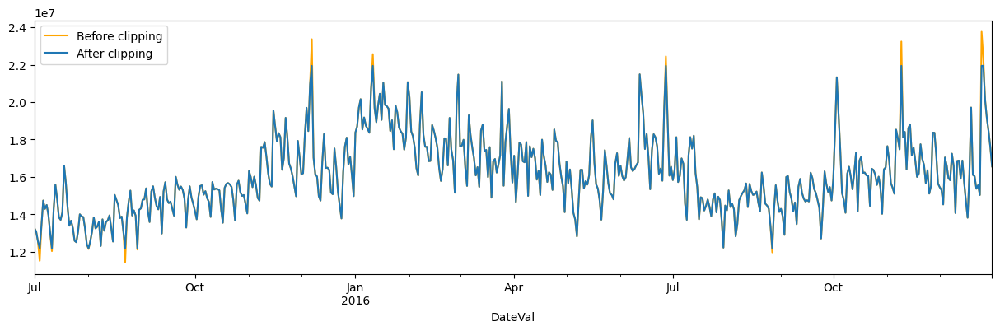

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


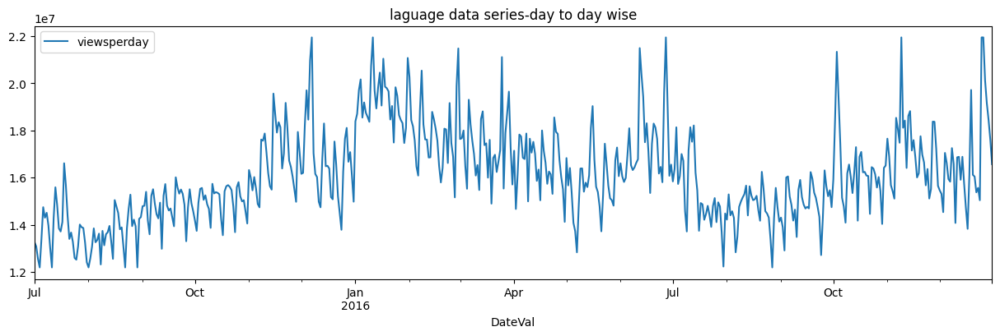

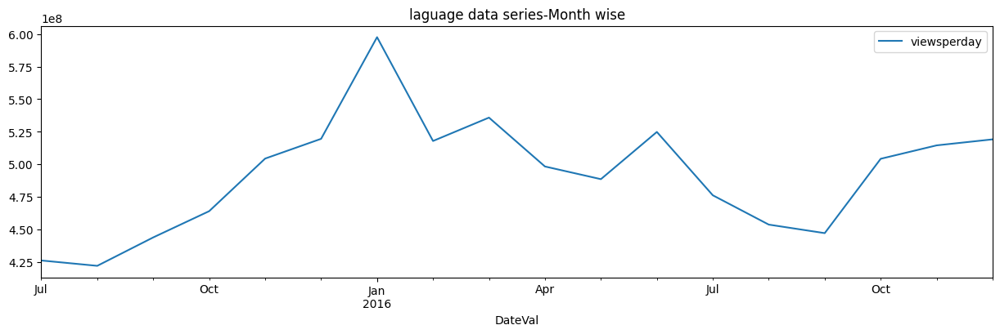

-----------------End: Plotting values for basic view-------------
-------Start SARIMA Forecasting : ORDER-(2, 1, 2)-SEASONAL ORDER-(2, 1, 2, 15)------


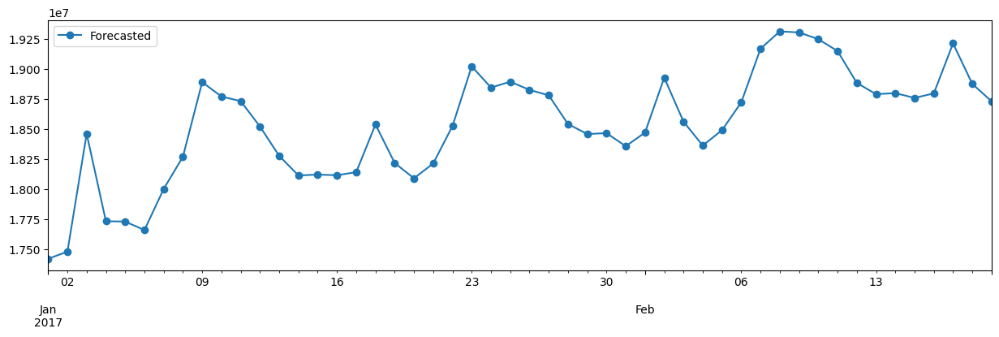

count    5.000000e+01
mean     1.853676e+07
std      4.636382e+05
min      1.741944e+07
25%      1.823102e+07
50%      1.854095e+07
75%      1.884205e+07
max      1.931520e+07
Name: forecasted_Views_de, dtype: float64
-------END of forecasting-------
-------------------------------------------------------END OF LANGUAGE-de-ANALYSIS------


In [ ]:
pred_df_de=pipeline_forecast('de',languageAndDateTimeSeries,(2, 1, 2),(2, 1, 2, 15),50)

-------------------------------------------------------START OF LANGUAGE-ja-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


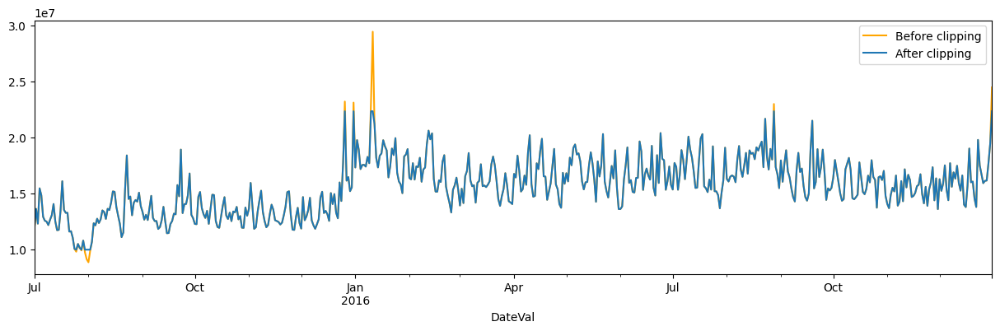

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


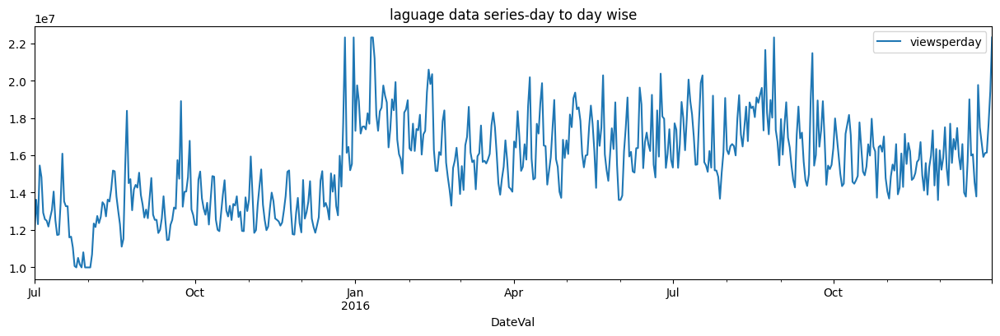

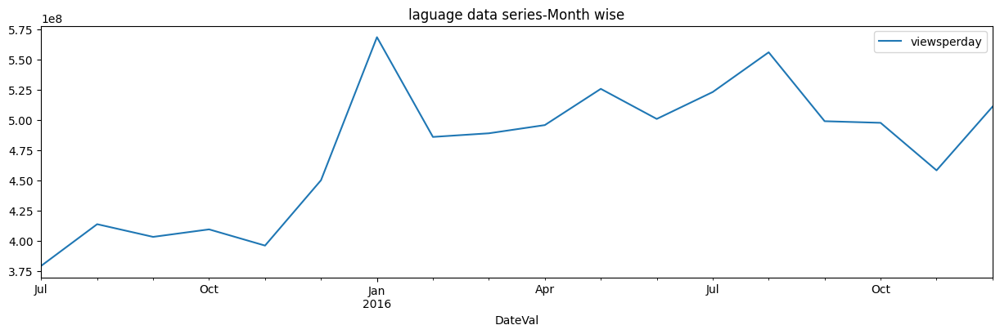

-----------------End: Plotting values for basic view-------------
-------Start SARIMA Forecasting : ORDER-(3, 1, 3)-SEASONAL ORDER-(3, 1, 3, 15)------


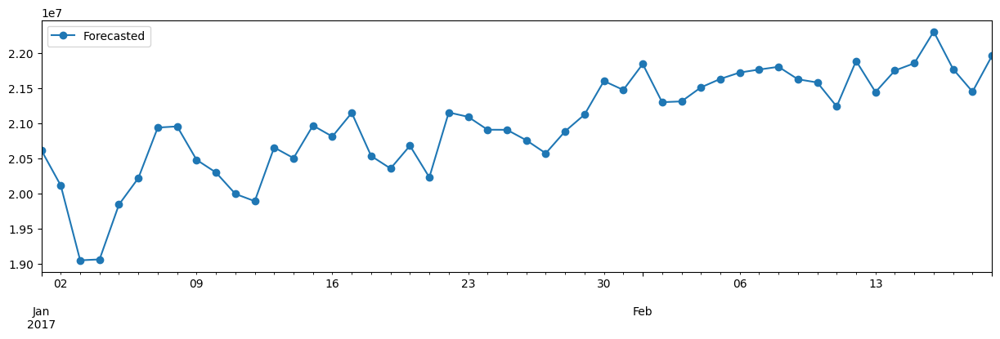

count    5.000000e+01
mean     2.099664e+07
std      7.266027e+05
min      1.905499e+07
25%      2.054904e+07
50%      2.103478e+07
75%      2.160094e+07
max      2.230931e+07
Name: forecasted_Views_ja, dtype: float64
-------END of forecasting-------
-------------------------------------------------------END OF LANGUAGE-ja-ANALYSIS------


In [ ]:
pred_df_ja=pipeline_forecast('ja',languageAndDateTimeSeries,(3, 1, 3),(3, 1, 3, 15),50)

-------------------------------------------------------START OF LANGUAGE-ru-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


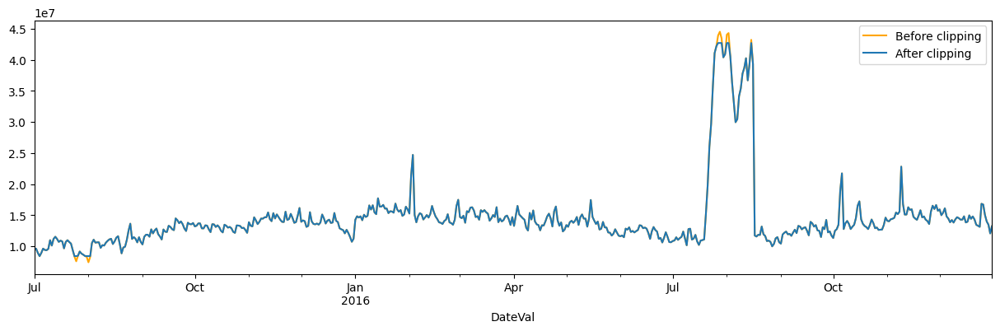

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


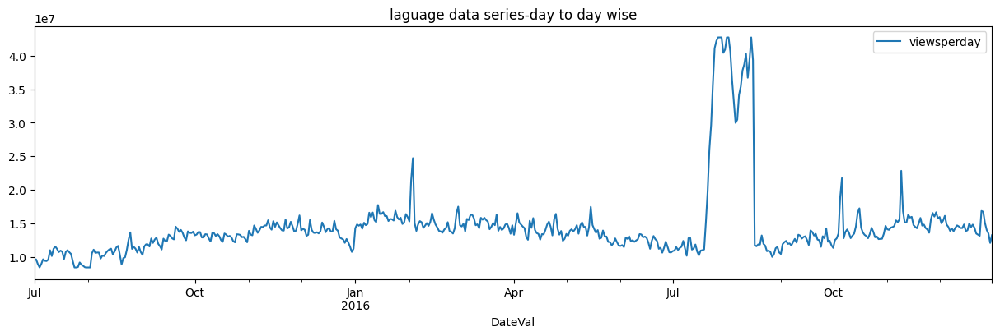

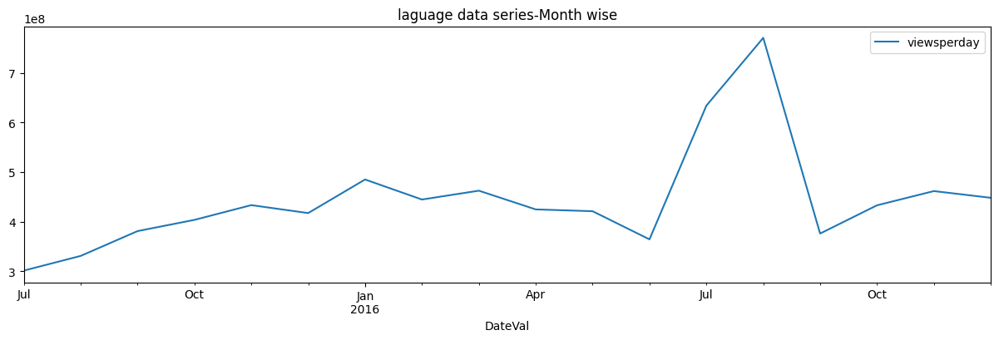

-----------------End: Plotting values for basic view-------------
-------Start SARIMA Forecasting : ORDER-(2, 1, 3)-SEASONAL ORDER-(2, 1, 3, 25)------


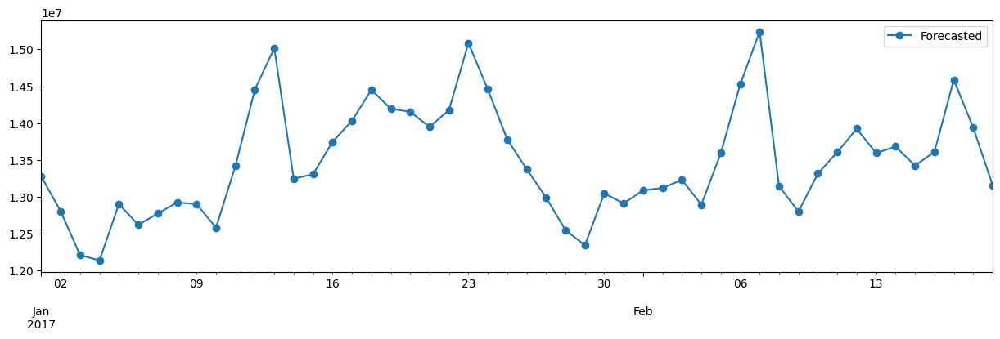

count    5.000000e+01
mean     1.348443e+07
std      7.459563e+05
min      1.213601e+07
25%      1.291241e+07
50%      1.334431e+07
75%      1.394517e+07
max      1.524191e+07
Name: forecasted_Views_ru, dtype: float64
-------END of forecasting-------
-------------------------------------------------------END OF LANGUAGE-ru-ANALYSIS------


In [ ]:
pred_df_ru=pipeline_forecast('ru',languageAndDateTimeSeries,(2, 1, 3),(2, 1, 3, 25),50)

-------------------------------------------------------START OF LANGUAGE-es-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


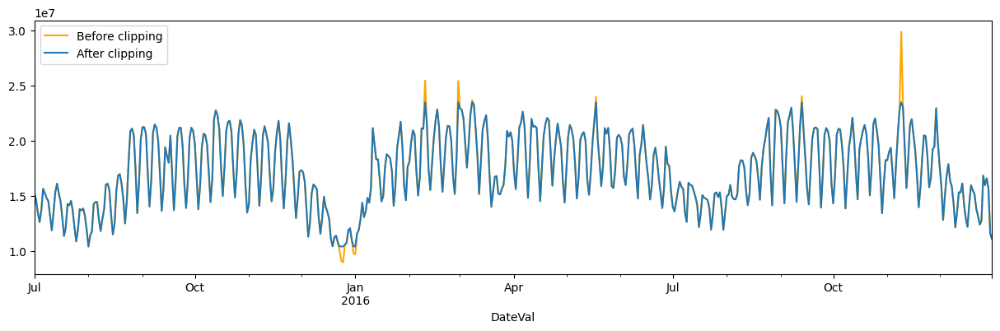

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


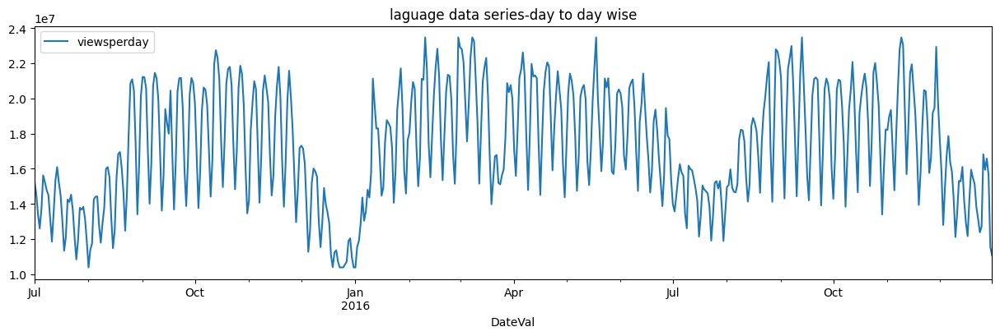

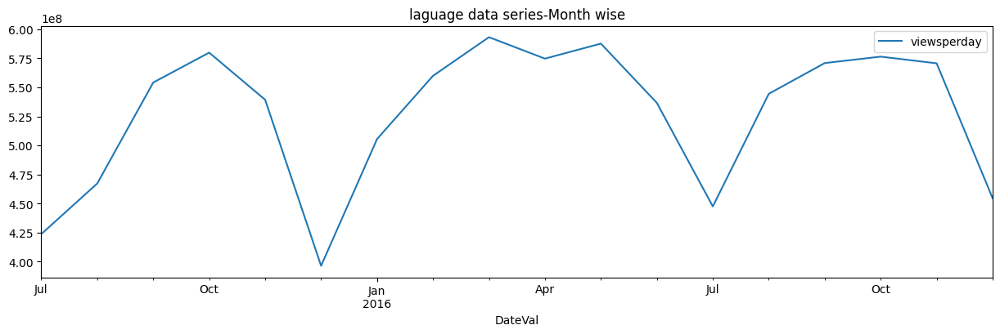

-----------------End: Plotting values for basic view-------------
-------Start SARIMA Forecasting : ORDER-(3, 1, 2)-SEASONAL ORDER-(3, 1, 2, 25)------


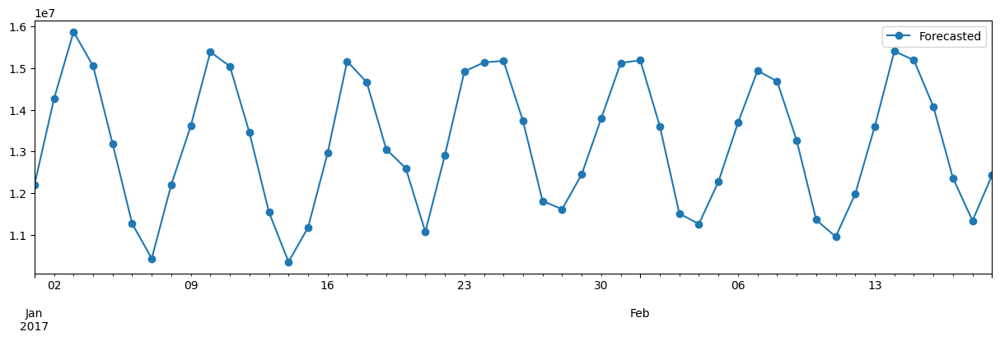

count    5.000000e+01
mean     1.320936e+07
std      1.572401e+06
min      1.035178e+07
25%      1.185586e+07
50%      1.322819e+07
75%      1.486394e+07
max      1.587685e+07
Name: forecasted_Views_es, dtype: float64
-------END of forecasting-------
-------------------------------------------------------END OF LANGUAGE-es-ANALYSIS------


In [ ]:
pred_df_es=pipeline_forecast('es',languageAndDateTimeSeries,(3, 1, 2),(3, 1, 2, 25),50)

-------------------------------------------------------START OF LANGUAGE-commons-ANALYSIS------
-----------------Start: Filtering necessary language data-------------
-----------------End: Filtering necessary language data-------------
-----------------Start: Missing value check-------------
------Date Description:
count            550
unique           550
top       2015-07-01
freq               1
Name: DateVal, dtype: object

------Missing value check in "Time Series":
No Missing Values-No need of imputation

------Missing value check In "Views per Day":
No Missing Values in "Views column" as well-No need of imputation
-----------------End: Missing value check-------------
-----------------Start: clipping data-------------


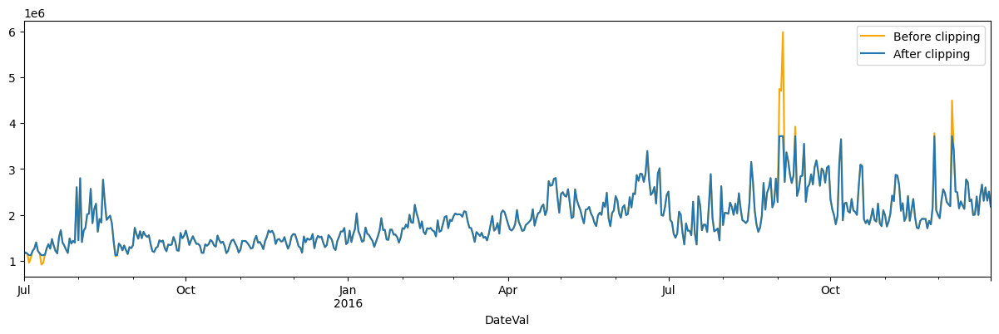

-----------------End: clipping data-------------
-----------------Start: Plotting values for basic view-------------


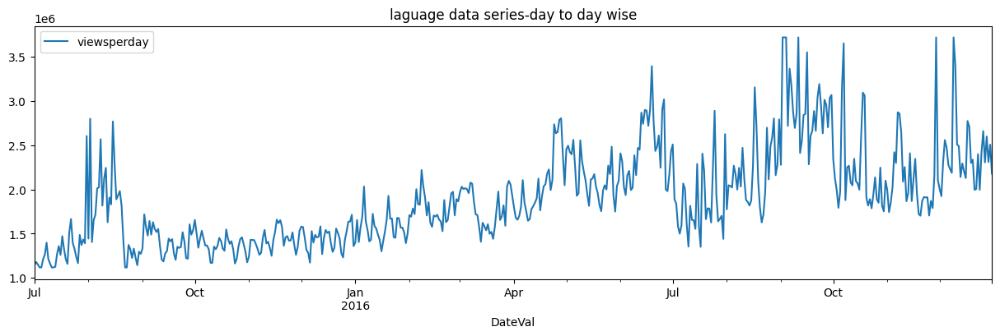

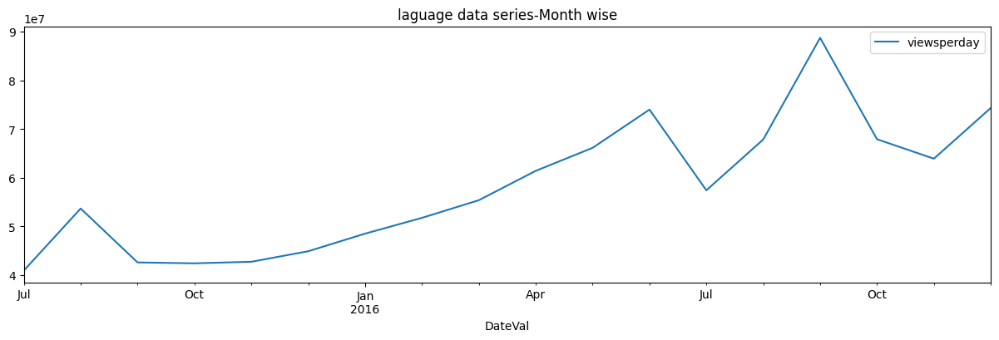

-----------------End: Plotting values for basic view-------------
-------Start SARIMA Forecasting : ORDER-(3, 1, 2)-SEASONAL ORDER-(3, 1, 2, 15)------


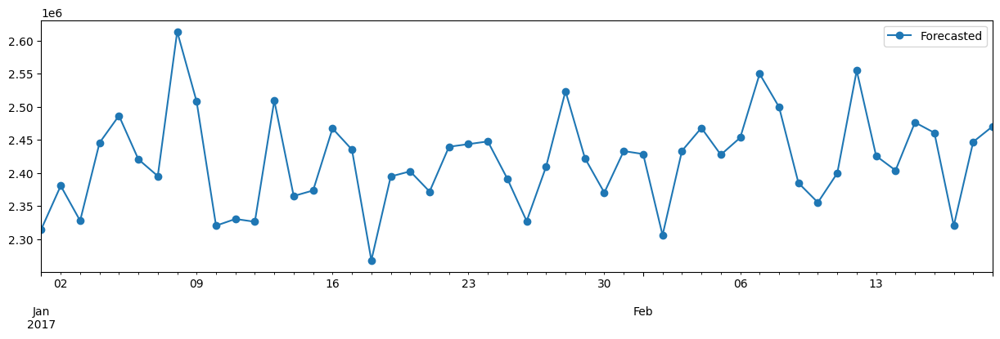

count    5.000000e+01
mean     2.418655e+06
std      7.105249e+04
min      2.268043e+06
25%      2.372308e+06
50%      2.424115e+06
75%      2.458900e+06
max      2.613590e+06
Name: forecasted_Views_commons, dtype: float64
-------END of forecasting-------
-------------------------------------------------------END OF LANGUAGE-commons-ANALYSIS------


In [ ]:
pred_df_commons=pipeline_forecast('commons',languageAndDateTimeSeries,(3, 1, 2),(3, 1, 2, 15),50)

In [ ]:
final_predForAllLanguages=pd.concat([pred_df_en,pred_df_fr,pred_df_de,pred_df_ja,pred_df_ru,
                                     pred_df_es,pred_df_zh,pred_df_commons],axis=1)

In [ ]:
final_predForAllLanguages.shape

(50, 8)

In [ ]:
final_predForAllLanguages.describe()

,forecasted_Views_en,forecasted_Views_fr,forecasted_Views_de,forecasted_Views_ja,forecasted_Views_ru,forecasted_Views_es,forecasted_Views_zh,forecasted_Views_commons
count,5.000000e+01,5.000000e+01,5.000000e+01,5.000000e+01,5.000000e+01,5.000000e+01,5.000000e+01,5.000000e+01
mean,1.354455e+08,1.251357e+07,1.853676e+07,2.099664e+07,1.348443e+07,1.320936e+07,6.268252e+06,2.418655e+06
std,3.238975e+06,3.366532e+05,4.636382e+05,7.266027e+05,7.459563e+05,1.572401e+06,2.923420e+05,7.105249e+04
min,1.260921e+08,1.179669e+07,1.741944e+07,1.905499e+07,1.213601e+07,1.035178e+07,5.778586e+06,2.268043e+06
25%,1.335073e+08,1.233524e+07,1.823102e+07,2.054904e+07,1.291241e+07,1.185586e+07,5.998492e+06,2.372308e+06
50%,1.357722e+08,1.248353e+07,1.854095e+07,2.103478e+07,1.334431e+07,1.322819e+07,6.288840e+06,2.424115e+06
75%,1.374566e+08,1.268617e+07,1.884205e+07,2.160094e+07,1.394517e+07,1.486394e+07,6.546654e+06,2.458900e+06
max,1.417142e+08,1.345391e+07,1.931520e+07,2.230931e+07,1.524191e+07,1.587685e+07,6.895621e+06,2.613590e+06


In [ ]:
resultsdf=final_predForAllLanguages.aggregate(['sum','min','mean','std','max'])

In [ ]:
resultsdf.to_csv('results.csv')

In [ ]:
resultsdf.T.sort_values(by='sum',ascending=False)

,sum,min,mean,std,max
forecasted_Views_en,6.772277e+09,1.260921e+08,1.354455e+08,3.238975e+06,1.417142e+08
forecasted_Views_ja,1.049832e+09,1.905499e+07,2.099664e+07,7.266027e+05,2.230931e+07
forecasted_Views_de,9.268379e+08,1.741944e+07,1.853676e+07,4.636382e+05,1.931520e+07
forecasted_Views_ru,6.742217e+08,1.213601e+07,1.348443e+07,7.459563e+05,1.524191e+07
forecasted_Views_es,6.604680e+08,1.035178e+07,1.320936e+07,1.572401e+06,1.587685e+07
forecasted_Views_fr,6.256786e+08,1.179669e+07,1.251357e+07,3.366532e+05,1.345391e+07
forecasted_Views_zh,3.134126e+08,5.778586e+06,6.268252e+06,2.923420e+05,6.895621e+06
forecasted_Views_commons,1.209328e+08,2.268043e+06,2.418655e+06,7.105249e+04,2.613590e+06


In [ ]:
resultsdf.T.sort_values(by='max',ascending=False)

,sum,min,mean,std,max
forecasted_Views_en,6.772277e+09,1.260921e+08,1.354455e+08,3.238975e+06,1.417142e+08
forecasted_Views_ja,1.049832e+09,1.905499e+07,2.099664e+07,7.266027e+05,2.230931e+07
forecasted_Views_de,9.268379e+08,1.741944e+07,1.853676e+07,4.636382e+05,1.931520e+07
forecasted_Views_es,6.604680e+08,1.035178e+07,1.320936e+07,1.572401e+06,1.587685e+07
forecasted_Views_ru,6.742217e+08,1.213601e+07,1.348443e+07,7.459563e+05,1.524191e+07
forecasted_Views_fr,6.256786e+08,1.179669e+07,1.251357e+07,3.366532e+05,1.345391e+07
forecasted_Views_zh,3.134126e+08,5.778586e+06,6.268252e+06,2.923420e+05,6.895621e+06
forecasted_Views_commons,1.209328e+08,2.268043e+06,2.418655e+06,7.105249e+04,2.613590e+06


In [ ]:
resultsdf.T.sort_values(by='mean',ascending=False)

,sum,min,mean,std,max
forecasted_Views_en,6.772277e+09,1.260921e+08,1.354455e+08,3.238975e+06,1.417142e+08
forecasted_Views_ja,1.049832e+09,1.905499e+07,2.099664e+07,7.266027e+05,2.230931e+07
forecasted_Views_de,9.268379e+08,1.741944e+07,1.853676e+07,4.636382e+05,1.931520e+07
forecasted_Views_ru,6.742217e+08,1.213601e+07,1.348443e+07,7.459563e+05,1.524191e+07
forecasted_Views_es,6.604680e+08,1.035178e+07,1.320936e+07,1.572401e+06,1.587685e+07
forecasted_Views_fr,6.256786e+08,1.179669e+07,1.251357e+07,3.366532e+05,1.345391e+07
forecasted_Views_zh,3.134126e+08,5.778586e+06,6.268252e+06,2.923420e+05,6.895621e+06
forecasted_Views_commons,1.209328e+08,2.268043e+06,2.418655e+06,7.105249e+04,2.613590e+06


Insight: en,ja,de- top 3 languages among total no.of views forecasted for 50 days
Insight: fr,zh,commons- least 3 languages among total no.of views in forecasted 50 days 
Insight: en,ja,de- top 3 languages among max no.of views in forecasted 50 days 
Insight: fr,zh,commons- least 3 languages among average no.of views in forecasted 50 days 
Insight: en,ja,de- top 3 languages among average no.of views in forecasted 50 days 

Final Insight: Forecasting is stable for en,ja,de languages and they are having good share in terms of total views/avg no.of views. We can concentrate more on these languages.

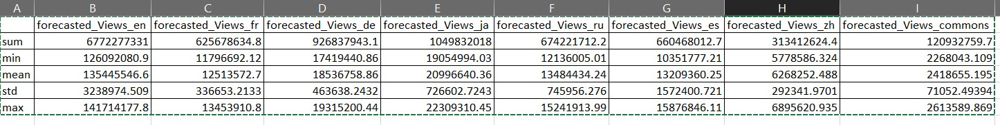!

# Section 9: Prophet

In [ ]:
pip install prophet

  Using cached prophet-1.1.2-py3-none-win_amd64.whl (12.1 MB)
Note: you may need to restart the kernel to use updated packages.


ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: 'C:\\Users\\vinay\\AppData\\Local\\Packages\\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\\LocalCache\\local-packages\\Python310\\site-packages\\prophet\\stan_model\\cmdstan-2.26.1\\stan\\lib\\stan_math\\lib\\tbb_2019_U8\\include\\tbb\\internal\\_flow_graph_tagged_buffer_impl.h'
HINT: This error might have occurred since this system does not have Windows Long Path support enabled. You can find information on how to enable this at https://pip.pypa.io/warnings/enable-long-paths


[notice] A new release of pip available: 22.3.1 -> 23.0
[notice] To update, run: C:\Users\vinay\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [ ]:
from fbprophet import Prophet   # from fbprophet import Prophet

ModuleNotFoundError: No module named 'fbprophet'

Tried in google collab: https://github.com/araveeti-vinay/ML-AI-Learnings/tree/main/Recommender%20Systems


# Section 10: Questionnaire

que: Defining the problem statements and where can this and modifications of this be used?
ans: Problem statement is forecasting page views based on previous dates and views.Time serires forecasting can be used in weather forecasting,
stock sales forecasting,retail marketing etc

que: Write 3 inferences you made from the data visualizations
ans: 1) Forecasting is stable for en,ja,de languages and they are having good share in terms of total views/avg no.of views. We can concentrate more on these languages.
2) All-access pages more on en-language,covering both desktop and mobile sites.
3) Mobile web access related pages are more in languages called fr,es,commons

que: What does the decomposition of series do?
ans: Time series are a combination of (mainly) three components: Trend, Seasonality and Residuals.Decomposition make time series into 
three components for further analysis.

que: What level of differencing gave you a stationary series?
ans: for few languages which are already stationary, no need occurred for differnecing.For non stationary series, 2/3 made them stationary.

que: Difference between arima, sarima & sarimax.
ans: ARIMA takes into account the past values (autoregressive, moving average) and predicts future values based on that. SARIMA similarly uses past values but also takes into account any seasonality patterns. Since SARIMA brings in seasonality as a parameter, 
it’s significantly more powerful than ARIMA in forecasting complex data spaces containing cycles.
SARIMAX is more or less same as SARIMA algorithm,but SARIMAX considers exogenous variables as well for forecasting

que: Compare the number of views in different languages
ans: Answered through code in notebook for given data and forecasted data as well

# Insights and Recommendations

In [ ]:
Insight: ja,en,fr - having spider related access-origin type more.

Recommendation: SPRIDER access means bot access. we need to design model after cleaning these specific views,
as showing ads to robots doesnot make sense to business

Insight: en,ja,de- top 3 languages among total no.of views forecasted for 50 days
Insight: fr,zh,commons- least 3 languages among total no.of views in forecasted 50 days 
Insight: en,ja,de- top 3 languages among max no.of views in forecasted 50 days 
Insight: fr,zh,commons- least 3 languages among average no.of views in forecasted 50 days 
Insight: en,ja,de- top 3 languages among average no.of views in forecasted 50 days 

Recommendation: Forecasting is stable for en,ja,de languages and they are having good share in terms of total views/avg no.of views. We can concentrate more on these languages.

Insight: all-access pages more on en-language,covering both desktop and mobile sites.
Insight: mobile web access related pages are more in fr,es,commons

Recommendation: Based on this browser specific filtering need to be designed for ads display.Specific ads for specific browser type will be good technique.
 